In [1]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from utils import *

In [2]:
df = pd.read_pickle('../data/highered.pkl')
data_dict = pd.read_pickle('../data/data_dictionary.pkl')

In [3]:
df.shape

(531216, 126)

In [4]:
df = df.drop(['Unnamed: 0'], axis=1)
df.head()

,PERSONID,YEAR,WEIGHT,SAMPLE,SURID,MRDG,MR03Y5,NMRMEDR,NMRMEMG,LFSTAT,...,ICCOMM,ICTRLA,ICTRLH,ICWBVT,NWFAM,NWLAY,NWNOND,NWOCNA,NWOTP,NWSTU
0,50000030000000003,2003,372.6047,601,1,1,1981,719995,7,1,...,NaN,NaN,NaN,NaN,98,98,98,98,98,98
1,50000030000000004,2003,341.7484,601,1,1,1961,719995,7,1,...,NaN,NaN,NaN,NaN,98,98,98,98,98,98
2,50000030000000005,2003,522.5629,601,1,1,1966,799995,7,1,...,NaN,NaN,NaN,NaN,98,98,98,98,98,98
3,50000030000000006,2003,135.0212,601,1,2,1996,298895,2,1,...,NaN,NaN,NaN,NaN,98,98,98,98,98,98
4,50000030000000104,2003,907.4463,601,1,2,1976,438995,4,3,...,NaN,NaN,NaN,NaN,0,0,0,0,1,0


In [5]:
df.isnull().sum()

PERSONID    0
YEAR        0
WEIGHT      0
SAMPLE      0
SURID       0
           ..
NWLAY       0
NWNOND      0
NWOCNA      0
NWOTP       0
NWSTU       0
Length: 125, dtype: int64

In [6]:
df.describe()

,PERSONID,YEAR,WEIGHT,SAMPLE,SURID,MRDG,MR03Y5,NMRMEDR,NMRMEMG,LFSTAT,...,ICCOMM,ICTRLA,ICTRLH,ICWBVT,NWFAM,NWLAY,NWNOND,NWOCNA,NWOTP,NWSTU
count,5.312160e+05,531216.000000,531216.000000,531216.000000,531216.000000,531216.000000,531216.000000,531216.000000,531216.000000,531216.000000,...,105064.000000,105064.000000,105064.000000,105064.000000,531216.000000,531216.000000,531216.000000,531216.000000,531216.000000,531216.000000
mean,6.791717e+16,2008.132820,232.275293,806.921324,1.485305,2.001598,1989.843124,475942.620032,4.230213,1.268002,...,78.818787,78.703562,78.736189,78.732601,83.484483,83.475526,83.492984,83.481531,83.551228,83.478790
std,4.380479e+16,3.438795,409.307824,142.622619,0.668826,0.943027,38.762857,181563.579399,1.824249,0.659893,...,38.644287,38.876939,38.811236,38.818469,34.777917,34.799282,34.757625,34.784960,34.618224,34.791497
min,2.000000e+16,2003.000000,0.369800,601.000000,1.000000,1.000000,1950.000000,198895.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000904e+16,2006.000000,29.106000,701.000000,1.000000,1.000000,1981.000000,318730.000000,3.000000,1.000000,...,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
50%,5.000004e+16,2008.000000,101.752800,801.000000,1.000000,2.000000,1991.000000,459395.000000,4.000000,1.000000,...,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
75%,1.101000e+17,2010.000000,262.868850,902.000000,2.000000,3.000000,2001.000000,611995.000000,6.000000,1.000000,...,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
max,1.401011e+17,2013.000000,14782.721400,1002.000000,3.000000,5.000000,9999.000000,999999.000000,9.000000,3.000000,...,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000


Since this is a huge multi-dimensional dataset, we must reduce it to relevant variables only. Let's inspect the unique values for each column and glean some insights into what they mean.

In [7]:
for col in df.columns:
    print(f'{col}: {data_dict[col]["var_desc_short"]} ({data_dict[col]["data_values"]})')

PERSONID: Individual identification number ({})
YEAR: Survey year ({})
WEIGHT: SESTAT weight ({})
SAMPLE: Sample identifier ({101: 'SESTAT NSCG 1993', 102: 'SESTAT SDR 1993', 103: 'SESTAT NSRCG 1993', 111: 'NSCG 1993', 201: 'SESTAT NSCG 1995', 202: 'SESTAT SDR 1995', 203: 'SESTAT NSRCG 1995', 301: 'SESTAT NSCG 1997', 302: 'SESTAT SDR 1997', 303: 'SESTAT NSRCG 1997', 401: 'SESTAT NSCG 1999', 402: 'SESTAT SDR 1999', 403: 'SESTAT NSRCG 1999', 512: 'SDR 2001', 513: 'NSRCG 2001', 601: 'SESTAT NSCG 2003', 602: 'SESTAT SDR 2003', 603: 'SESTAT NSRCG 2003', 611: 'NSCG 2003', 612: 'SDR 2003', 613: 'NSRCG 2003', 701: 'SESTAT NSCG 2006', 702: 'SESTAT SDR 2006', 703: 'SESTAT NSRCG 2006', 712: 'SDR 2006', 713: 'NSRCG 2006', 801: 'SESTAT NSCG 2008', 802: 'SESTAT SDR 2008', 803: 'SESTAT NSRCG 2008', 812: 'SDR 2008', 813: 'NSRCG 2008', 901: 'SESTAT NSCG 2010', 902: 'SESTAT SDR 2010', 903: 'SESTAT NSRCG 2010', 911: 'NSCG 2010', 912: 'SDR 2010', 913: 'NSRCG 2010', 914: 'ISDR 2010', 1001: 'SESTAT NSCG 201

We see there are some columns which make sense to keep, and some which are supported by the literature, for example JOBSATIS, research-related activities (like SUPWK, PAPERS, ARTICLE, PRMBR, PROMTGI, and BOOKSP), SALARY, benefits (like JOBINS, JOBPENS, JOBPROFT, and JOBVAC), etc. (Dorenkamp & Weiß, 2017; Szromek & Wolniak, 2020; Xu, 2008; Makridis, 2021).

So let's only keep these columns and remove the rest.

In [8]:
df2 = df.copy()
df2 = df2[df2['MRDG'] == 3].drop('MRDG', axis=1)
print(df2.shape)
df2.head()

(158237, 124)


,PERSONID,YEAR,WEIGHT,SAMPLE,SURID,MR03Y5,NMRMEDR,NMRMEMG,LFSTAT,WRKG,...,ICCOMM,ICTRLA,ICTRLH,ICWBVT,NWFAM,NWLAY,NWNOND,NWOCNA,NWOTP,NWSTU
11,50000030000000306,2003,71.5000,601,1,1971,527250,5,1,1,...,NaN,NaN,NaN,NaN,98,98,98,98,98,98
173,50000030000060005,2003,107.1818,601,1,2001,799995,7,1,1,...,NaN,NaN,NaN,NaN,98,98,98,98,98,98
256,50000030000080906,2003,107.9710,601,1,1991,226395,2,1,1,...,NaN,NaN,NaN,NaN,98,98,98,98,98,98
286,50000030001000101,2003,69.1369,601,1,1951,547280,5,3,0,...,NaN,NaN,NaN,NaN,0,0,0,0,1,0
290,50000030001000209,2003,87.9956,601,1,1991,318730,3,1,1,...,NaN,NaN,NaN,NaN,98,98,98,98,98,98


In [9]:
df2.isnull().sum()

PERSONID    0
YEAR        0
WEIGHT      0
SAMPLE      0
SURID       0
           ..
NWLAY       0
NWNOND      0
NWOCNA      0
NWOTP       0
NWSTU       0
Length: 124, dtype: int64

After checking for nulls, we see there are huge numbers of rows that have missing data. Let's look at the correlation matrix to see if we can see what's going on here.

In [10]:
corr = df2.corr()
corr.style.background_gradient('coolwarm')

It seems that certain columns just have a lot of missing data. This is because the survey was conducted over multiple distinct years, and the survey design changed between those years. This means that some columns were not existent at the time some of the surveys were conducted, hence the null values.

Let's investigate some variables of interest now, and see which ones we will use to answer our research question.

### EMSEC: Employer sector. 

1 = 2 year college or other school system, 2 = 4 year college or medical institution, 3 = Government, 4 = Business or industry, 5 = Non-US government, 98 = Logical Skip.

In [11]:
df2.groupby(['EMSEC'])['EMSEC'].count()

EMSEC
1      5219
2     61688
3     12951
4     58078
98    20301
Name: EMSEC, dtype: int64

We will drop the 'skip' values for this column and all proceeding columns with that value, as it does not add any meaningful analysis. We will drop EMSEC values of 5 as well, since we are not interested in a non-US government employment type.

In [12]:
df2 = df2[df2['EMSEC'].isin([2,4])]
df2.shape

(119766, 124)

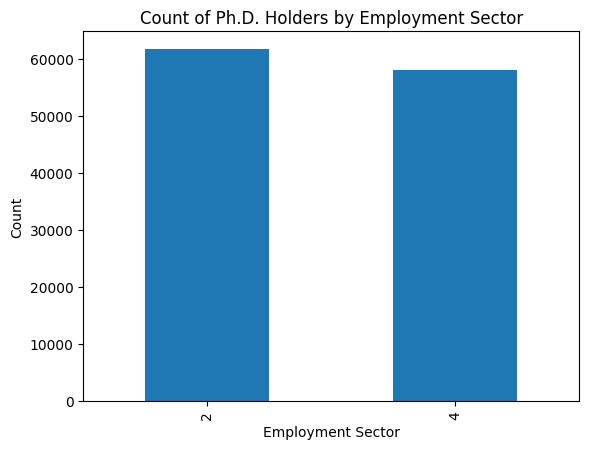

In [13]:
# plt.plot(df2.groupby(['EMSEC'])['EMSEC'].count())
df2.groupby(['EMSEC'])['EMSEC'].count().plot(kind='bar')
plt.title('Count of Ph.D. Holders by Employment Sector')
plt.xlabel('Employment Sector')
plt.ylabel('Count')
plt.show()

In [14]:
df2.isnull()

,PERSONID,YEAR,WEIGHT,SAMPLE,SURID,MR03Y5,NMRMEDR,NMRMEMG,LFSTAT,WRKG,...,ICCOMM,ICTRLA,ICTRLH,ICWBVT,NWFAM,NWLAY,NWNOND,NWOCNA,NWOTP,NWSTU
11,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
173,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
256,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
290,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
294,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
531208,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
531209,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
531211,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False
531213,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,False,False,False,False,False,False


In [15]:
for col in df.columns:
    print(f'{col}: {data_dict[col]["var_desc_short"]} ({data_dict[col]["data_values"]})')

PERSONID: Individual identification number ({})
YEAR: Survey year ({})
WEIGHT: SESTAT weight ({})
SAMPLE: Sample identifier ({101: 'SESTAT NSCG 1993', 102: 'SESTAT SDR 1993', 103: 'SESTAT NSRCG 1993', 111: 'NSCG 1993', 201: 'SESTAT NSCG 1995', 202: 'SESTAT SDR 1995', 203: 'SESTAT NSRCG 1995', 301: 'SESTAT NSCG 1997', 302: 'SESTAT SDR 1997', 303: 'SESTAT NSRCG 1997', 401: 'SESTAT NSCG 1999', 402: 'SESTAT SDR 1999', 403: 'SESTAT NSRCG 1999', 512: 'SDR 2001', 513: 'NSRCG 2001', 601: 'SESTAT NSCG 2003', 602: 'SESTAT SDR 2003', 603: 'SESTAT NSRCG 2003', 611: 'NSCG 2003', 612: 'SDR 2003', 613: 'NSRCG 2003', 701: 'SESTAT NSCG 2006', 702: 'SESTAT SDR 2006', 703: 'SESTAT NSRCG 2006', 712: 'SDR 2006', 713: 'NSRCG 2006', 801: 'SESTAT NSCG 2008', 802: 'SESTAT SDR 2008', 803: 'SESTAT NSRCG 2008', 812: 'SDR 2008', 813: 'NSRCG 2008', 901: 'SESTAT NSCG 2010', 902: 'SESTAT SDR 2010', 903: 'SESTAT NSRCG 2010', 911: 'NSCG 2010', 912: 'SDR 2010', 913: 'NSRCG 2010', 914: 'ISDR 2010', 1001: 'SESTAT NSCG 201

In [16]:
data_dict['EMSEC']

{'var_desc_short': 'Employer sector',
 'var_desc': "EMSEC gives the summary level or general version of the sector of the respondent's main employer.",
 'data_values': {1: '2 year college or other school system',
  2: '4 year college or medical institution',
  3: 'Government',
  4: 'Business or industry',
  5: 'Non-US government',
  98: 'Logical Skip'}}

In [17]:
def plot_years_and_variable(df, col_name):

    # Suppress warnings
    warnings.filterwarnings("ignore")
    
    # Map 'EMSEC' values to corresponding labels
    emsec_mapping = {2: 'Academia', 4: 'Industry'}
    df['EMSEC_mapped'] = df['EMSEC'].map(emsec_mapping)

    # Combine 'YEAR' and 'EMSEC' into a single variable for the x-axis
    df['YEAR_EMSEC'] = df['YEAR'].astype(str) + ' - ' + df['EMSEC_mapped']

    # Group by 'YEAR_EMSEC' and the specified column, and count occurrences
    grouped_df = df.groupby(['YEAR_EMSEC', col_name])[['YEAR']].count().rename(columns={'YEAR': 'Count'}).reset_index()

    # Get variable description from the data dictionary
    var_desc = data_dict[col_name]['var_desc_short']
    data_desc = data_dict[col_name]['data_values']

    # Create a bar plot with 'YEAR_EMSEC' on the x-axis
    plt.figure(figsize=(16, 8))
    ax = sns.barplot(x='YEAR_EMSEC', y='Count', hue=col_name, ci=None, dodge=True, data=grouped_df)
    plt.title(f'Count of Ph.D. Holders by Year & Employment Sector vs {var_desc}')
    plt.xlabel('Year and Employment Sector')
    plt.ylabel('Count')
    plt.legend(title=col_name, title_fontsize='12', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

    # Add subtitles
    subtitle1 = f'{col_name} = {var_desc}'

    fig = plt.gcf()
    fig.text(0.5, 0.92, subtitle1, ha='center')
    
    # Show the plot
    plt.tight_layout()
    plt.show()

In [18]:
columns_to_drop = []
columns_to_keep = []
columns_to_inspect = []
constants = []

### NMRMEDR

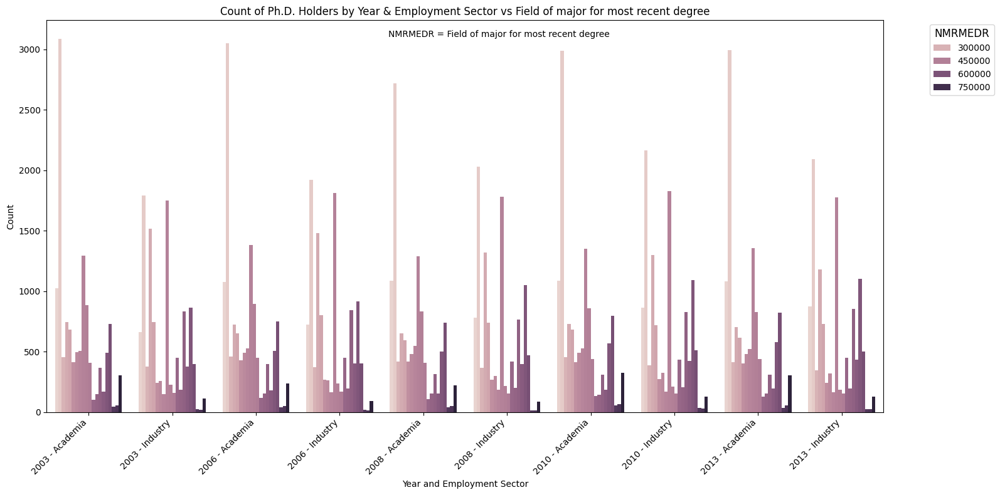

In [19]:
plot_years_and_variable(df2, 'NMRMEDR')

There is a range of values here to unpack. We need to investigate this variable further.

In [20]:
columns_to_inspect.append('NMRMEDR')

### NMRMEMG

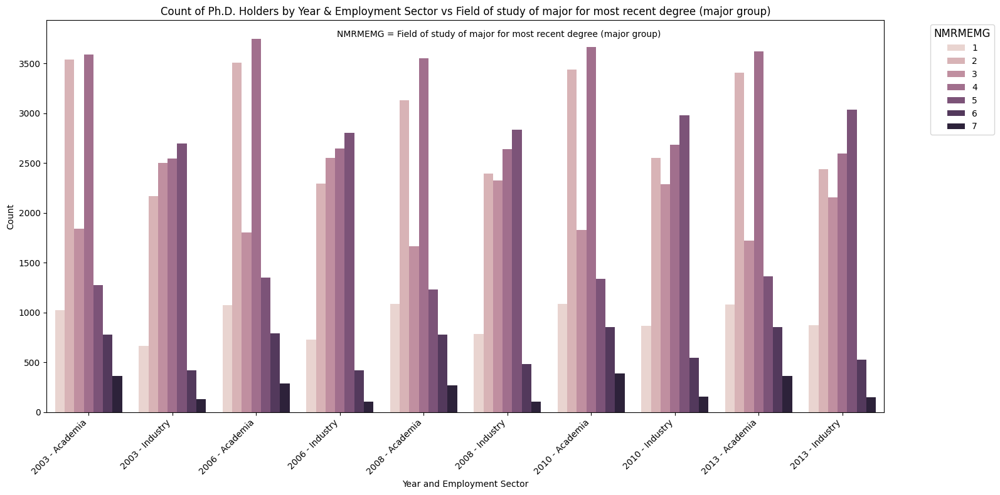

In [21]:
plot_years_and_variable(df2, 'NMRMEMG')

This variable is very similar as the previous variable and needs to be investigated further.

In [22]:
columns_to_inspect.append('NMRMEMG')

### LFSTAT

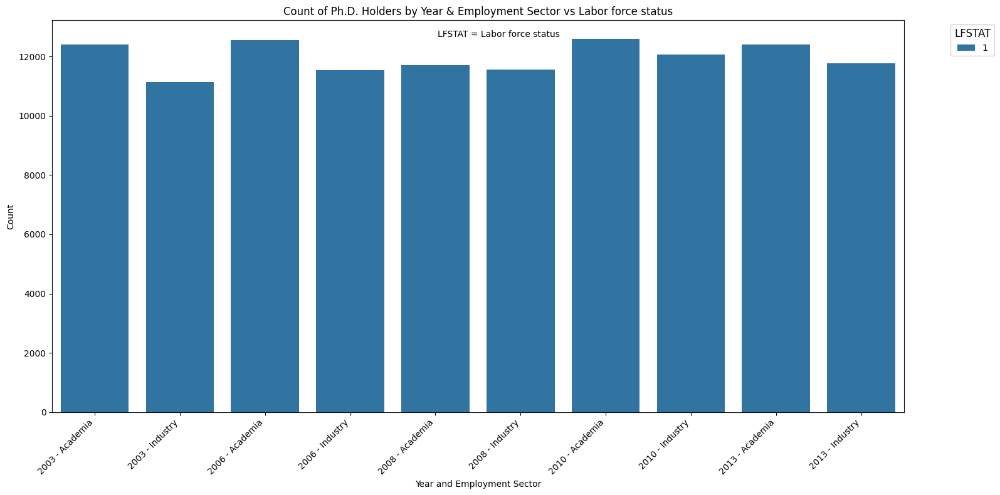

In [23]:
plot_years_and_variable(df2, 'LFSTAT')

There's only one value for this variable. Let's check what it is.

In [24]:
data_dict['LFSTAT']

{'var_desc_short': 'Labor force status',
 'var_desc': "LFSTAT is the respondent's labor force status.",
 'data_values': {1: 'Employed', 2: 'Unemployed', 3: 'Not in the labor force'}}

1 means employed, so we conclude that everyone in our sample is employed. We can add this column as a constant column and drop it as well.

In [25]:
columns_to_drop.append('LFSTAT')
constants.append('LFSTAT')

### WRKG

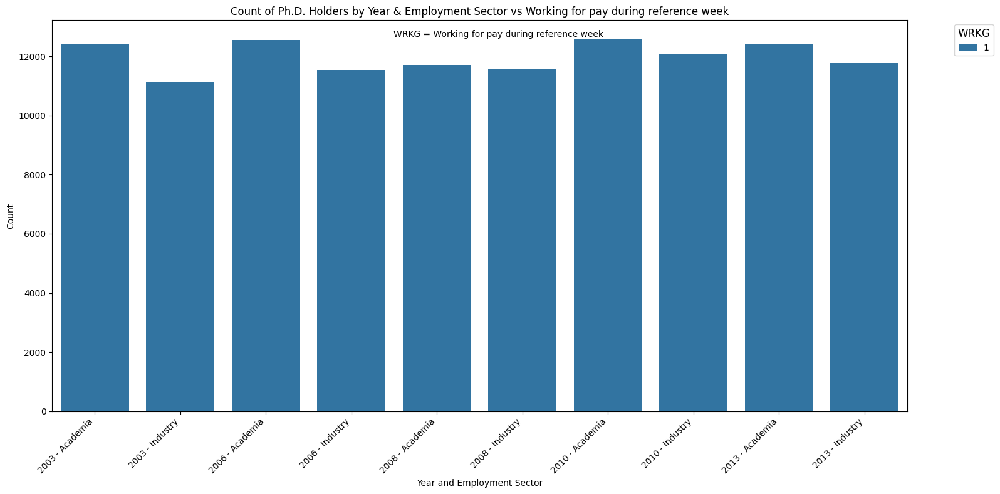

In [26]:
plot_years_and_variable(df2, 'WRKG')

There's only one value for this variable. Let's check what it is.

In [27]:
data_dict['WRKG']

{'var_desc_short': 'Working for pay during reference week',
 'var_desc': 'WRKG indicates whether or not the respondent was working for pay during the survey reference week.',
 'data_values': {0: 'No', 1: 'Yes'}}

1 means the respondents were working for pay during the reference week. We can add this column as a constant column and drop it as well.

In [28]:
columns_to_drop.append('WRKG')
constants.append('WRKG')

### FPTIND

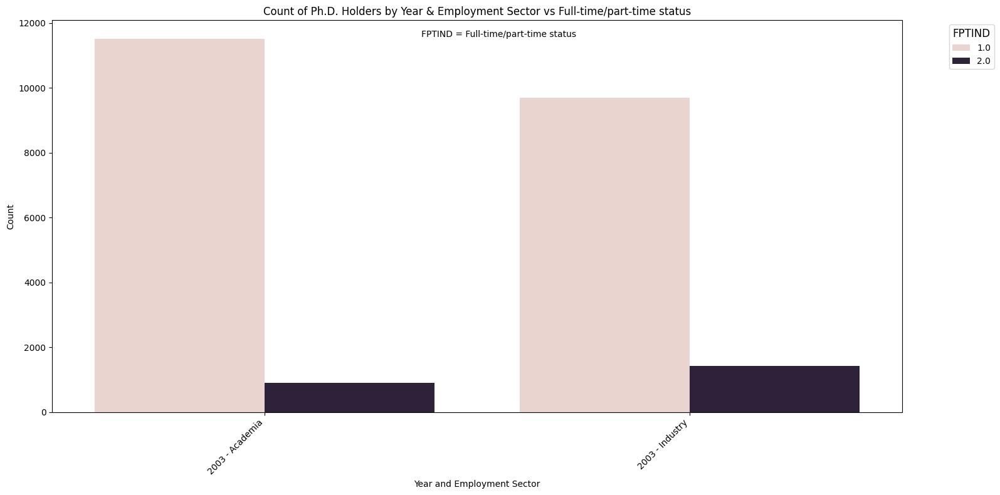

In [29]:
plot_years_and_variable(df2, 'FPTIND')

There is only data from 2003 for this column. We should drop this column.

In [30]:
columns_to_drop.append('FPTIND')

### WRKGP

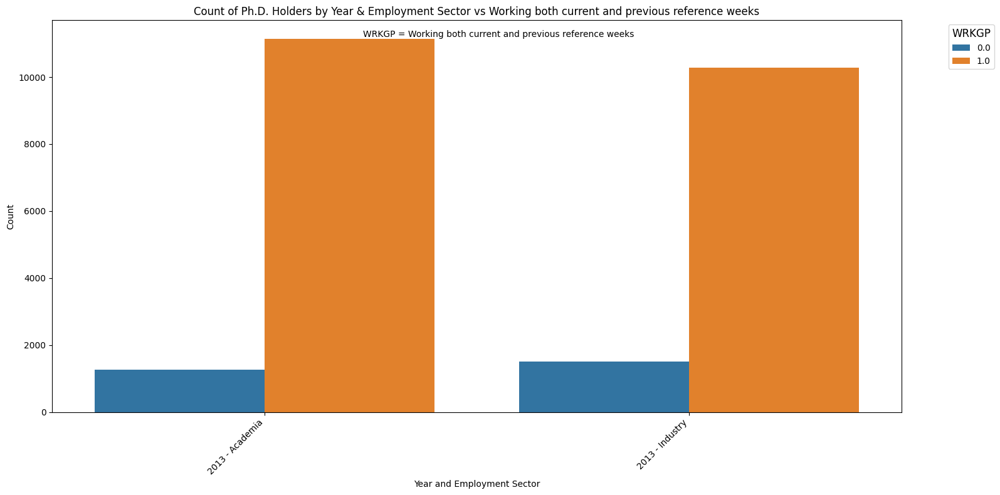

In [31]:
plot_years_and_variable(df2, 'WRKGP')

There is only data from 2013 for this column. We should drop this column.

In [32]:
columns_to_drop.append('WRKGP')

### EMSMI

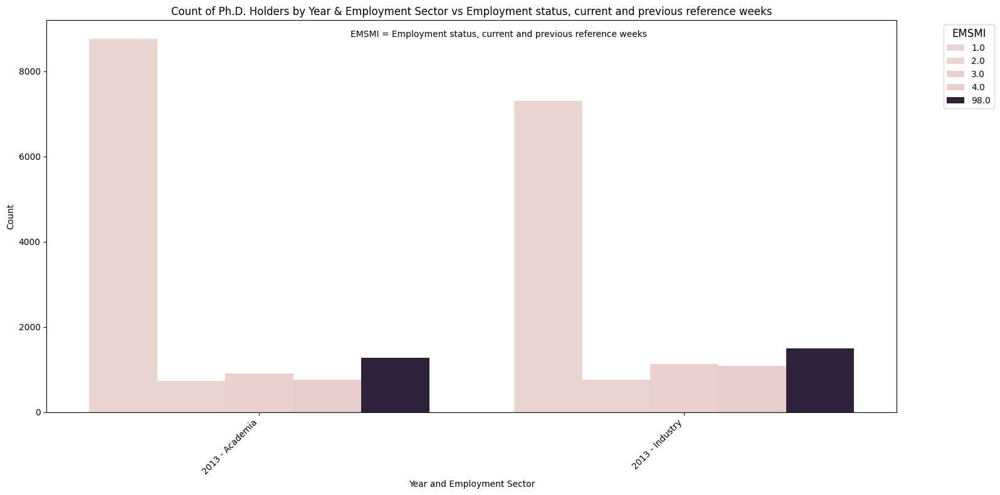

In [33]:
plot_years_and_variable(df2, 'EMSMI')

There is only data from 2013 for this column. We should drop this column.

In [34]:
columns_to_drop.append('EMSMI')

### HRSWKGR

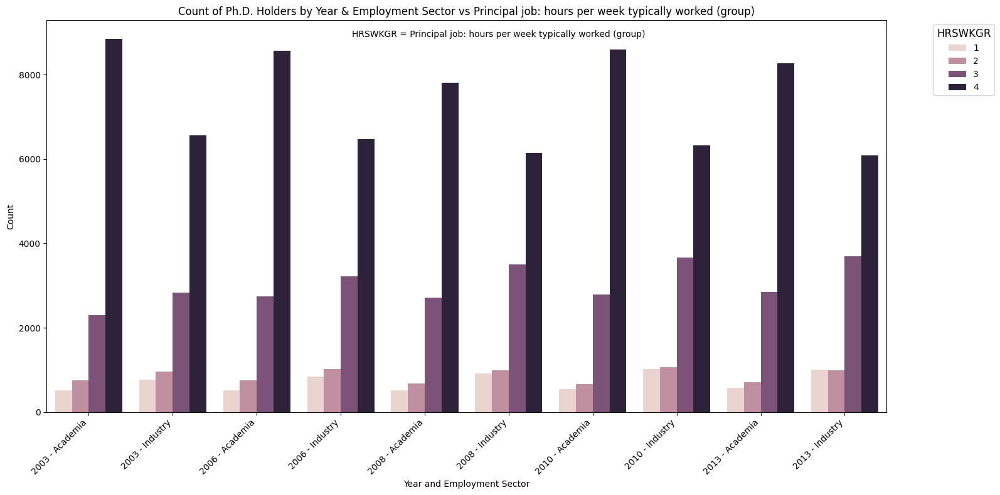

In [35]:
plot_years_and_variable(df2, 'HRSWKGR')

We need to inspect the data values more.

In [36]:
data_dict['HRSWKGR']

{'var_desc_short': 'Principal job: hours per week typically worked (group)',
 'var_desc': 'HRSWKGR reports the typical hours per week that the respondent works at his/her principal job categorized into four groups.  The variable HRSWK also provides this information for SESTAT samples prior to 2000, however, HRSWK is not intervalled.',
 'data_values': {1: '20 or less',
  2: '21 - 35',
  3: '36 - 40',
  4: 'Greater than 40',
  98: 'Logical Skip'}}

It seems we have divisions of hours worked per week. From the plot, we see that there are less respondents who work more than 40 hours a week in industry compared to academia, i.e. it seems more common in academia to work more than 40 hours per week. We will keep this variable, as it may be a factor leading to a PhD holder's choice of working in academia or industry.

In [37]:
columns_to_keep.append('HRSWKGR')

### WKSWKGR

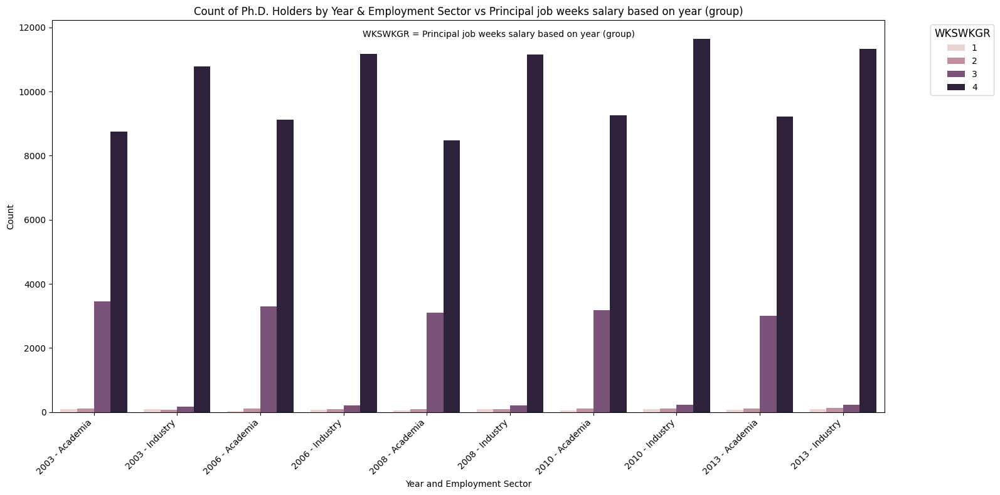

In [38]:
plot_years_and_variable(df2, 'WKSWKGR')

We need more insight into what these data values mean.

In [39]:
data_dict['WKSWKGR']

{'var_desc_short': 'Principal job weeks salary based on year (group)',
 'var_desc': "WKSWKGR reports the interval number of weeks the basic annual salary of the respondent's principal job was based on during a 52-week year, including sick leave and paid vacation.",
 'data_values': {1: '1-10 weeks',
  2: '11-20 weeks',
  3: '21-39 weeks',
  4: '40-52 weeks',
  98: 'Logical Skip'}}

This variable is looking at how the respondents' salaries are paid on a batch basis of weeks. It seems that the norm in industry is to be paid on intervals of 40-52 weeks, whereas in academia, there are two main types of pay intervals: 21-39 weeks, and 40-52 weeks. The 21-39 week interval is most likely based on the academic schedule. We will keep this variable.

In [40]:
columns_to_keep.append('WKSWKGR')

### JOBINS

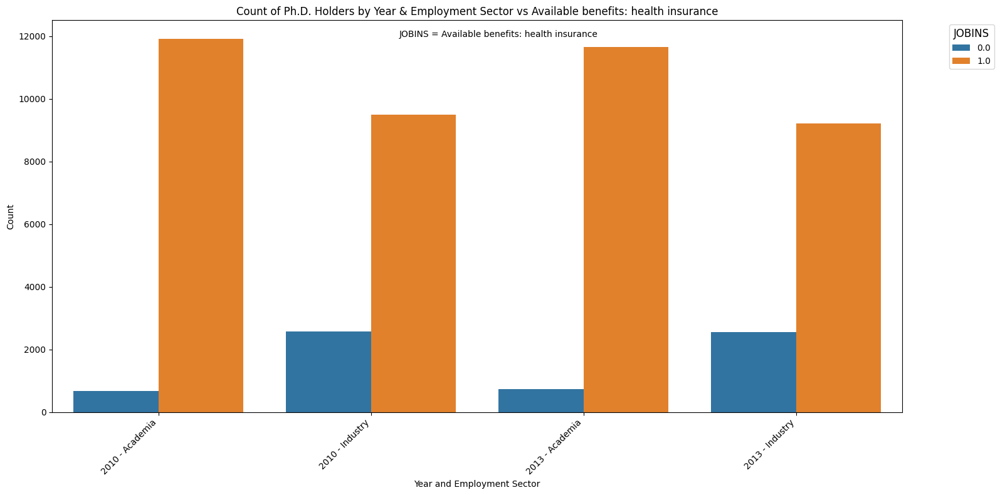

In [41]:
plot_years_and_variable(df2, 'JOBINS')

This column only has data for 2010 and 2013. We will drop it.

In [42]:
columns_to_drop.append('JOBINS')

### JOBPENS

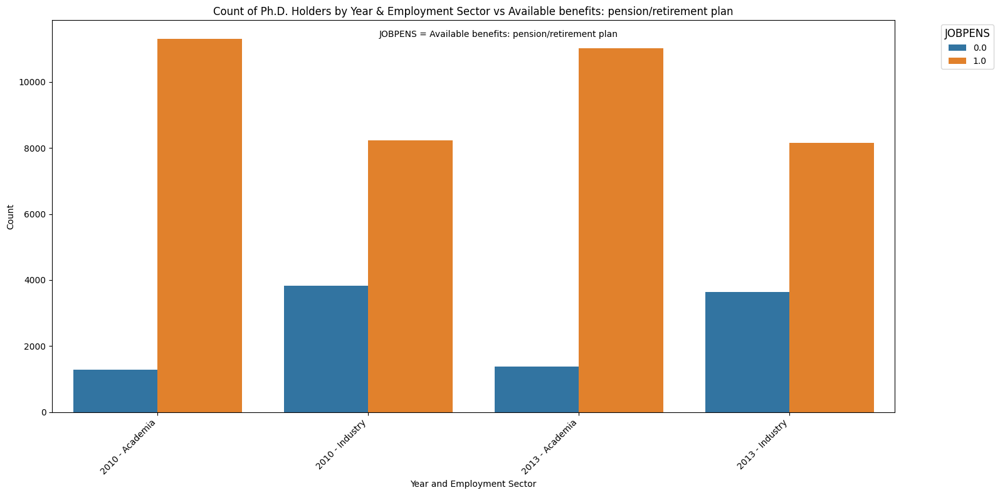

In [43]:
plot_years_and_variable(df2, 'JOBPENS')

This column only has data for 2010 and 2013. We will drop it.

In [44]:
columns_to_drop.append('JOBPENS')

### JOBPROFT

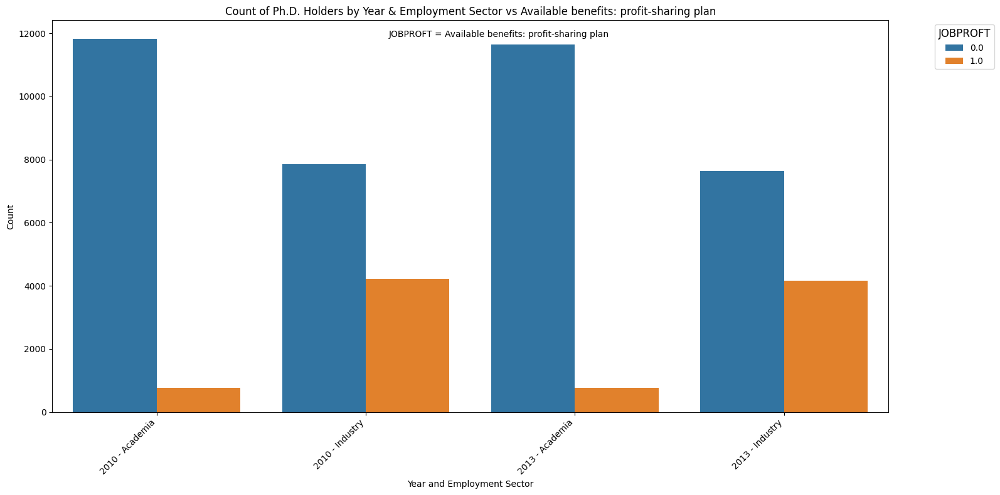

In [45]:
plot_years_and_variable(df2, 'JOBPROFT')

This column only has data for 2010 and 2013. We will drop it.

In [46]:
columns_to_drop.append('JOBPROFT')

### JOBVAC

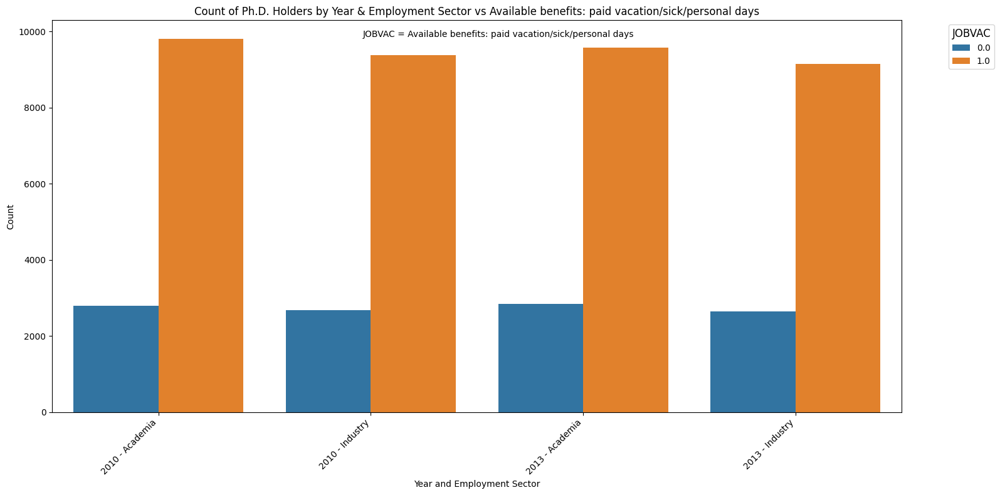

In [47]:
plot_years_and_variable(df2, 'JOBVAC')

This column only has data for 2010 and 2013. We will drop it.

In [48]:
columns_to_drop.append('JOBVAC')

### PTWTFT

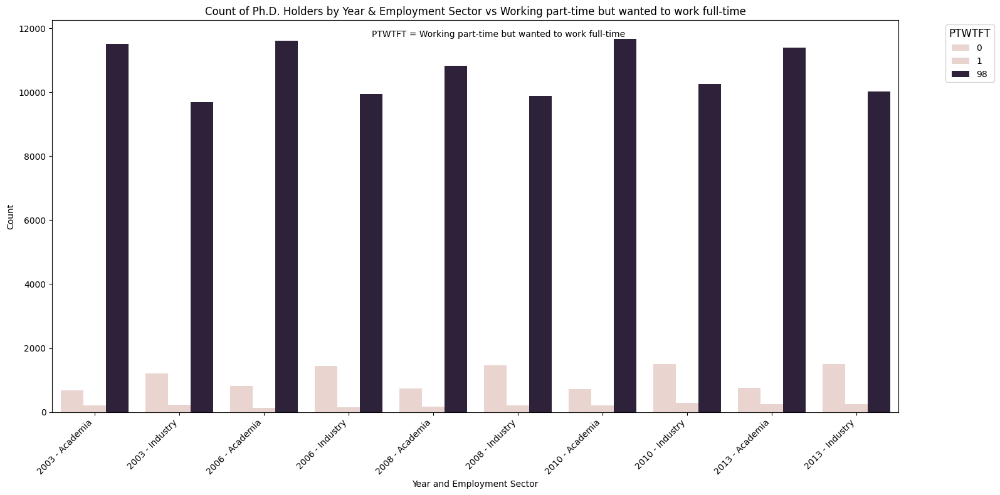

In [49]:
plot_years_and_variable(df2, 'PTWTFT')

We need to inspect this data further.

In [50]:
data_dict['PTWTFT']

{'var_desc_short': 'Working part-time but wanted to work full-time',
 'var_desc': 'PTWTFT indicated whether or not respondents who worked part time actually wanted to be working full time.',
 'data_values': {0: 'No', 1: 'Yes', 98: 'Logical Skip'}}

We see that the majority of respondents skipped this question, but of those who did answer, most were working part-time but want to work full-time. A smaller proportion of respondents who are working part-time want to work part-time. We will inspect this column further later.

In [51]:
columns_to_inspect.append('PTWTFT')

### PTFAM

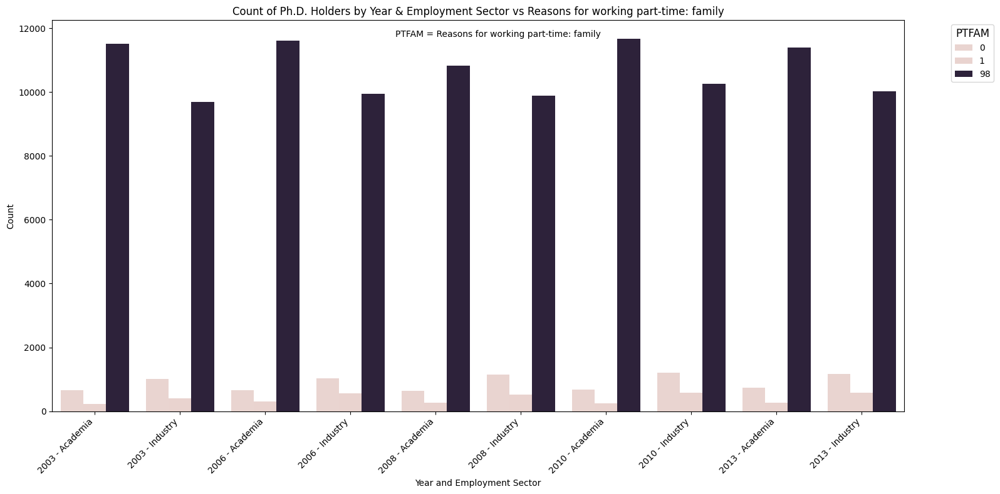

In [52]:
plot_years_and_variable(df2, 'PTFAM')

This column is related to PTWTFT. We will inspect this column too.

In [53]:
columns_to_inspect.append('PTFAM')

### PTNOND

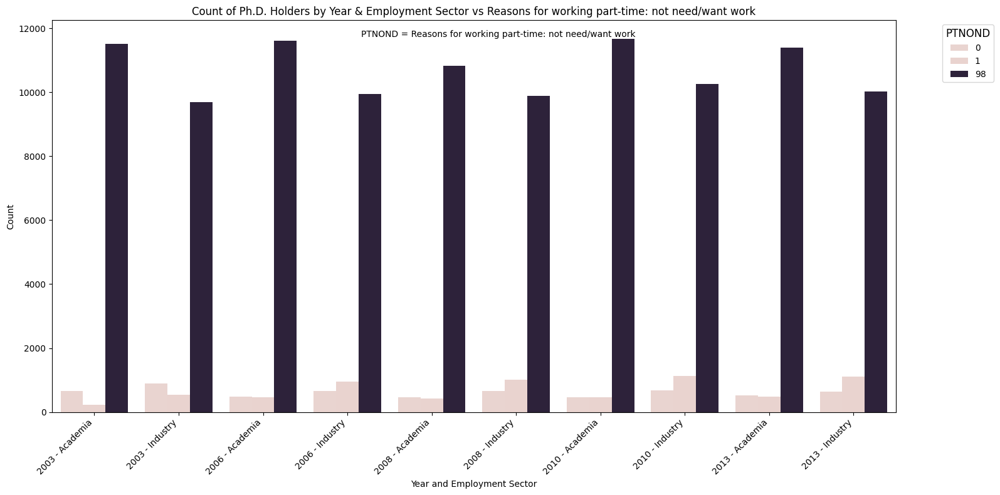

In [54]:
plot_years_and_variable(df2, 'PTNOND')

This column is related to PTWTFT. We will inspect this column too.

In [55]:
columns_to_inspect.append('PTNOND')

### PTOCNA

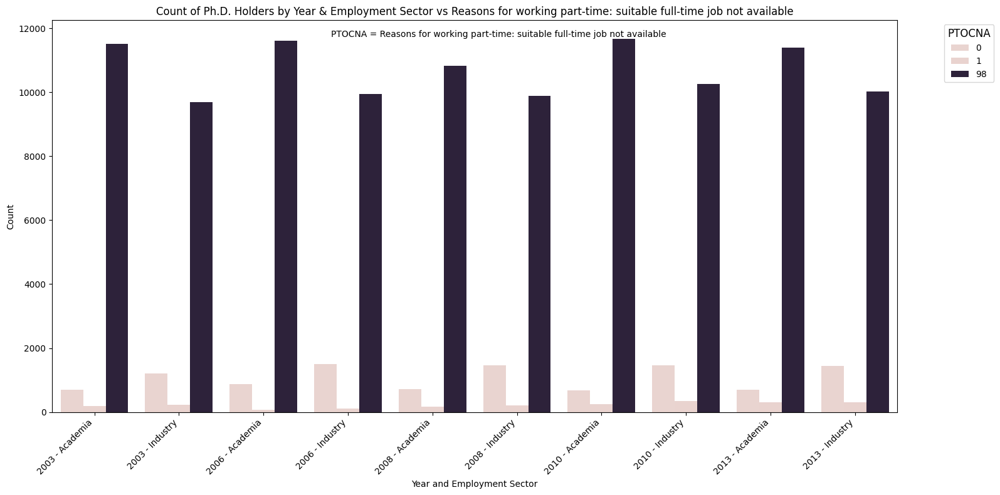

In [56]:
plot_years_and_variable(df2, 'PTOCNA')

This column is related to PTWTFT. We will inspect this column too.

In [57]:
columns_to_inspect.append('PTOCNA')

### PTOTP

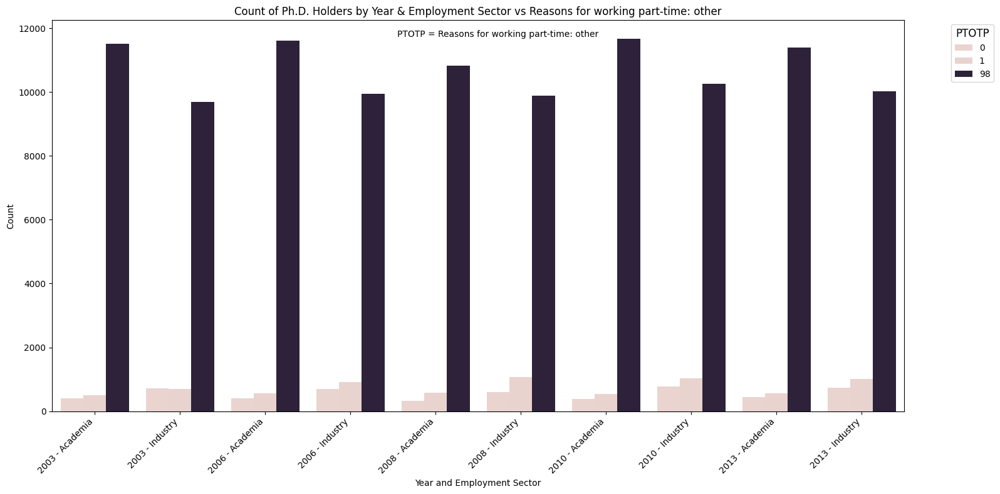

In [58]:
plot_years_and_variable(df2, 'PTOTP')

This column is related to PTWTFT. We will inspect this column too.

In [59]:
columns_to_inspect.append('PTOTP')

### OCEDRLP

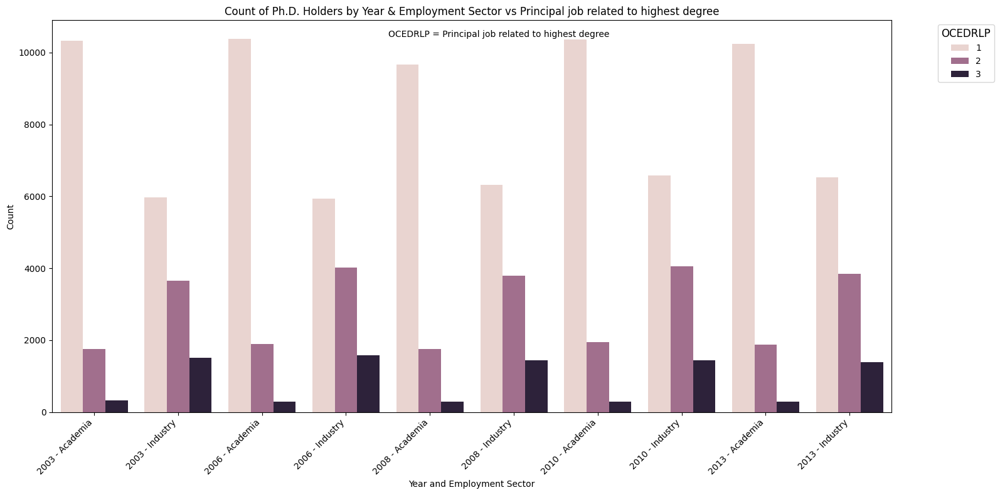

In [60]:
plot_years_and_variable(df2, 'OCEDRLP')

We need to investigate this variable more.

In [61]:
data_dict['OCEDRLP']

{'var_desc_short': 'Principal job related to highest degree',
 'var_desc': "OCEDRLP describes whether or not the respondent's principal job was related to his/her highest post-secondary degree.",
 'data_values': {1: 'Closely related',
  2: 'Somewhat related',
  3: 'Not related',
  98: 'Logical Skip'}}

This variable looks at how closely a respondent's primary job is related to their highest degree. We see that most repondents working in academia are very related to their degree, but in industry, this number is less. In industry, there are a lot more repsondents than academia whose jobs are only somewhat related to their highest degree. We will keep this variable.

In [62]:
columns_to_keep.append('OCEDRLP')

### OCSEDRL

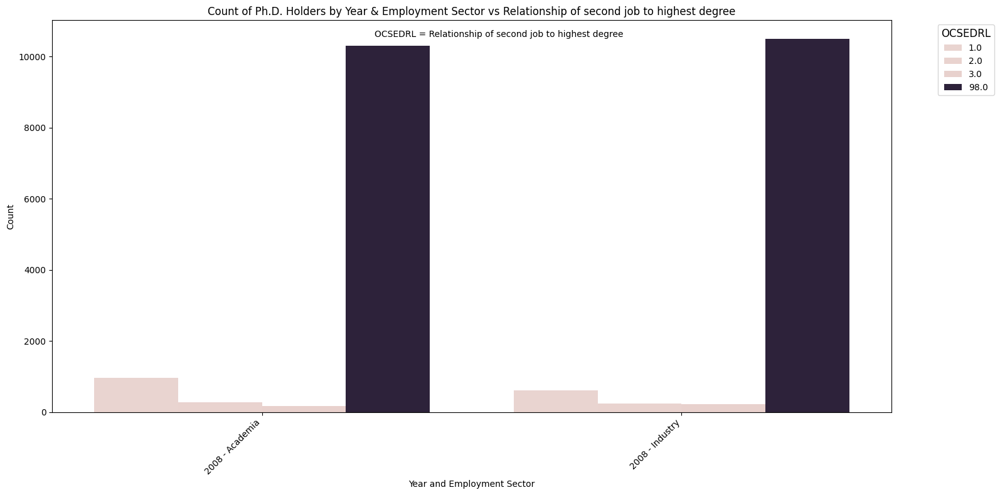

In [63]:
plot_years_and_variable(df2, 'OCSEDRL')

This is a similar question as the previous, and there is a larger proportion of skipped answers. In addition, we are really only interested in a respondent's primary job. So we'll drop this column.

In [64]:
columns_to_drop.append('OCSEDRL')

### EMSIZE

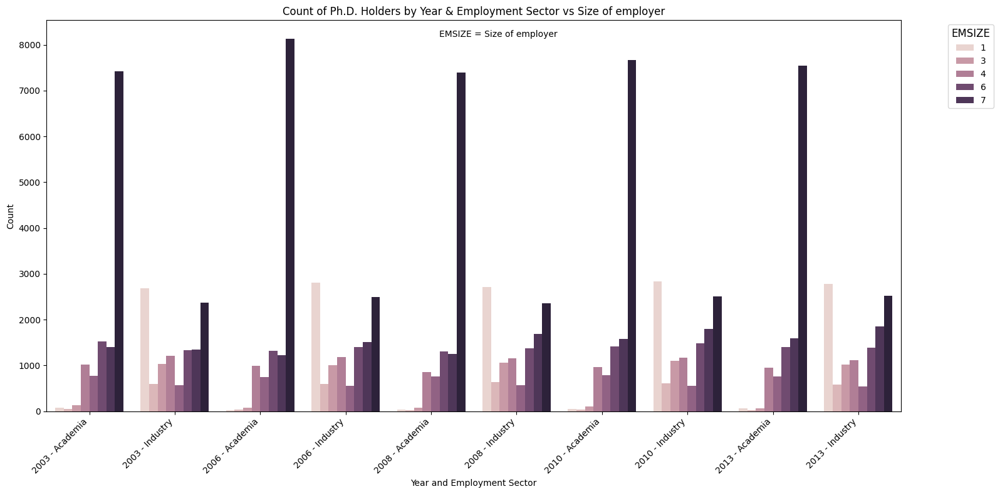

In [65]:
plot_years_and_variable(df2, 'EMSIZE')

We need to inspect the data values further.

In [66]:
data_dict['EMSIZE']

{'var_desc_short': 'Size of employer',
 'var_desc': "EMSIZE describes the size of the respondent's main employer by the number of employees.",
 'data_values': {1: '10 or fewer employees',
  2: '11-24 employees',
  3: '25-99 employees',
  4: '100-499 employees',
  5: '500-999 employees',
  6: '1000-4999 employees',
  7: '5000-24999 employees',
  8: '25000+ employees',
  98: 'Logical Skip'}}

This variable describes the respondent's company's size. Most respondents working in academia skipped the question. We will inspect this variable later.

In [67]:
columns_to_inspect.append('EMSIZE')

### NEWBUS

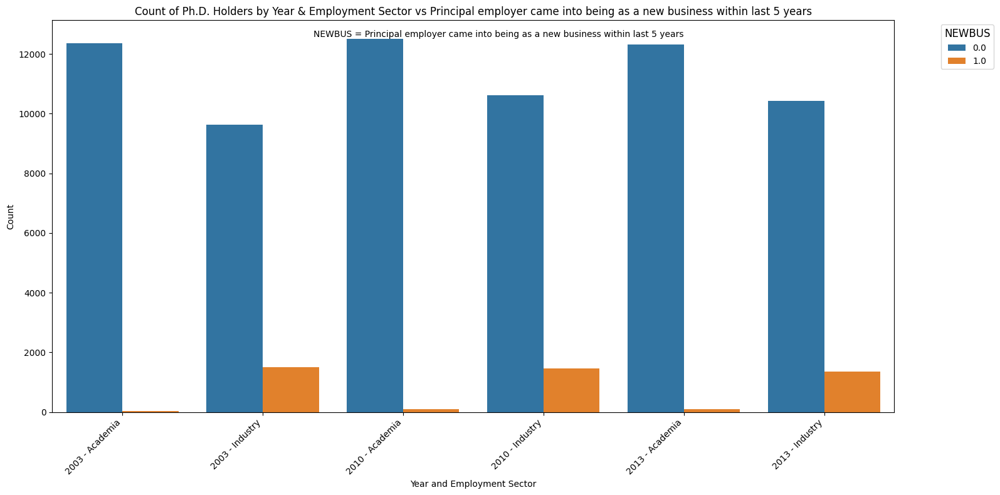

In [68]:
plot_years_and_variable(df2, 'NEWBUS')

This variable has missing data for 2006 and 2008. We will discard it.

In [69]:
columns_to_drop.append('NEWBUS')

### EMUS

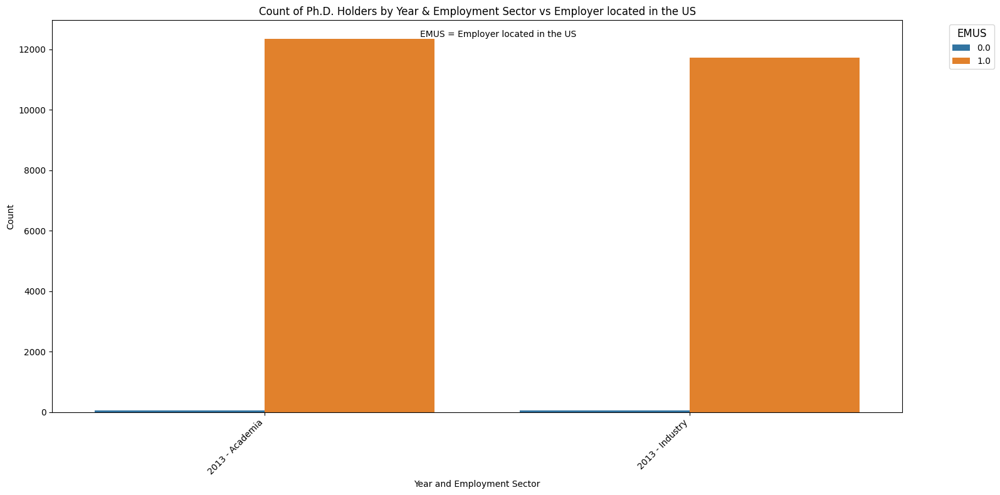

In [70]:
plot_years_and_variable(df2, 'EMUS')

This variable only has data from 2013. We will drop it.

In [71]:
columns_to_drop.append('EMUS')

### GOVSUP

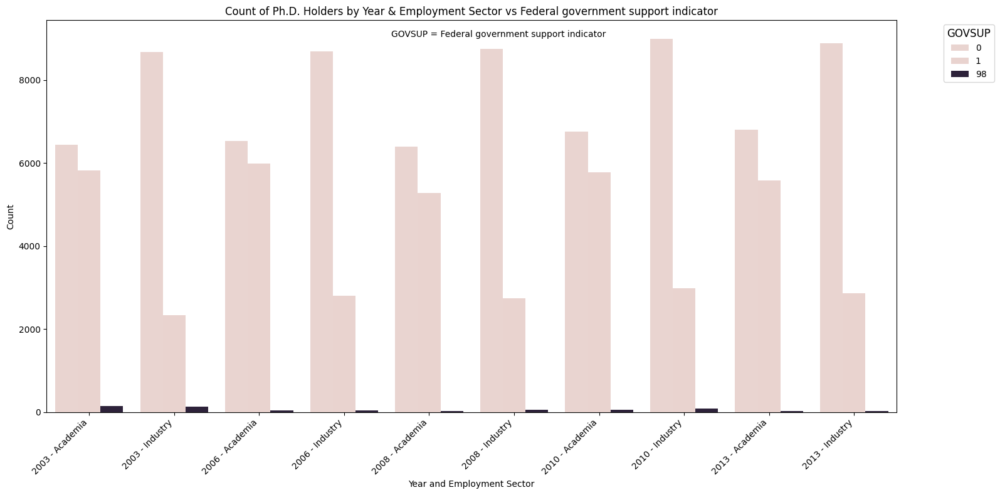

In [72]:
plot_years_and_variable(df2, 'GOVSUP')

We need to inspect this data further.

In [73]:
data_dict['GOVSUP']

{'var_desc_short': 'Federal government support indicator',
 'var_desc': 'GOVSUP indicates whether or not the respondent\'s work was supported by the federal government.  If yes, the respondent was also asked which department or agency supplied the funding.  These answers can be found in a series of variables beginning with "FS" in the "Employment - Other" variable category.',
 'data_values': {0: 'No', 1: 'Yes', 98: 'Logical Skip'}}

This variable indicates whether or not respondents had federal support. In academia, roughly half of the respondents did not have federal support, and half did. In industry, however, the majority of respondents did not have federal support. This is an interesting trend. We will inspect this variable further.

In [74]:
columns_to_inspect.append('GOVSUP')

### FSAGR

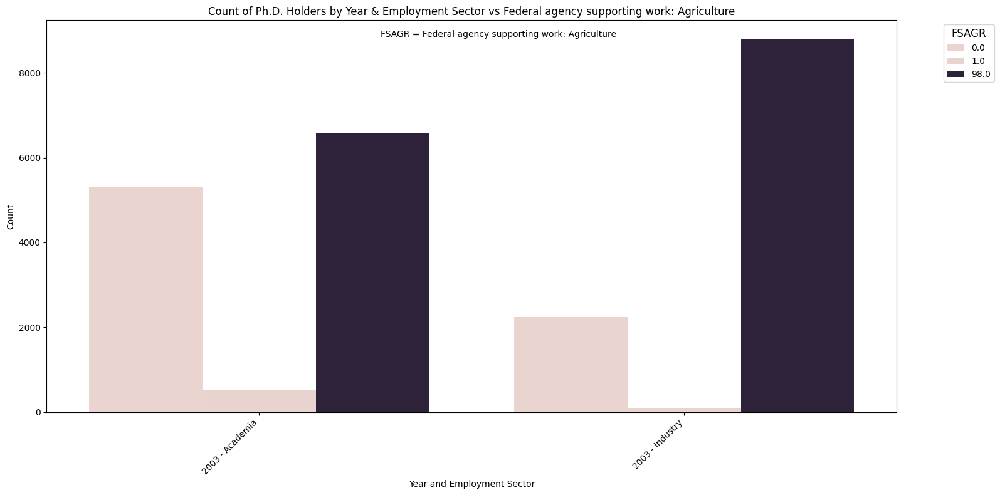

In [75]:
plot_years_and_variable(df2, 'FSAGR')

This variable only has data from 2003. We will discard it.

In [76]:
columns_to_drop.append('FSAGR')

### FSDED

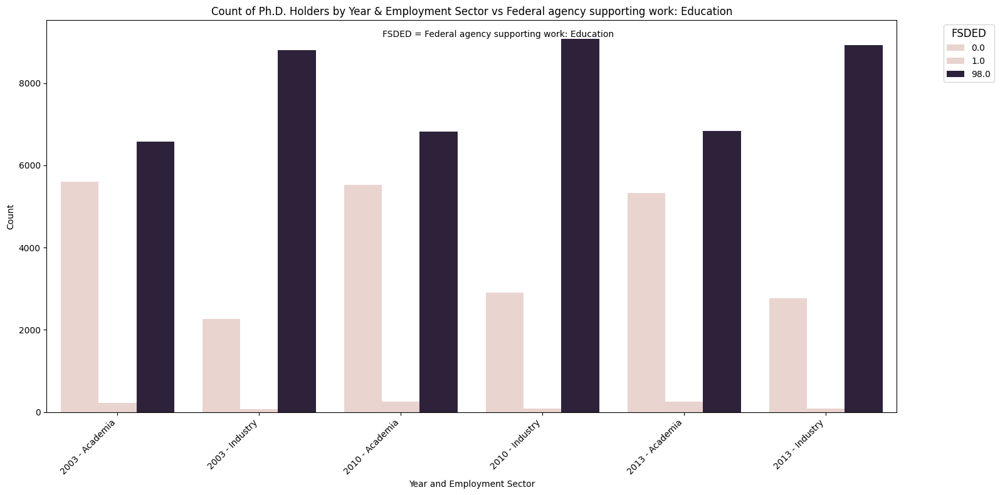

In [77]:
plot_years_and_variable(df2, 'FSDED')

There is a high proportion of skipped answers. We will discard this column.

In [78]:
columns_to_drop.append('FSDED')

### FSDK

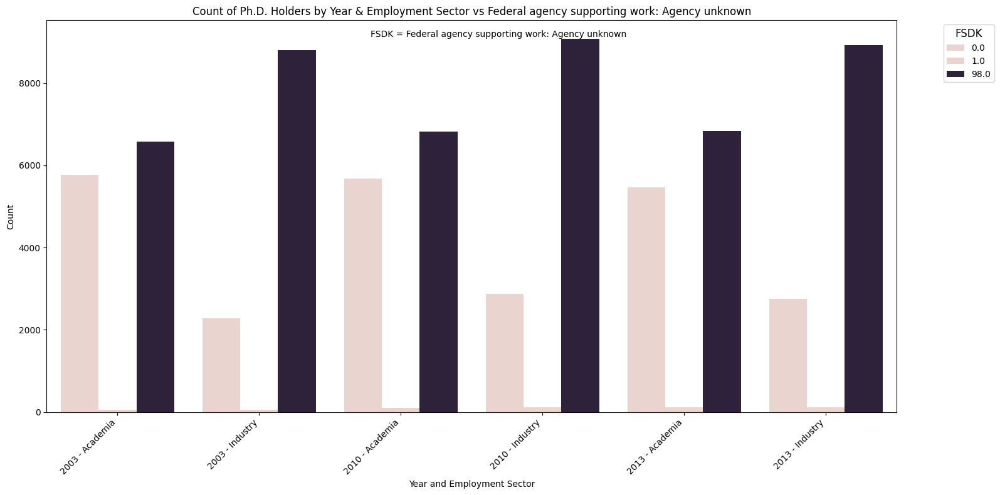

In [79]:
plot_years_and_variable(df2, 'FSDK')

There is a high proportion of skipped answers. We will discard this column.

In [80]:
columns_to_drop.append('FSDK')

### FSDOD

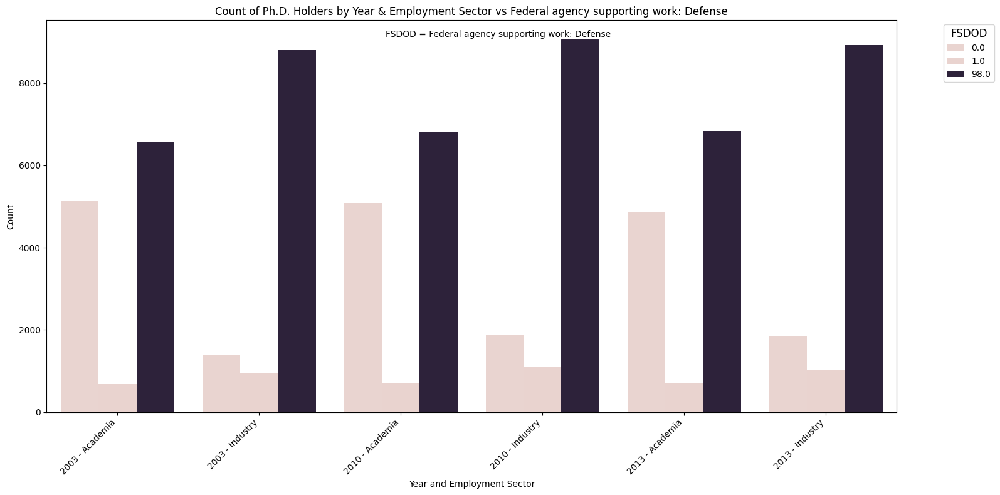

In [81]:
plot_years_and_variable(df2, 'FSDOD')

There is a high proportion of skipped answers. We will discard this column.

In [82]:
columns_to_drop.append('FSDOD')

### FSDOE

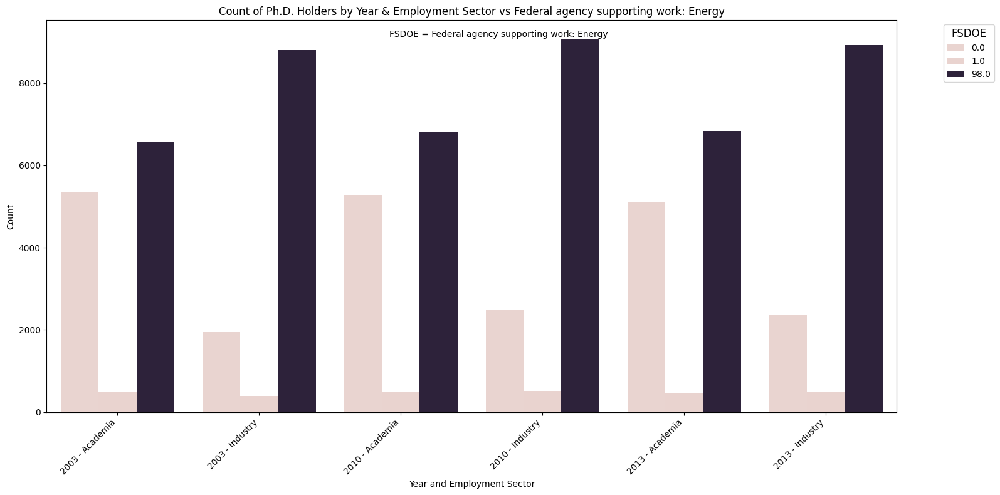

In [83]:
plot_years_and_variable(df2, 'FSDOE')

There is a high proportion of skipped answers. We will discard this column.

In [84]:
columns_to_drop.append('FSDOE')

### FSDOT

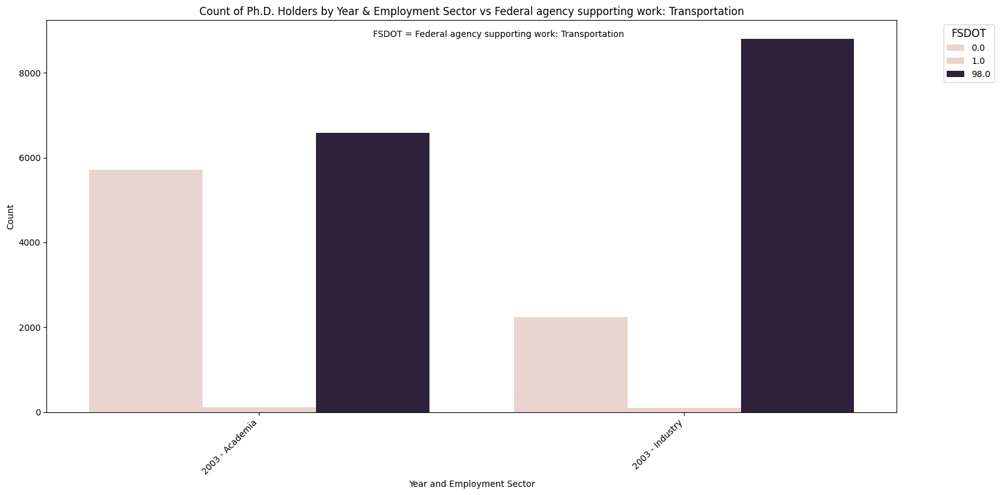

In [85]:
plot_years_and_variable(df2, 'FSDOT')

There is a high proportion of skipped answers. We will discard this column.

In [86]:
columns_to_drop.append('FSDOT')

### FSEPA

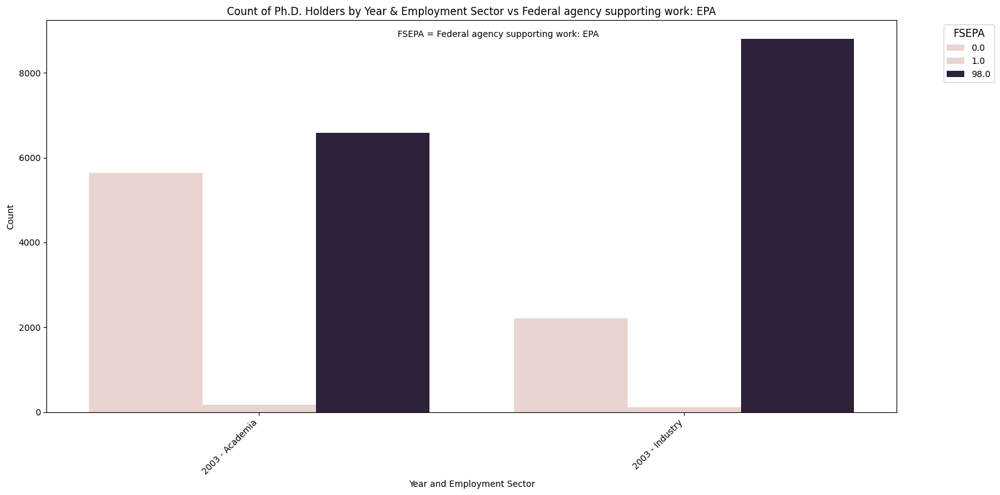

In [87]:
plot_years_and_variable(df2, 'FSEPA')

There is a high proportion of skipped answers. We will discard this column.

In [88]:
columns_to_drop.append('FSEPA')

### FSHHS

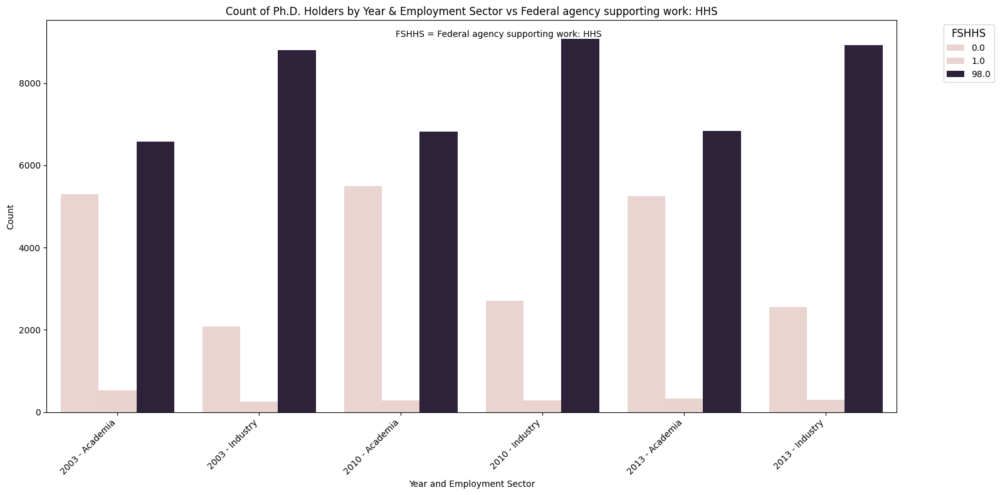

In [89]:
plot_years_and_variable(df2, 'FSHHS')

There is a high proportion of skipped answers. We will discard this column.

In [90]:
columns_to_drop.append('FSHHS')

### FSNASA

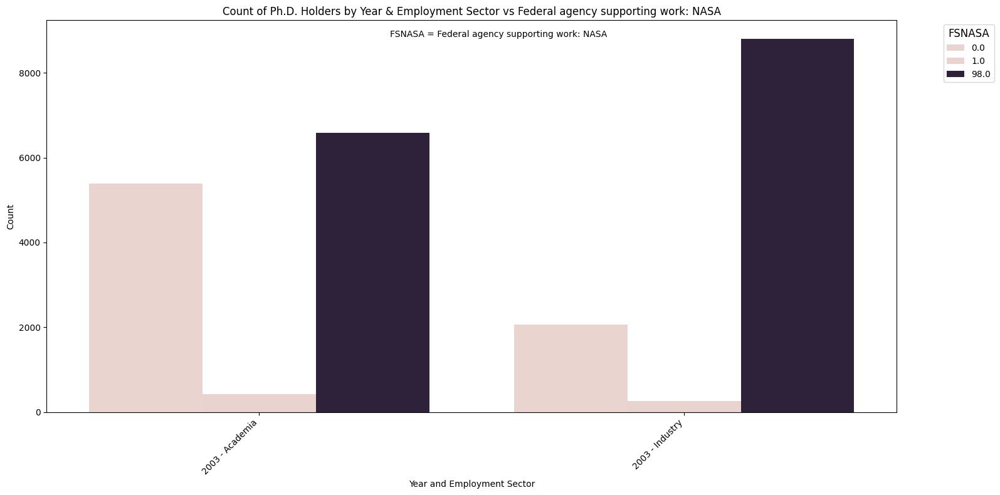

In [91]:
plot_years_and_variable(df2, 'FSNASA')

There is a high proportion of skipped answers. We will discard this column.

In [92]:
columns_to_drop.append('FSNASA')

### FSNIH

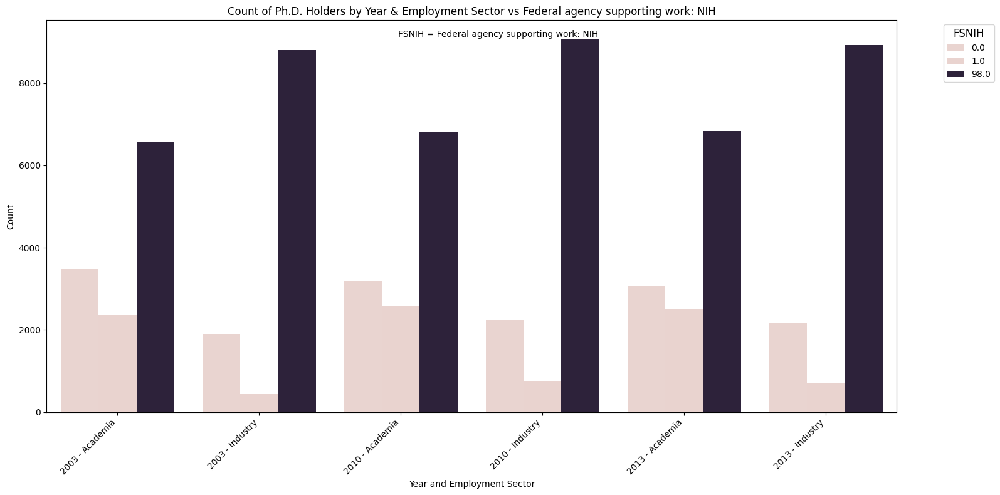

In [93]:
plot_years_and_variable(df2, 'FSNIH')

There is a high proportion of skipped answers. We will discard this column.

In [94]:
columns_to_drop.append('FSNIH')

### FSNSF

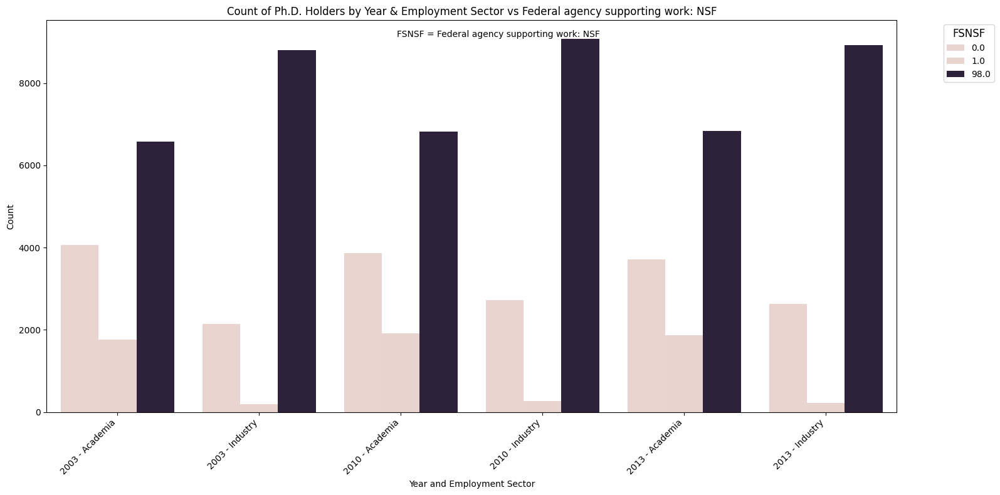

In [95]:
plot_years_and_variable(df2, 'FSNSF')

There is a high proportion of skipped answers. We will discard this column.

In [96]:
columns_to_drop.append('FSNSF')

### FSOT

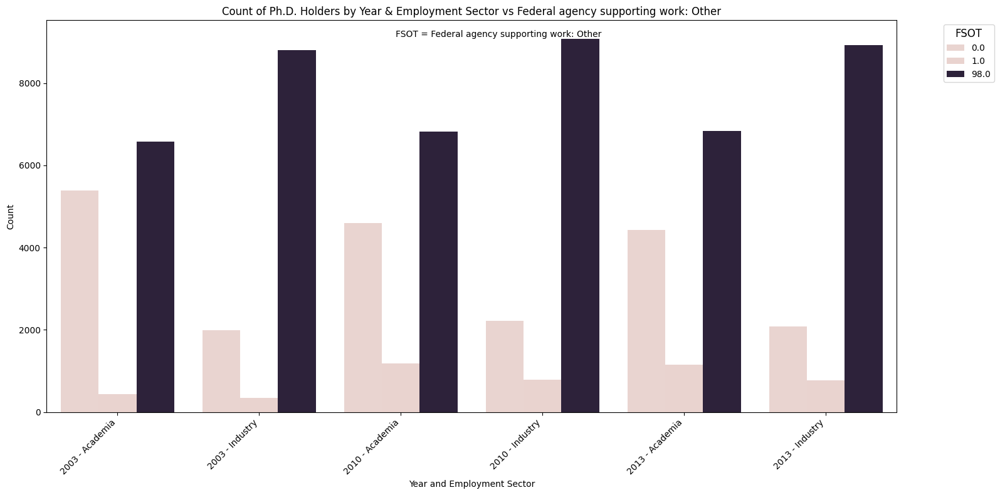

In [97]:
plot_years_and_variable(df2, 'FSOT')

There is a high proportion of skipped answers. We will discard this column.

In [98]:
columns_to_drop.append('FSOT')

### ACTCAP

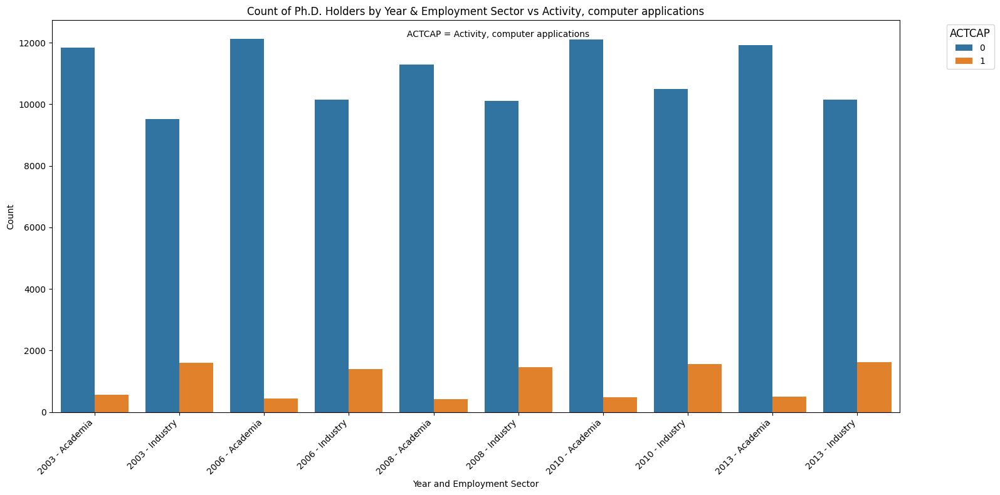

In [99]:
plot_years_and_variable(df2, 'ACTCAP')

We need to inspect the data values further.

In [100]:
data_dict['ACTCAP']

{'var_desc_short': 'Activity, computer applications',
 'var_desc': "ACTCAP indicates whether the work activities in the respondent's primary job involves computer applications.  ACTCAP is derived from a question that lists a number of work activities, and the respondent is asked to check a box next to the work activity that occupied at least 10 percent of the respondent's time in a typical work week.  Related variables include ACTDED, ACTMGT, ACTRD, ACTRDT, ACTRES, and ACTTCH.\n\nACTCAP is an NSF recode using information from variables including WACOM.",
 'data_values': {0: 'No', 1: 'Yes', 98: 'Logical Skip'}}

The majority of respondents answered No, but the proportion of repsondents repsonding Yes is higher in industry. We will inspect this column further, in relation to other columns belonging to this category.

In [101]:
columns_to_inspect.append('ACTCAP')

### ACTDED

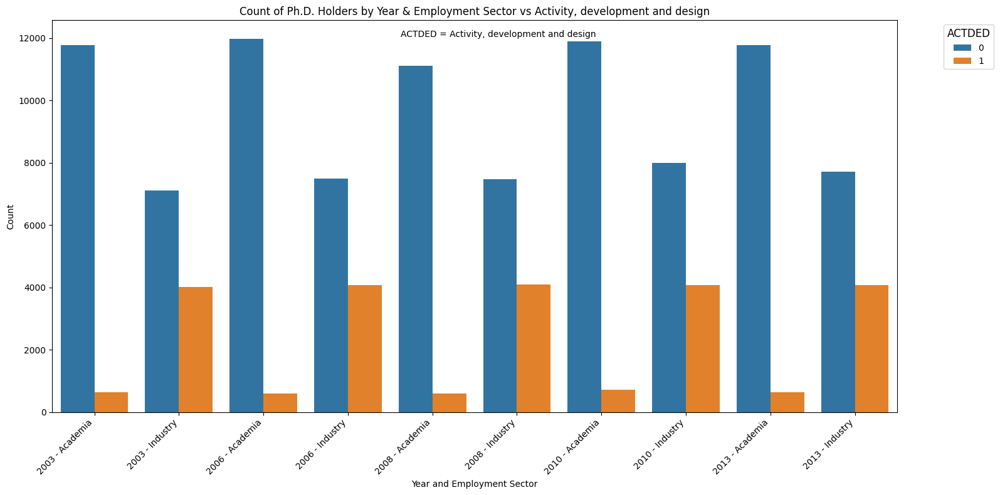

In [102]:
plot_years_and_variable(df2, 'ACTDED')

The majority of respondents answered No, but the proportion of repsondents repsonding Yes is higher in industry. We will inspect this column further, in relation to other columns belonging to this category.

In [103]:
columns_to_inspect.append('ACTDED')

### ACTMGT

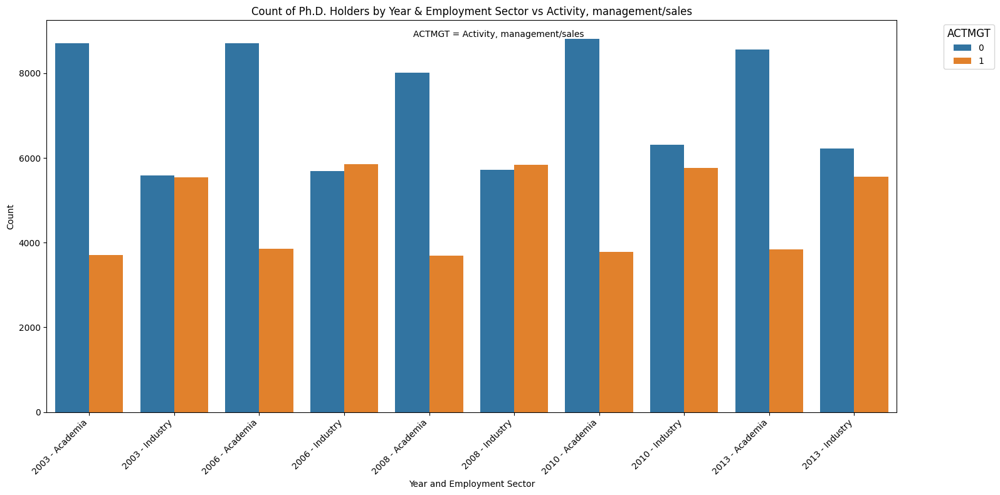

In [104]:
plot_years_and_variable(df2, 'ACTMGT')

The majority of respondents answered No in the acadmic sector, but the proportion of repsondents repsonding both Yes and No is more equal in industry. We will inspect this column further, in relation to other columns belonging to this category.

In [105]:
columns_to_inspect.append('ACTMGT')

### ACTRD

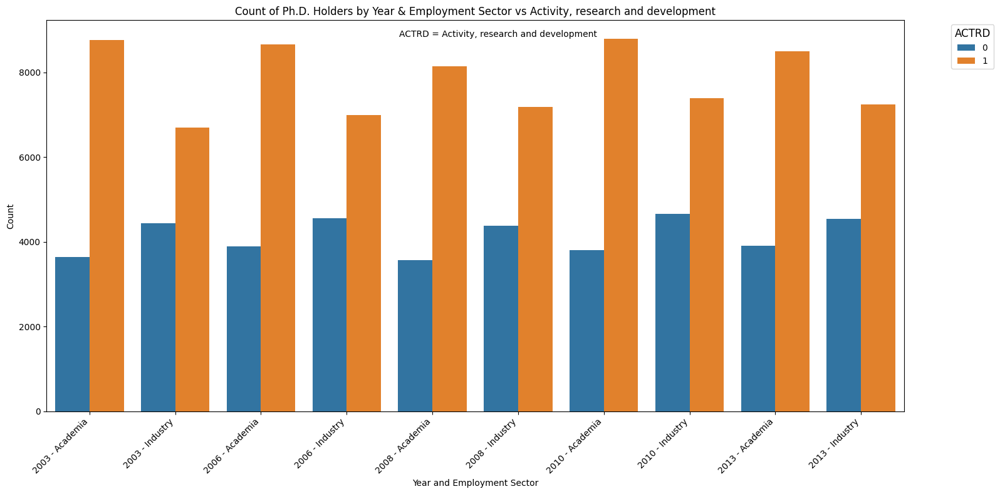

In [106]:
plot_years_and_variable(df2, 'ACTRD')

The majority of respondents answered Yes across both industry and academia. We will inspect this column further, in relation to other columns belonging to this category.

In [107]:
columns_to_inspect.append('ACTRD')

### ACTRDT

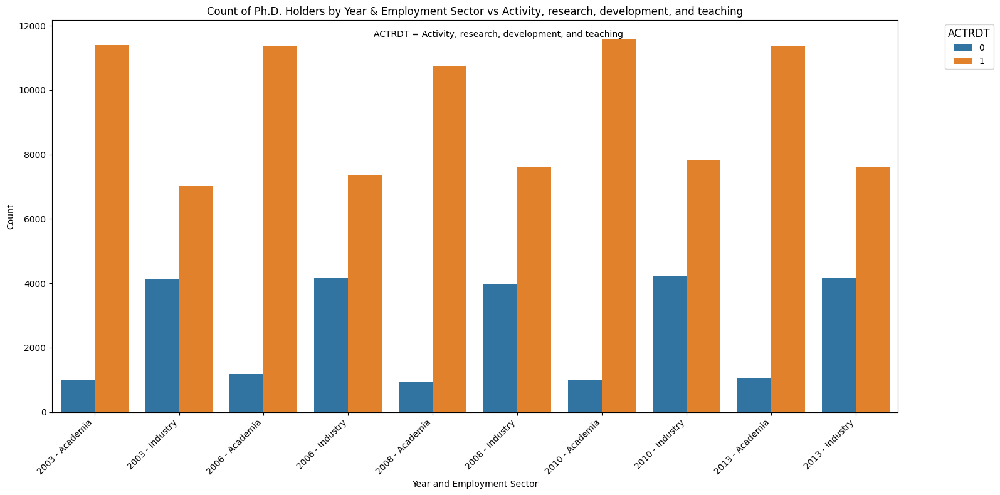

In [108]:
plot_years_and_variable(df2, 'ACTRDT')

The majority of respondents answered Yes across both industry and academia, but the number of respondents answering Yes is higher in academia and the number of respondents answering No is higher in industry. We will inspect this column further, in relation to other columns belonging to this category.

In [109]:
columns_to_inspect.append('ACTRDT')

### ACTRES

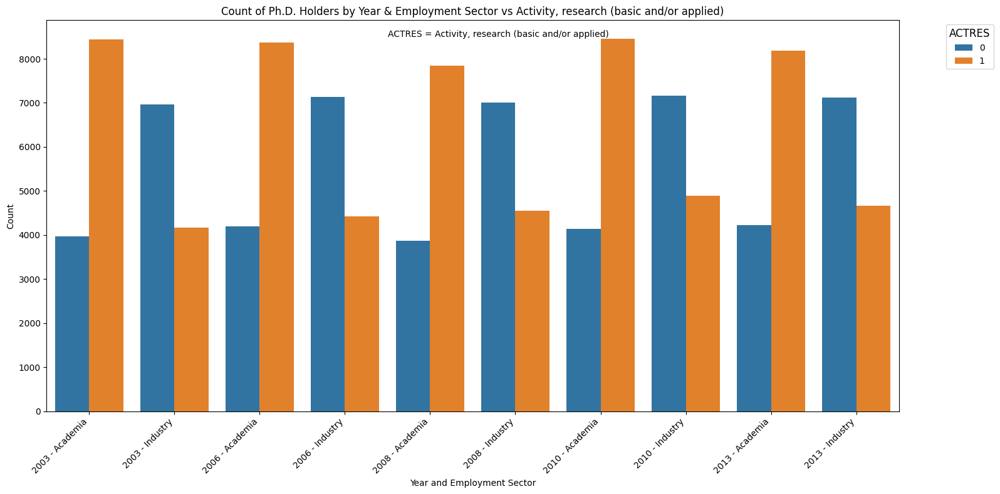

In [110]:
plot_years_and_variable(df2, 'ACTRES')

In academia, most respondents answered Yes, but this trend is reversed in industry, where most respondents answered No. We will inspect this column further, in relation to other columns belonging to this category.

In [111]:
columns_to_inspect.append('ACTRES')

### ACTTCH

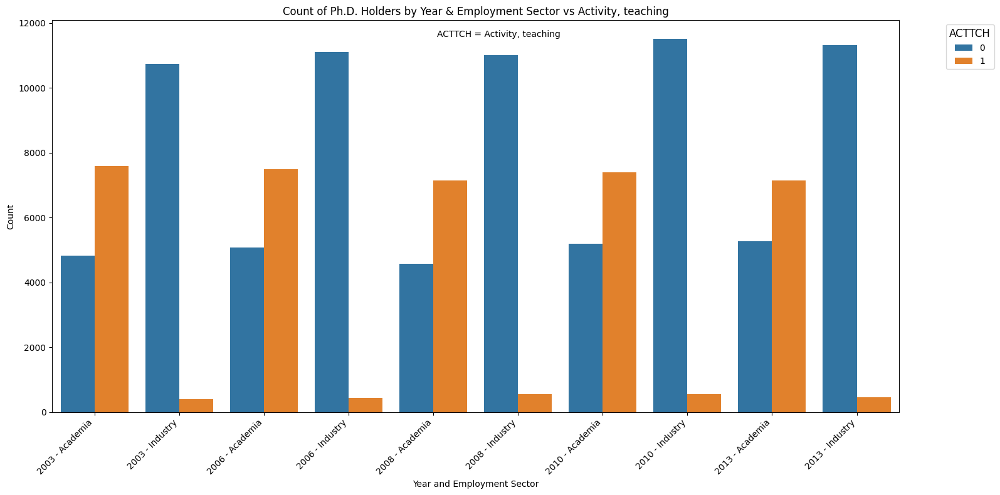

In [112]:
plot_years_and_variable(df2, 'ACTTCH')

In academia, most respondents answered Yes, but this trend is reversed in industry, where most respondents answered No. We will inspect this column further, in relation to other columns belonging to this category.

In [113]:
columns_to_inspect.append('ACTTCH')

### WADEV

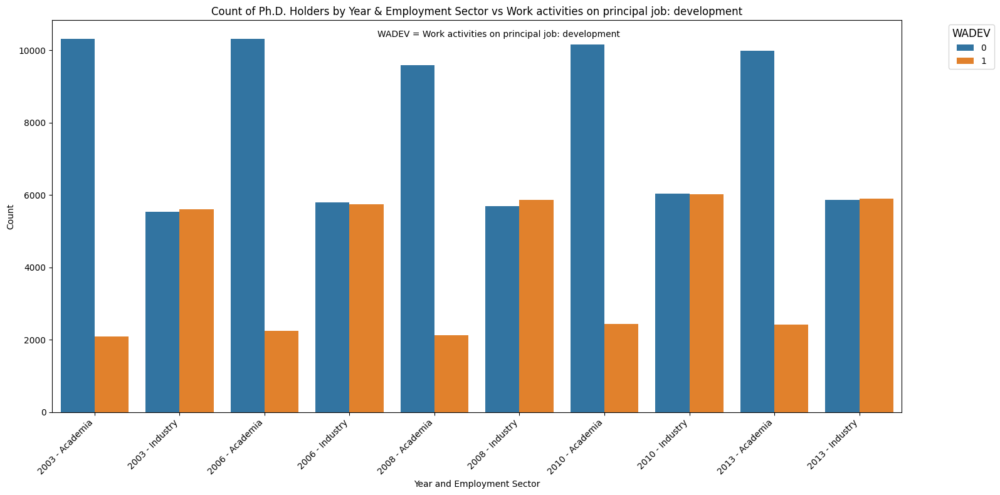

In [114]:
plot_years_and_variable(df2, 'WADEV')

We will inspect the data values further.

In [115]:
data_dict['WADEV']

{'var_desc_short': 'Work activities on principal job: development',
 'var_desc': 'WADEV indicates whether or not the respondent spent at least ten percent of time in his/her principal job in development during a typical work week.  In the survey, development is defined as using knowledge gained from research for the production of materials or devices.  Other variables regarding work activities include WAACC, WAAPRSH, WABRSH, WACOM, WADSN, WAEMRL, WAMGMT, WAOT, WAPROD, WAQM, WASALE, WASVC, and WATEA.',
 'data_values': {0: 'No', 1: 'Yes', 98: 'Logical Skip'}}

In academia, most repsondents answerred No, and in industry, roughly equal proportions of respondents answered both Yes and No. We will inspect this column further, in relation to other columns belonging to this category.

In [116]:
columns_to_inspect.append('WADEV')

### WADSN

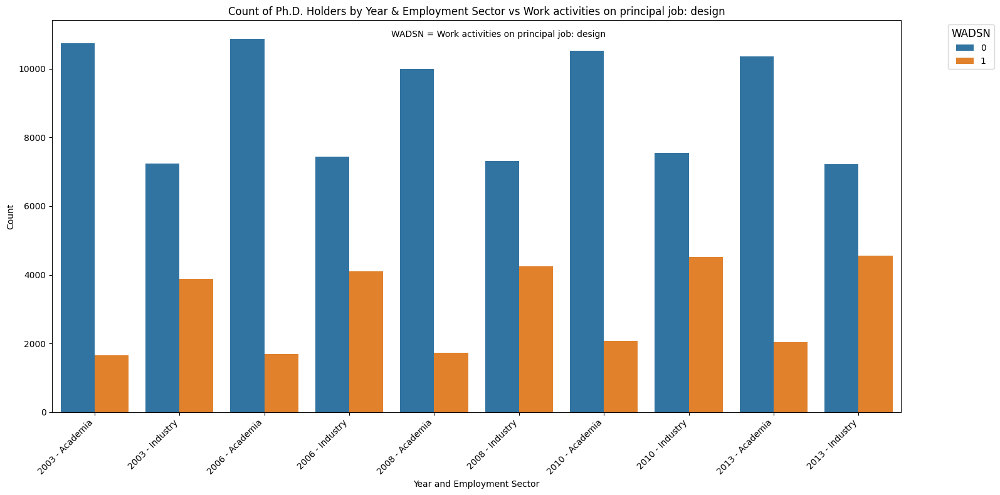

In [117]:
plot_years_and_variable(df2, 'WADSN')

In academia and industry, most repsondents answerred No, but in industry, there is a higher proportion of respondents replying Yes. We will inspect this column further, in relation to other columns belonging to this category.

In [118]:
columns_to_inspect.append('WADSN')

### WAEMRL

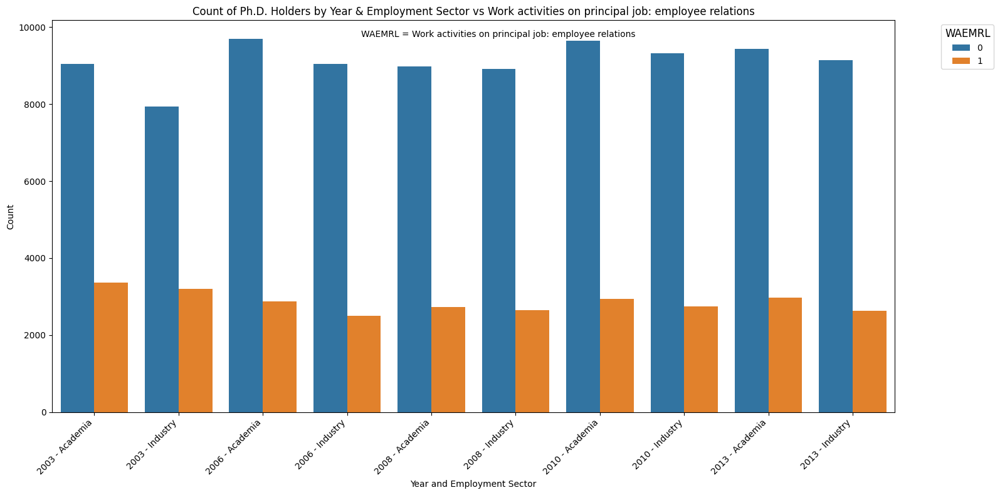

In [119]:
plot_years_and_variable(df2, 'WAEMRL')

In academia and industry, most repsondents answerred No. We will inspect this column further, in relation to other columns belonging to this category.

In [120]:
columns_to_inspect.append('WAEMRL')

### WAMGMT

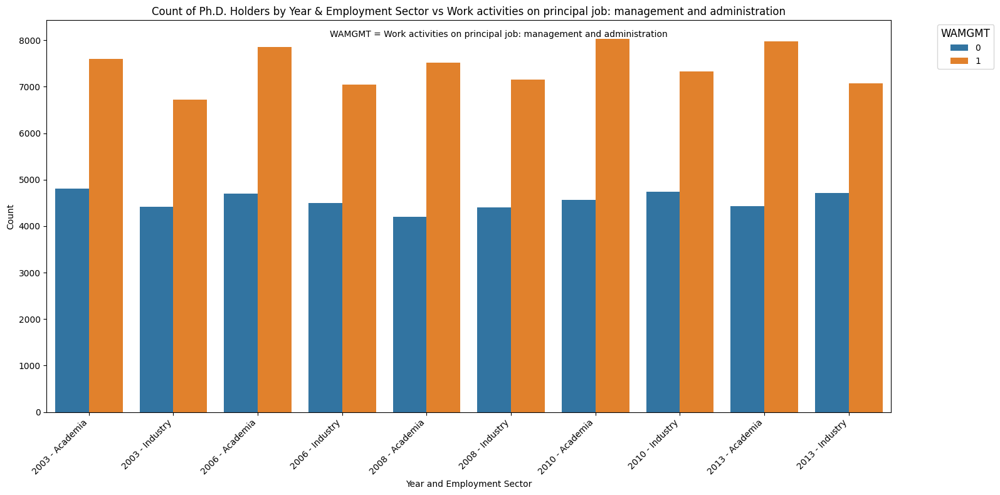

In [121]:
plot_years_and_variable(df2, 'WAMGMT')

In academia and industry, most repsondents answerred Yes. We will inspect this column further, in relation to other columns belonging to this category.

In [122]:
columns_to_inspect.append('WAMGMT')

### WAOT

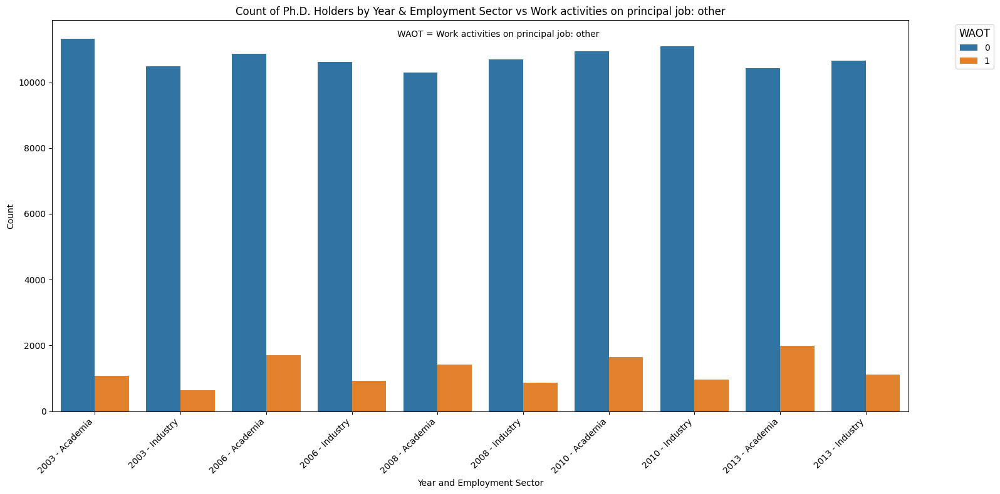

In [123]:
plot_years_and_variable(df2, 'WAOT')

In academia and industry, most repsondents answerred No, but the proportion of respondents replying Yes is higher in academia. We will inspect this column further, in relation to other columns belonging to this category.

In [124]:
columns_to_inspect.append('WAOT')

### WAPROD

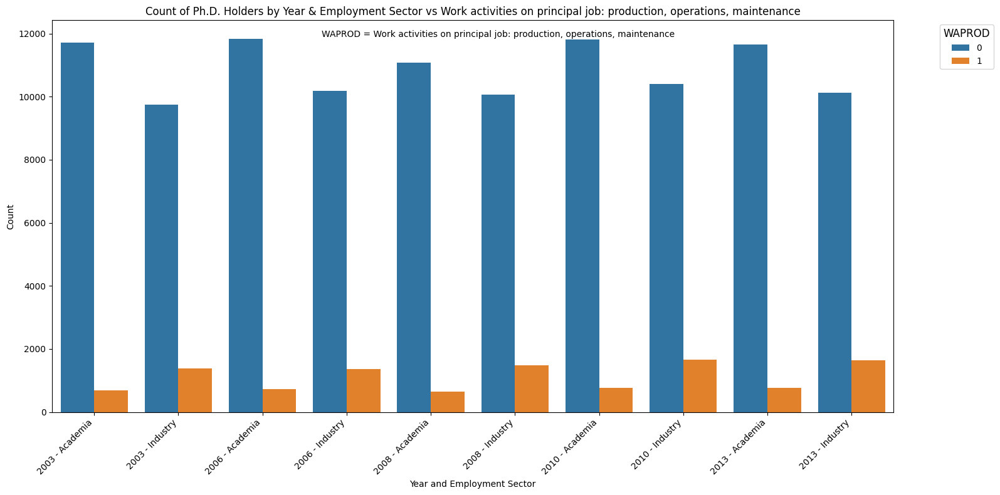

In [125]:
plot_years_and_variable(df2, 'WAPROD')

In academia and industry, most repsondents answerred No, but the proportion of respondents replying Yes is higher in industry. We will inspect this column further, in relation to other columns belonging to this category.

In [126]:
columns_to_inspect.append('WAPROD')

### SUPWK

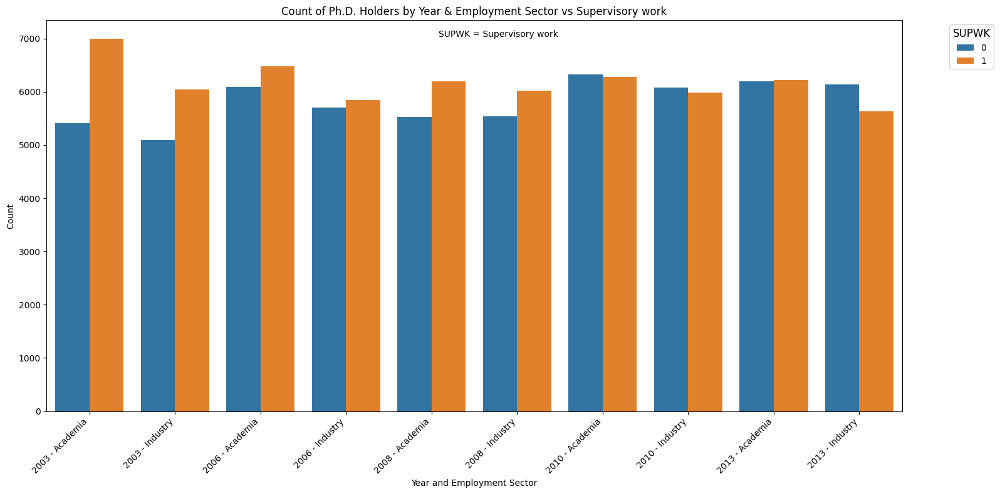

In [127]:
plot_years_and_variable(df2, 'SUPWK')

In [128]:
data_dict['SUPWK']

{'var_desc_short': 'Supervisory work',
 'var_desc': 'SUPWK indicates whether or not the respondent supervised other employees as a part of his/her principal job.',
 'data_values': {0: 'No', 1: 'Yes', 98: 'Logical Skip'}}

Roughly we have equal proportions of yes/no responses across years across both industry and academia. We will inspect this column further.

In [129]:
columns_to_inspect.append('SUPWK')

### PAPERS

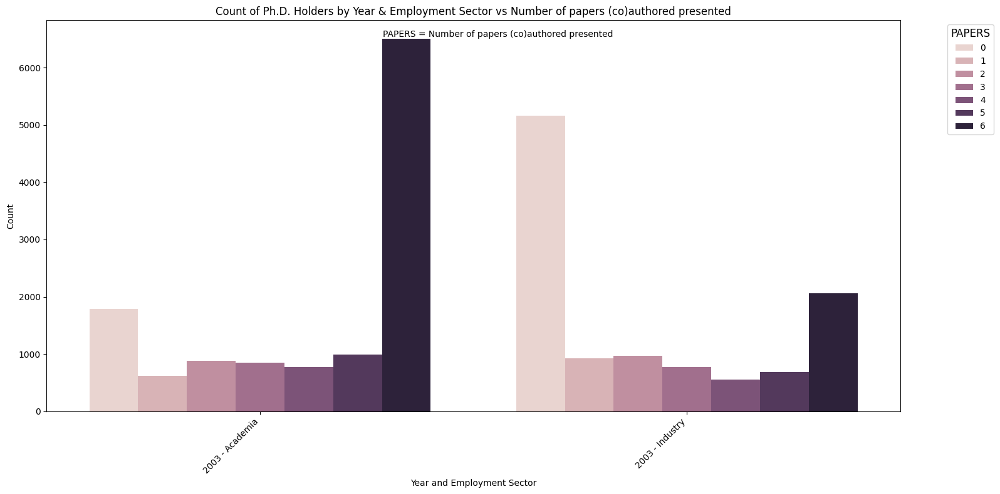

In [130]:
plot_years_and_variable(df2, 'PAPERS')

In [131]:
data_dict['PAPERS']

{'var_desc_short': 'Number of papers (co)authored presented',
 'var_desc': 'PAPERS reports the number of papers the respondent had authored or co-authored that had been presented at conferences since October 1998.',
 'data_values': {}}

Most respondents authored or co-authored and presented 6 papers since 1998 in academia, and most reposndets in industry did not publish any papers in industry. However, since this column only has data from 2003, we will discard it. 

In [132]:
columns_to_drop.append('PAPERS')

### ARTICLE

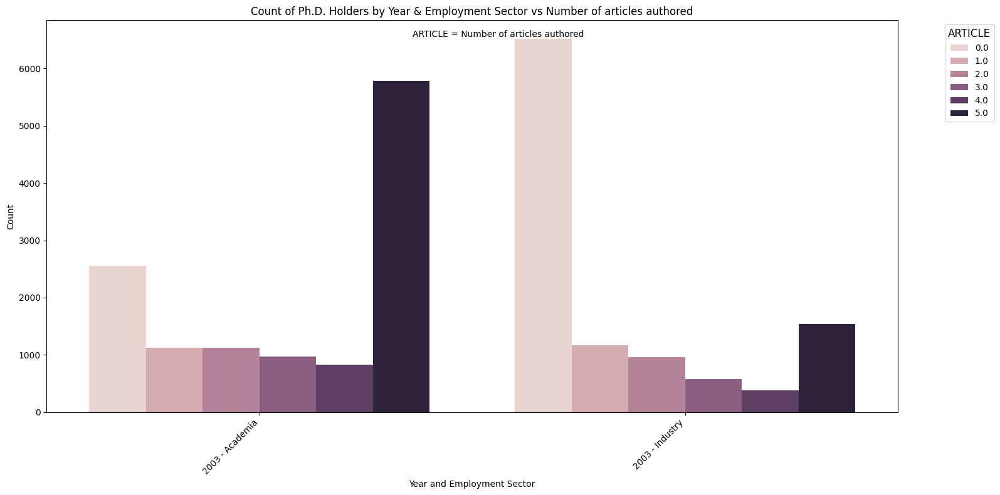

In [133]:
plot_years_and_variable(df2, 'ARTICLE')

In [134]:
data_dict['ARTICLE']

{'var_desc_short': 'Number of articles authored',
 'var_desc': 'ARTICLE gives the number of articles the respondent has authored or coauthored that have been accepted for publication as of the reference week.  A similar variable is ARTC95.',
 'data_values': {0: '0',
  1: '1',
  2: '2',
  3: '3',
  4: '4',
  5: '5 or more',
  98: 'Logical Skip'}}

Most respondents authored or co-authored at least 5 papers in academia, and most respondents in industry did not publish any papers. However, since this column only has data from 2003, we will discard it. 

In [135]:
columns_to_drop.append('ARTICLE')

### PRMBR

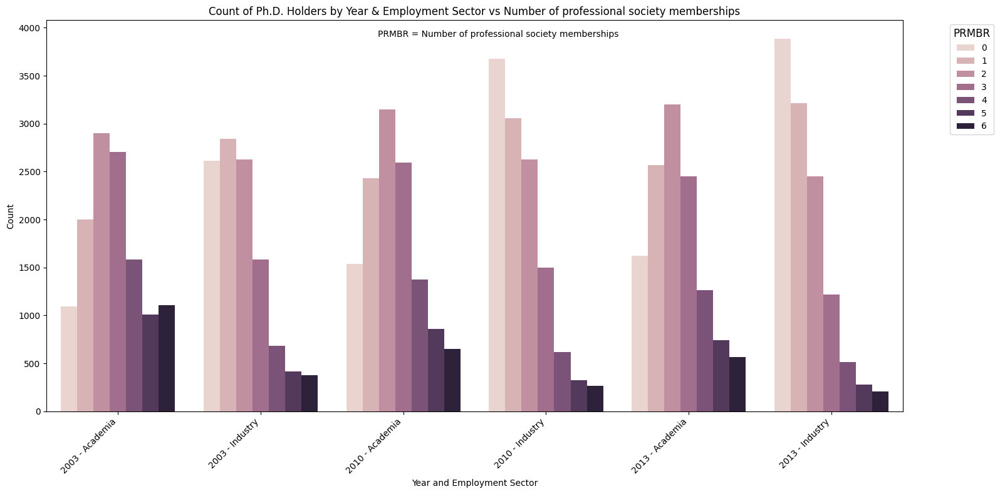

In [136]:
plot_years_and_variable(df2, 'PRMBR')

In [137]:
data_dict['PRMBR']

{'var_desc_short': 'Number of professional society memberships',
 'var_desc': 'PRMBR reports the number of professional memberships to which the respondent belonged.',
 'data_values': {0: 'No memberships',
  1: '1 membership',
  2: '2 memberships',
  3: '3 memberships',
  4: '4 memberships',
  5: '5 memberships',
  6: '6 memberships (6 or more in 2013, 2010 and 2003)',
  7: '7 memberships',
  8: '8 memberships',
  9: '9 memberships',
  10: '10 memberships (10 or more in 2001, 19991 1997, 1995 and 1993 )',
  11: '11 memberships',
  12: '12 memberships',
  13: '13 memberships',
  14: '14 memberships',
  15: '15 memberships',
  16: '16 memberships',
  17: '17 memberships',
  18: '18 memberships',
  19: '19 memberships',
  20: '20 memberships',
  96: 'Blank',
  98: 'Logical Skip',
  99: 'Missing'}}

Across industry and academia, there seems to be a left-skewed distribution of number of memberships. However, since this column is missing data from 2006 and 2008, we will discard it. 

In [138]:
columns_to_drop.append('PRMBR')

### PROMTGI

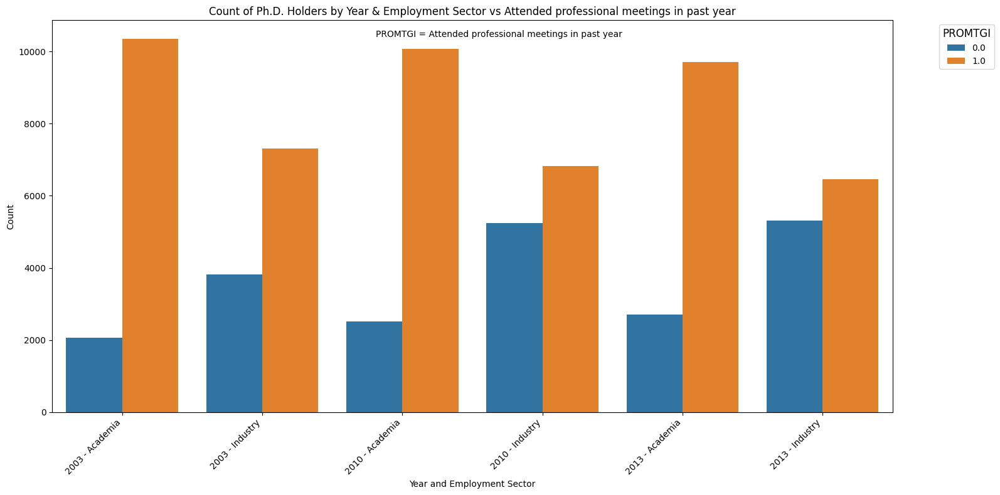

In [139]:
plot_years_and_variable(df2, 'PROMTGI')

In [140]:
data_dict['PROMTGI']

{'var_desc_short': 'Attended professional meetings in past year',
 'var_desc': 'PROMTGI indicates whether or not the respondent attended a professional meeting within the last year.',
 'data_values': {0: 'No', 1: 'Yes', 98: 'Logical Skip', 99: 'Missing'}}

Most repondents across both industry and academia responded Yes, but the proportion of respondents replying No is higher for industry. However, since this column is missing data from 2006 and 2008, we will discard it. 

In [141]:
columns_to_drop.append('PROMTGI')

### BOOKSP

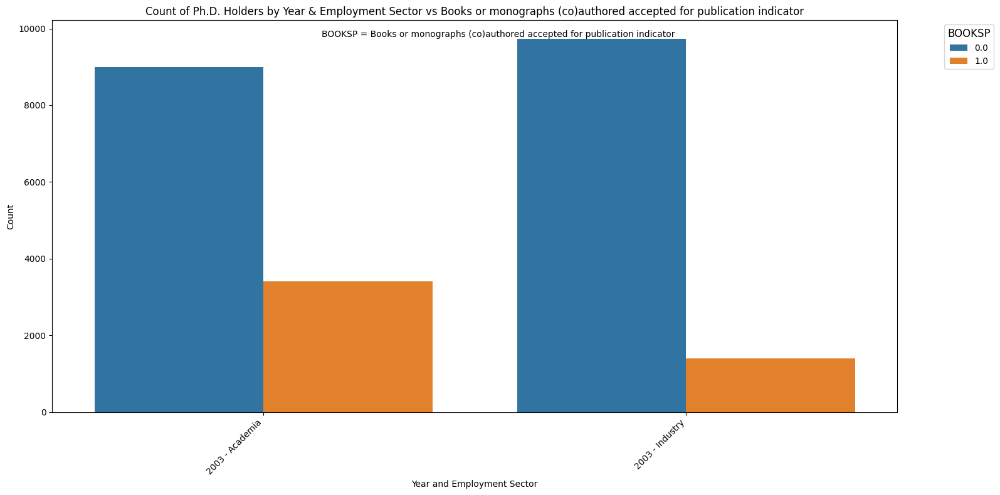

In [142]:
plot_years_and_variable(df2, 'BOOKSP')

Most repondents across both industry and academia responded No, but the proportion of respondents replying Yes is higher for academia. However, since this column ionly has data for 2003, we will discard it. 

In [143]:
columns_to_drop.append('BOOKSP')

### SALARY

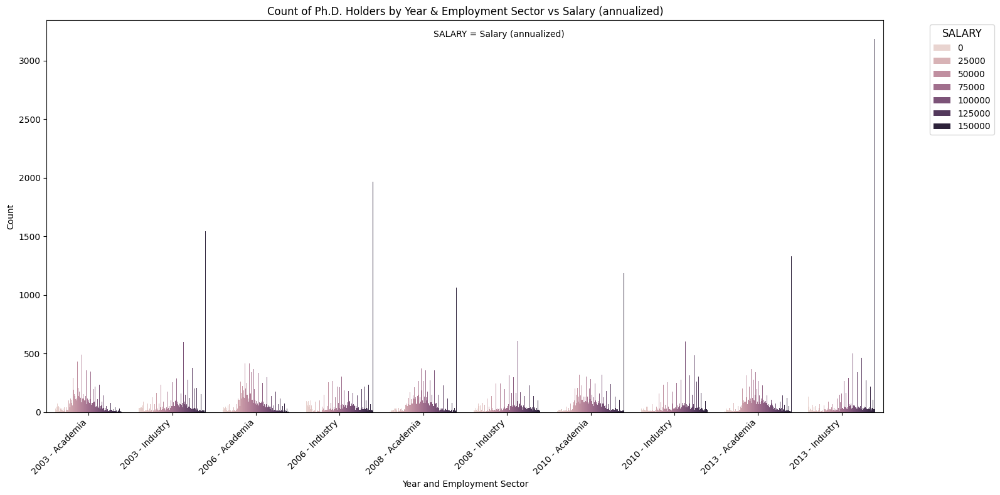

In [144]:
plot_years_and_variable(df2, 'SALARY')

We see the distribution of salaries appears slightly left-skewed for 2003 and 2006, but then starts appearing more like a normal distribution from 2008 onwards. The salary distribution for industry seems more right-skewed than academia. We will keep this column.

In [145]:
columns_to_keep.append('SALARY')

### NRREA

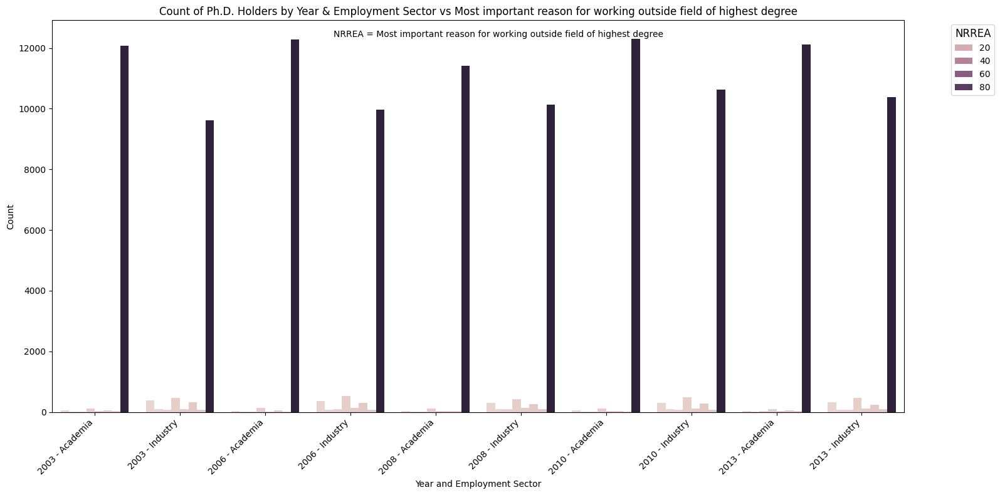

In [146]:
plot_years_and_variable(df2, 'NRREA')

In [147]:
data_dict['NRREA']

{'var_desc_short': 'Most important reason for working outside field of highest degree',
 'var_desc': 'NRREA reports the most important reason that the respondent was working in a field unrelated to the field of his/her highest degree. The variable NRSEC reports the second most important reason that the respondent was working in a field unrelated to the field of his/her highest degree.',
 'data_values': {1: 'Pay, promotion opportunities',
  2: 'Working conditions',
  3: 'Job location',
  4: 'Change in career or professional interests',
  5: 'Family-related reasons',
  6: 'Job in highest degree field not available',
  7: 'Other reason for not working',
  98: 'Logical Skip'}}

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [148]:
columns_to_drop.append('NRREA')

### NRSEC

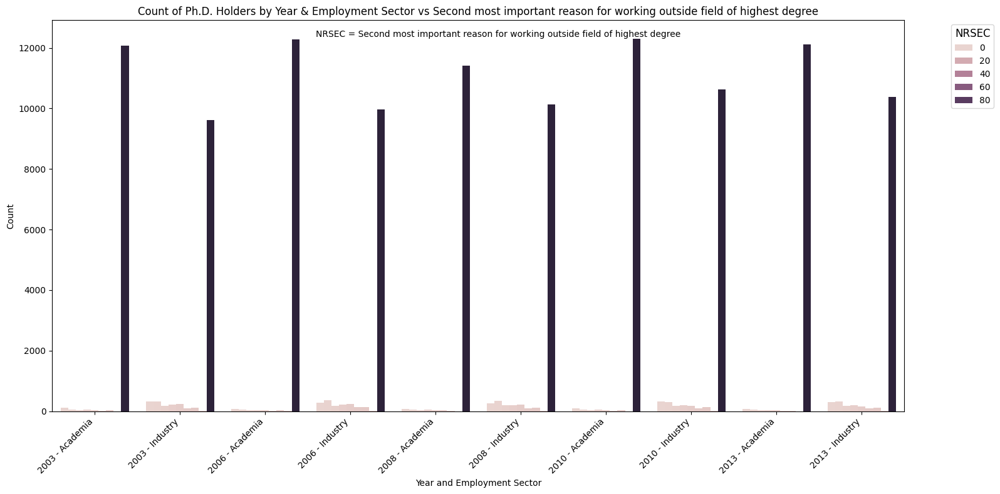

In [149]:
plot_years_and_variable(df2, 'NRSEC')

In [150]:
data_dict['NRSEC']

{'var_desc_short': 'Second most important reason for working outside field of highest degree',
 'var_desc': 'NRSEC reports the second most important reason that the respondent was working in a field unrelated to the field of his/her highest degree. The variable NRREA reports the most important reason that the respondent was working in a field unrelated to the field of his/her highest degree.',
 'data_values': {0: 'No second most important reason',
  1: 'Pay, promotion opportunities',
  2: 'Working conditions',
  3: 'Job location',
  4: 'Change in career or professional interests',
  5: 'Family-related reasons',
  6: 'Job in highest degree field not available',
  7: 'Other reason for not working',
  96: 'Blank',
  98: 'Logical Skip'}}

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [151]:
columns_to_drop.append('NRSEC')

### NRCHG

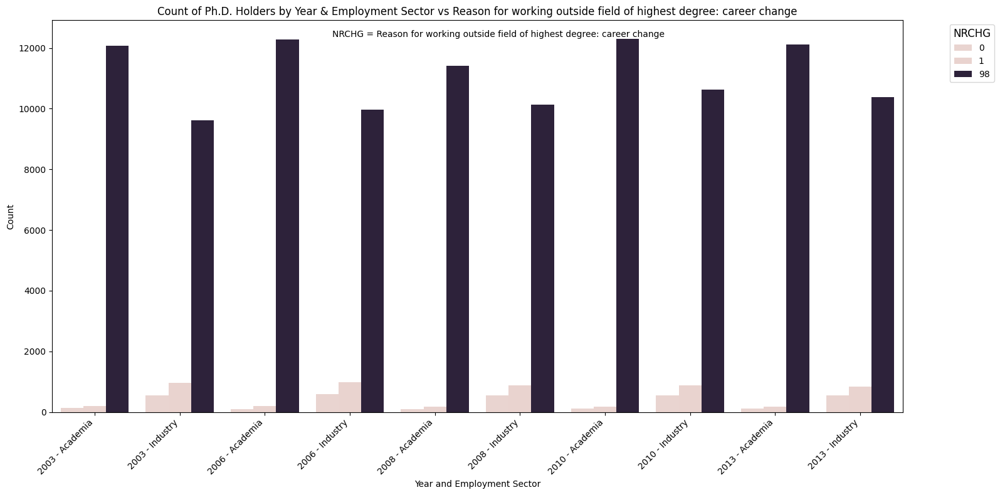

In [152]:
plot_years_and_variable(df2, 'NRCHG')

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [153]:
columns_to_drop.append('NRCHG')

### NRCON

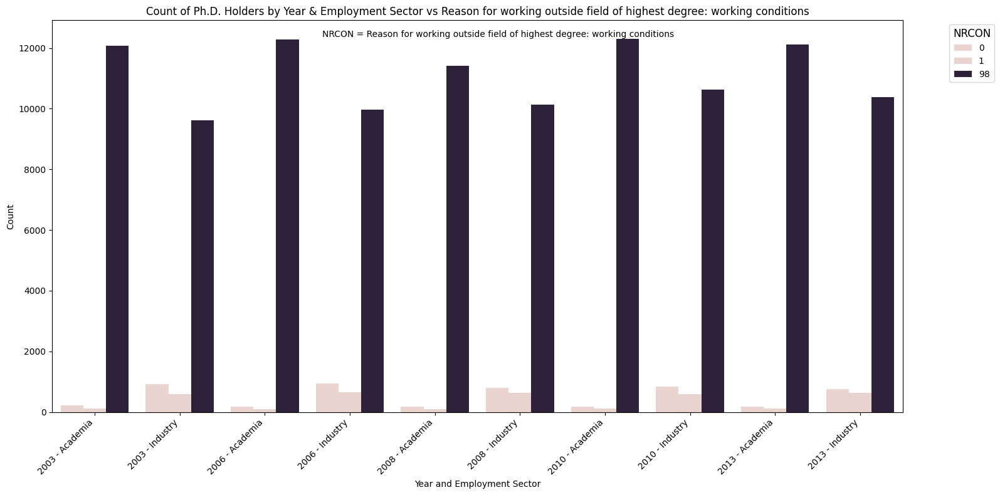

In [154]:
plot_years_and_variable(df2, 'NRCON')

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [155]:
columns_to_drop.append('NRCON')

### NRFAM

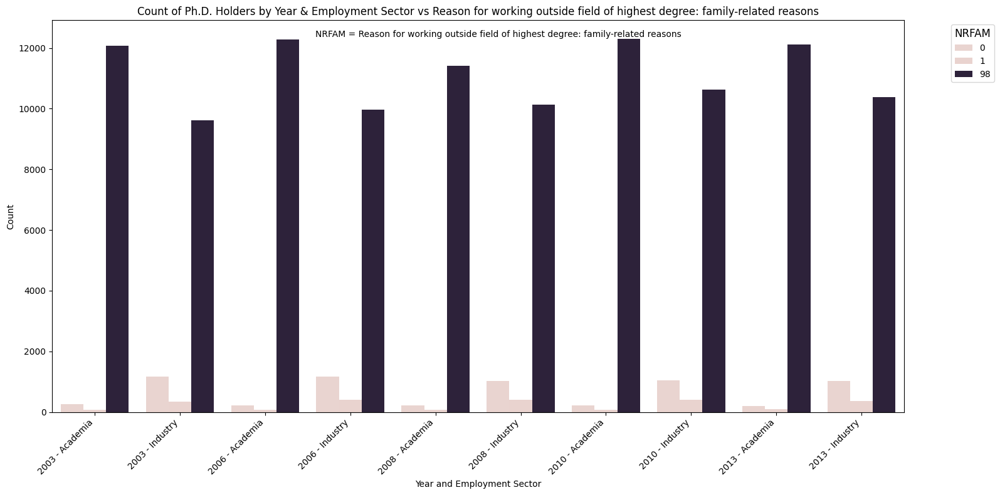

In [156]:
plot_years_and_variable(df2, 'NRFAM')

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [157]:
columns_to_drop.append('NRFAM')

### NRLOC

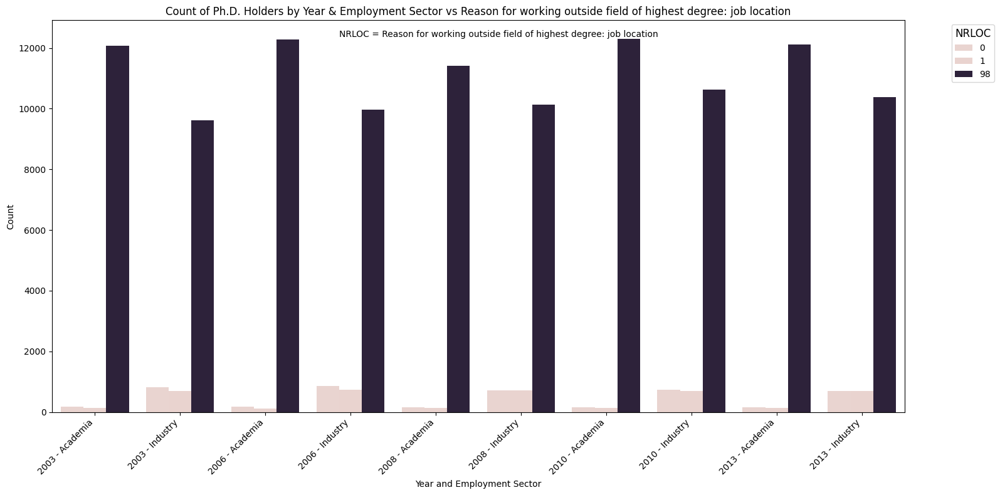

In [158]:
plot_years_and_variable(df2, 'NRLOC')

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [159]:
columns_to_drop.append('NRLOC')

### NROCNA

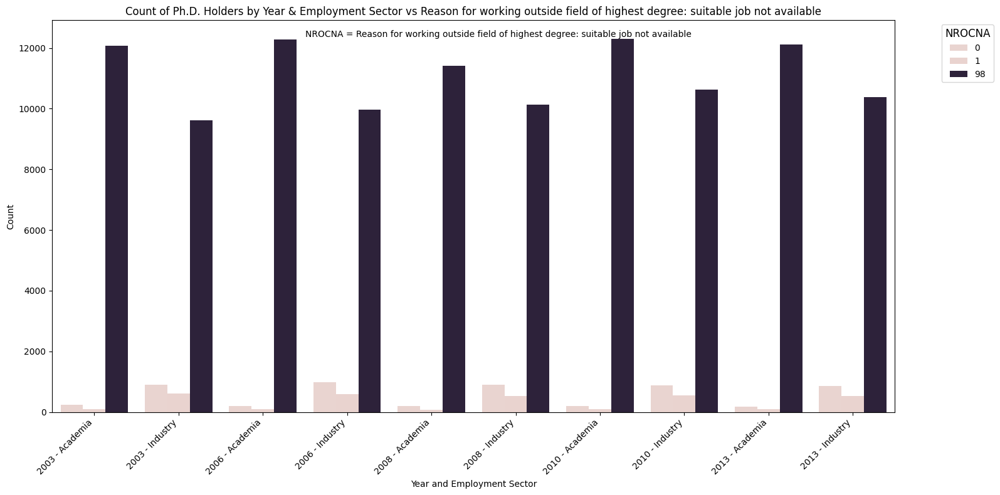

In [160]:
plot_years_and_variable(df2, 'NROCNA')

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [161]:
columns_to_drop.append('NROCNA')

### NROT

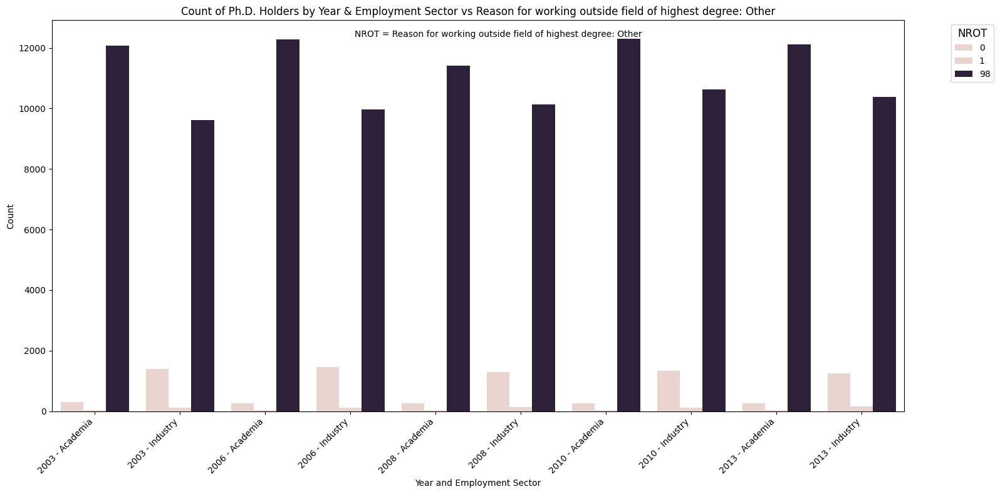

In [162]:
plot_years_and_variable(df2, 'NROT')

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [163]:
columns_to_drop.append('NROT')

### NRPAY

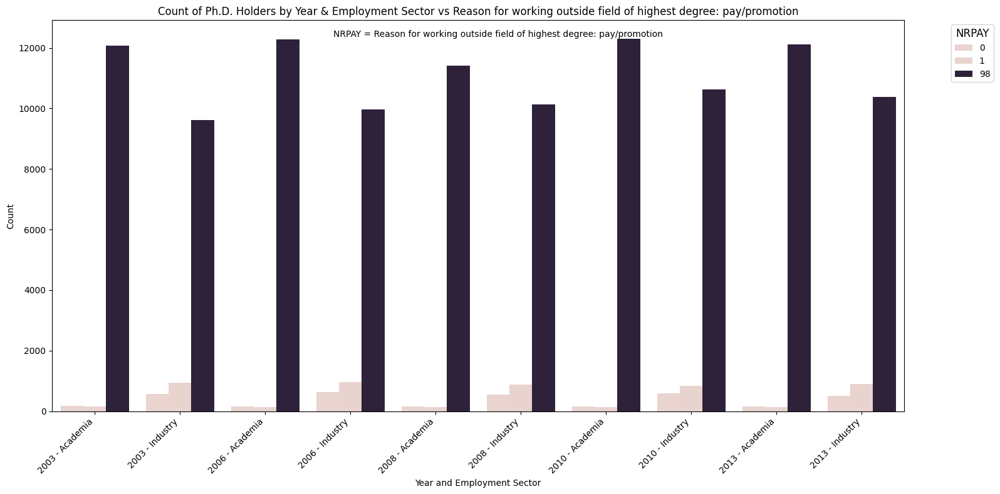

In [164]:
plot_years_and_variable(df2, 'NRPAY')

Most repondents skipped this question, but there were more non-skipped answers in industry than academia, indicating that respondents working in industry often work outside their degree. Since the proportion of skipped repsonses is too high, we will drop this column.

In [165]:
columns_to_drop.append('NRPAY')

### JOBSATIS

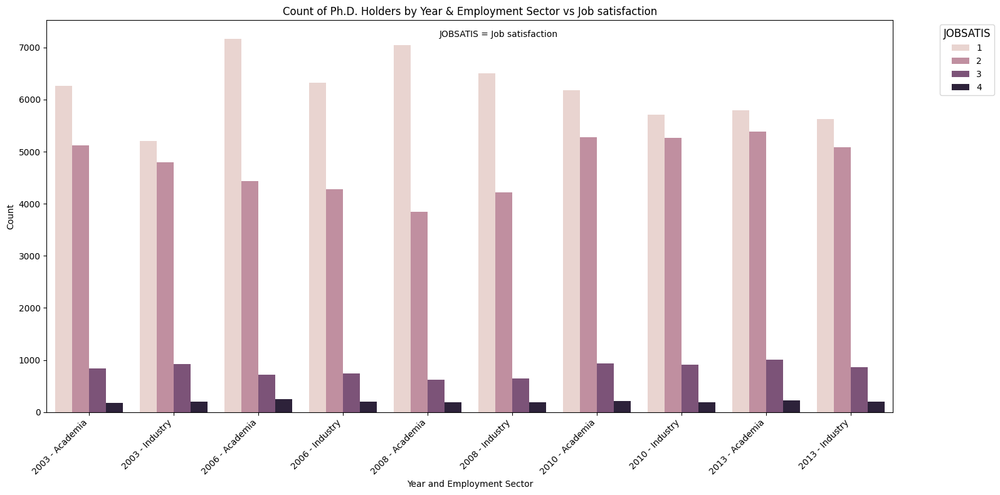

In [166]:
plot_years_and_variable(df2, 'JOBSATIS')

In [167]:
data_dict['JOBSATIS']

{'var_desc_short': 'Job satisfaction',
 'var_desc': 'JOBSATIS reports how satisfied the respondent is with his/her current job.',
 'data_values': {1: 'Very satisfied',
  2: 'Somewhat satisfied',
  3: 'Somewhat dissatisfied',
  4: 'Very dissatisfied',
  98: 'Logical Skip'}}

In 2003, 2006, and 2008, we see that job satisfaction is generally very high, more so in academia than industry. After 2010, 'very high' job satisfaction reduces, and 'somewhat satisfied' responses become more popular. Interesting. We will keep this column, and it may be a target variable of interest, because job satisfaction has been used as a proxy for staying or leaving the job in the literature (Dorenkamp & Weiß, 2017; Szromek & Wolniak, 2020; Xu, 2008; Makridis, 2021). If we do keep it as a target variable, we may need to re-encode the values to be binary, e.g. let 1 and 2 be represented by 1 to represenent satisfaction with job and hence not leaving the job, and 3 and 4 be represented by 0 to represent dissatisfaction with job and hence risk of leaving the job.

In [168]:
columns_to_keep.append('JOBSATIS')

### SATADV

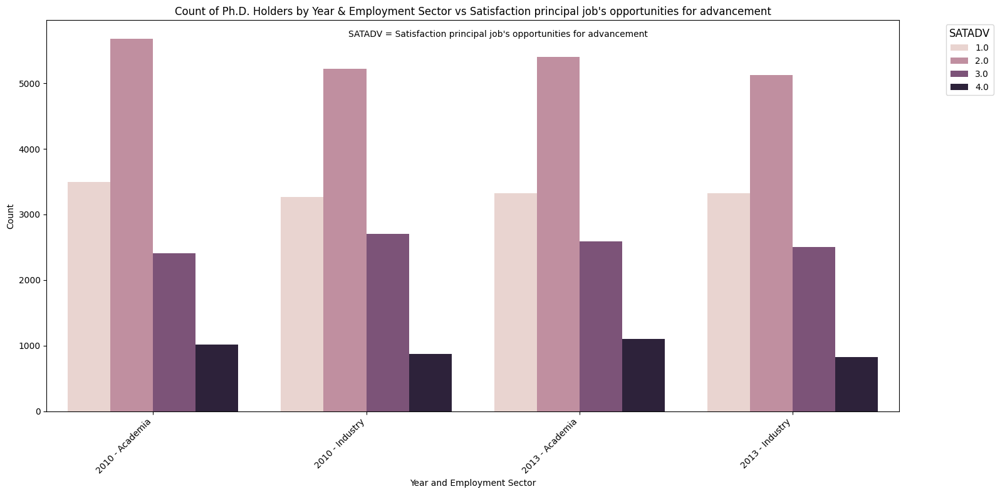

In [169]:
plot_years_and_variable(df2, 'SATADV')

Since there is only data from 2010 and 2013, we will drop this column.

In [170]:
columns_to_drop.append('SATADV')

### SATBEN

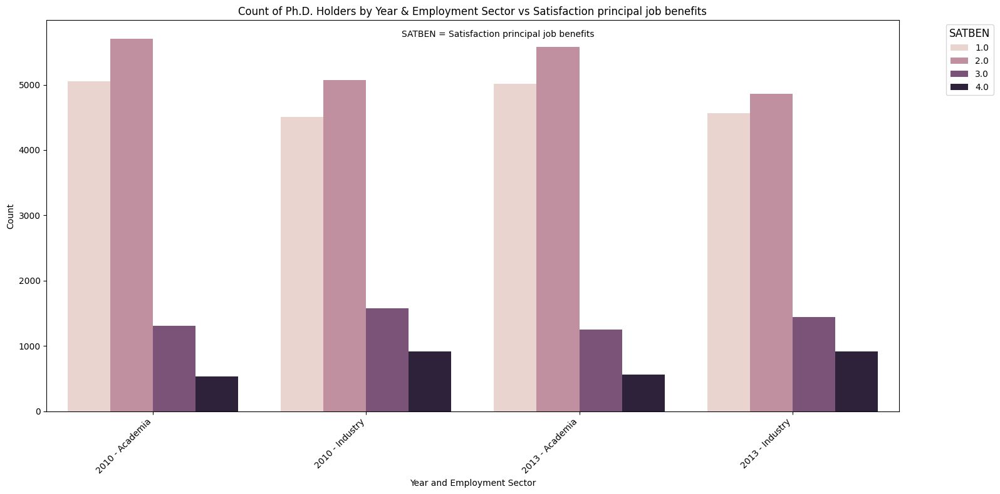

In [171]:
plot_years_and_variable(df2, 'SATBEN')

Since there is only data from 2010 and 2013, we will drop this column.

In [172]:
columns_to_drop.append('SATBEN')

### SATCHAL

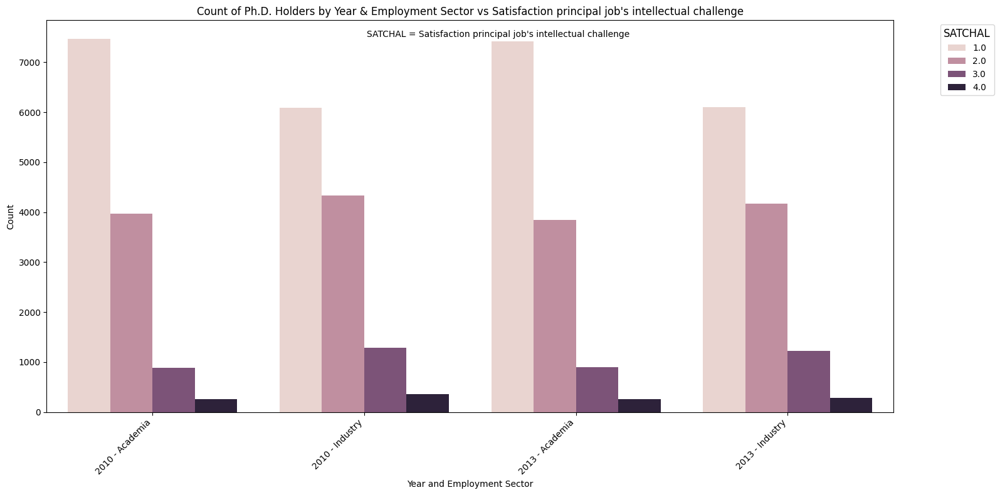

In [173]:
plot_years_and_variable(df2, 'SATCHAL')

Since there is only data from 2010 and 2013, we will drop this column.

In [174]:
columns_to_drop.append('SATCHAL')

### SATIND

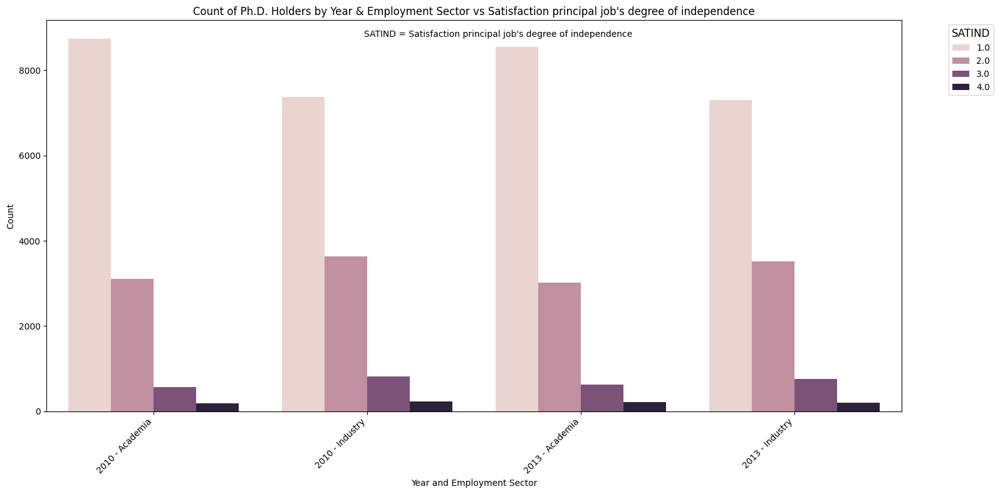

In [175]:
plot_years_and_variable(df2, 'SATIND')

Since there is only data from 2010 and 2013, we will drop this column.

In [176]:
columns_to_drop.append('SATIND')

### SATLOC

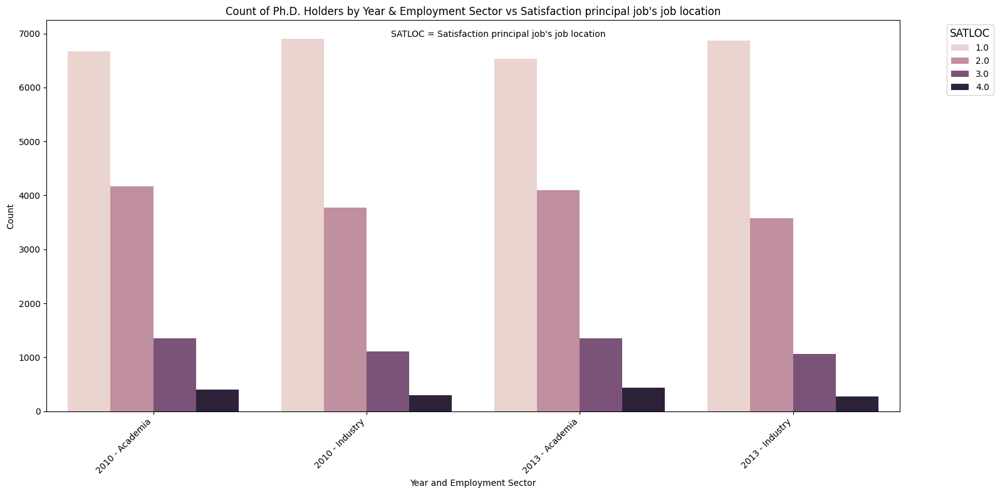

In [177]:
plot_years_and_variable(df2, 'SATLOC')

Since there is only data from 2010 and 2013, we will drop this column.

In [178]:
columns_to_drop.append('SATLOC')

### SATRESP

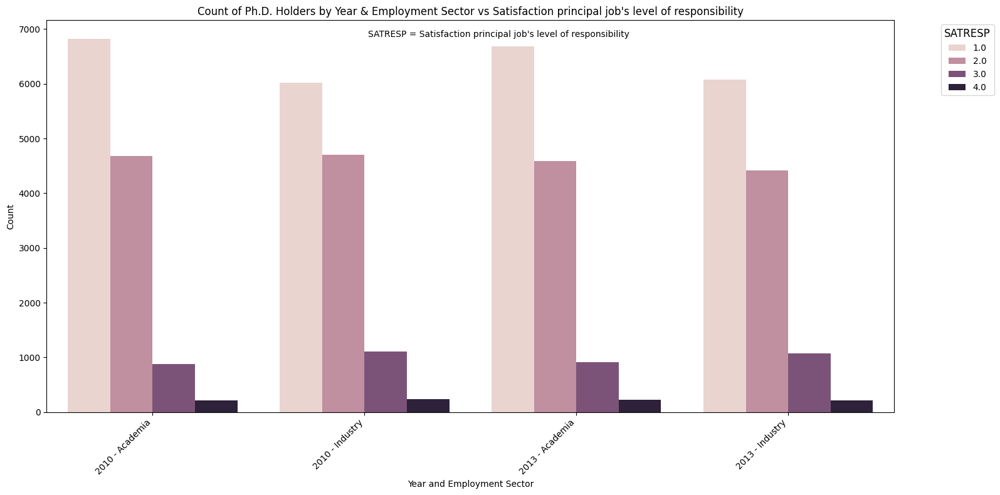

In [179]:
plot_years_and_variable(df2, 'SATRESP')

Since there is only data from 2010 and 2013, we will drop this column.

In [180]:
columns_to_drop.append('SATRESP')

### SATSAL

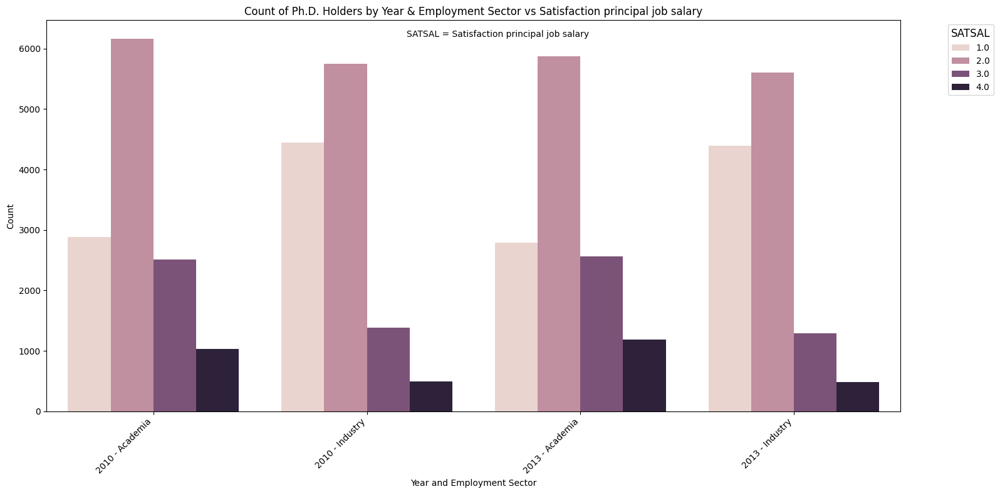

In [181]:
plot_years_and_variable(df2, 'SATSAL')

Since there is only data from 2010 and 2013, we will drop this column.

In [182]:
columns_to_drop.append('SATSAL')

### SATSEC

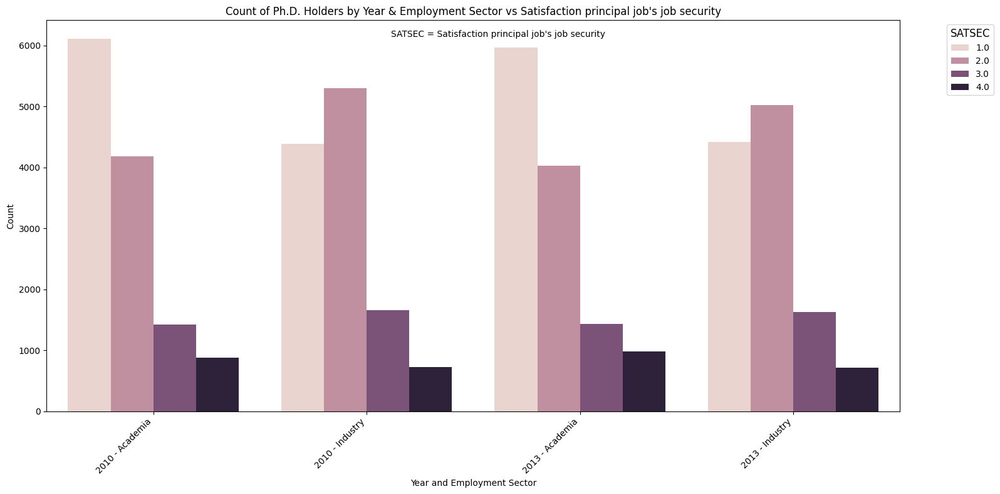

In [183]:
plot_years_and_variable(df2, 'SATSEC')

Since there is only data from 2010 and 2013, we will drop this column.

In [184]:
columns_to_drop.append('SATSEC')

### SATSOC

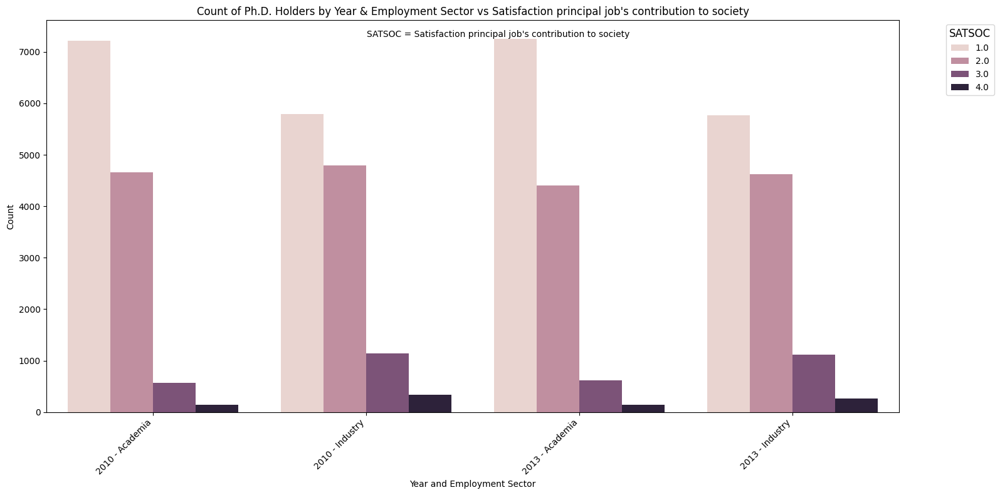

In [185]:
plot_years_and_variable(df2, 'SATSOC')

Since there is only data from 2010 and 2013, we will drop this column.

In [186]:
columns_to_drop.append('SATSOC')

### WKTRNI

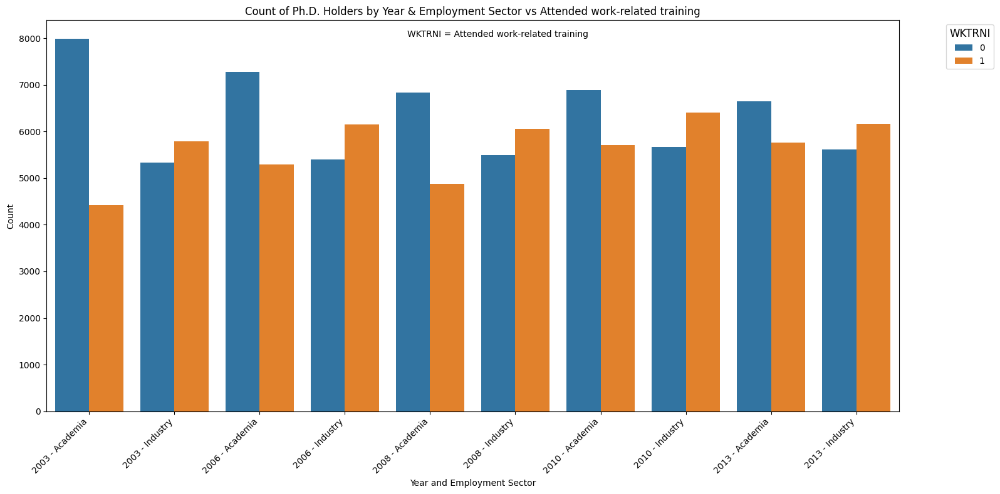

In [187]:
plot_years_and_variable(df2, 'WKTRNI')

In [188]:
data_dict['WKTRNI']

{'var_desc_short': 'Attended work-related training',
 'var_desc': 'WKTRNI indicates whether or not the respondent had attended a work-related training, workshop, or seminar within the last twelve months, not including college coursework towards a degree program.',
 'data_values': {0: 'No', 1: 'Yes', 98: 'Logical Skip'}}

The number of respondents who did not attend training is higher than those who did in the academic sector, however as time goes on, the proportions become roughly equal. On the other hand, the number of respondents who did attend training is higher for industry. We will inspect this variable further.

In [189]:
columns_to_inspect.append('WKTRNI')

### WTREASN

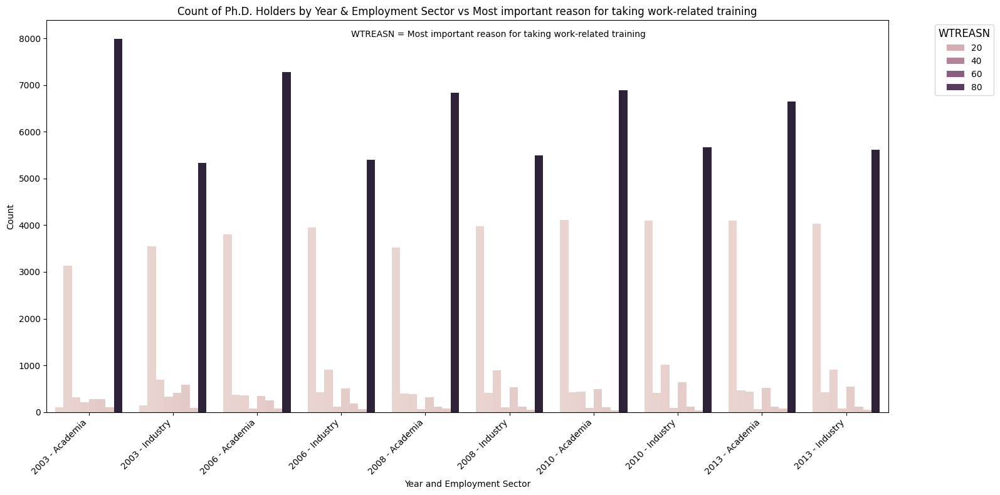

In [190]:
plot_years_and_variable(df2, 'WTREASN')

The number of skipped reponses is higher than reponses. We will discard this variable and its related variables.

In [191]:
columns_to_drop.append('WTREASN')

### WTRADV

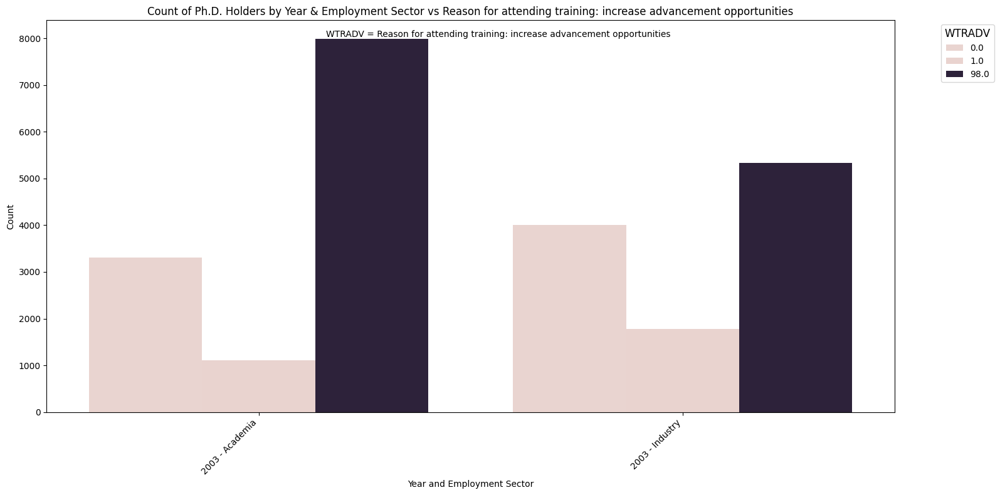

In [192]:
plot_years_and_variable(df2, 'WTRADV')

The number of skipped reponses is higher than reponses. Also, there is only data from 2003. We will discard this variable and its related variables.

In [193]:
columns_to_drop.append('WTRADV')

### WTRCHG

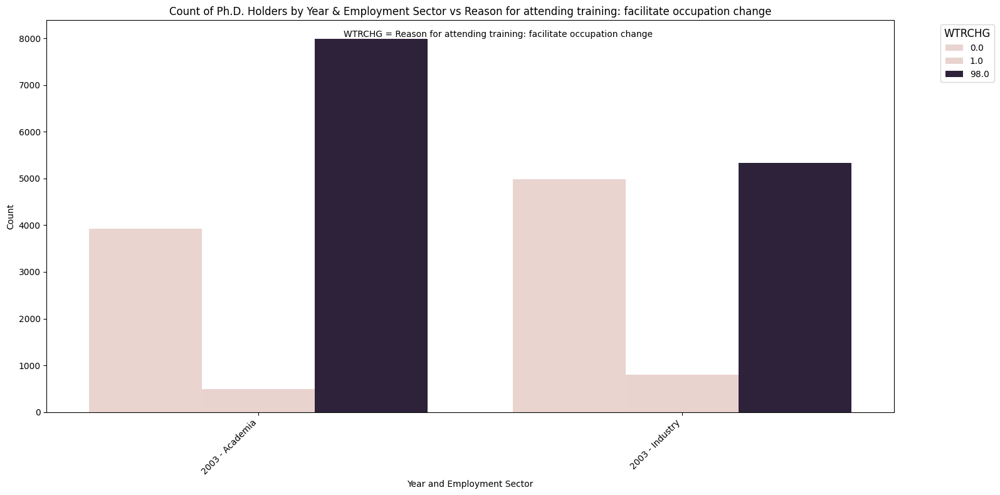

In [194]:
plot_years_and_variable(df2, 'WTRCHG')

The number of skipped reponses is higher than reponses. Also, there is only data from 2003. We will discard this variable and its related variables.

In [195]:
columns_to_drop.append('WTRCHG')

### WTRCHOC

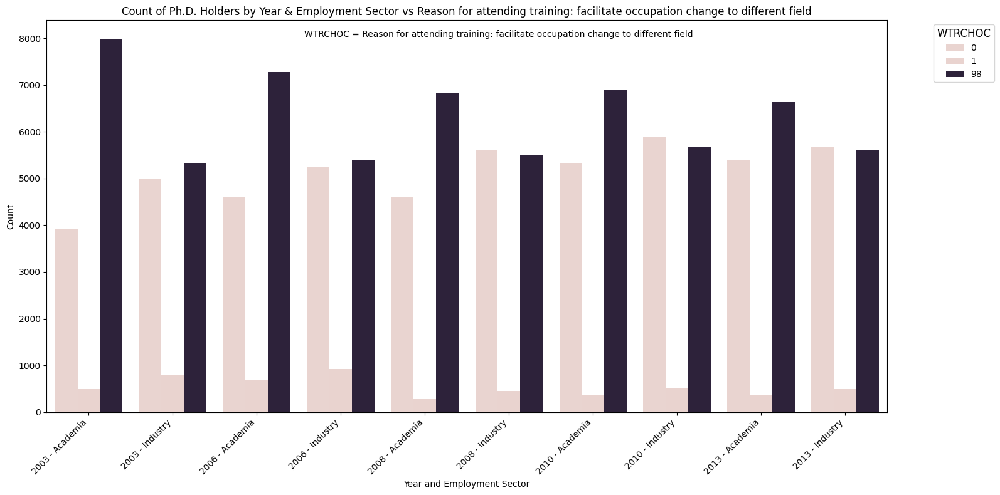

In [196]:
plot_years_and_variable(df2, 'WTRCHOC')

The number of skipped reponses is higher than reponses. We will discard this variable and its related variables.

In [197]:
columns_to_drop.append('WTRCHOC')

### WTREM

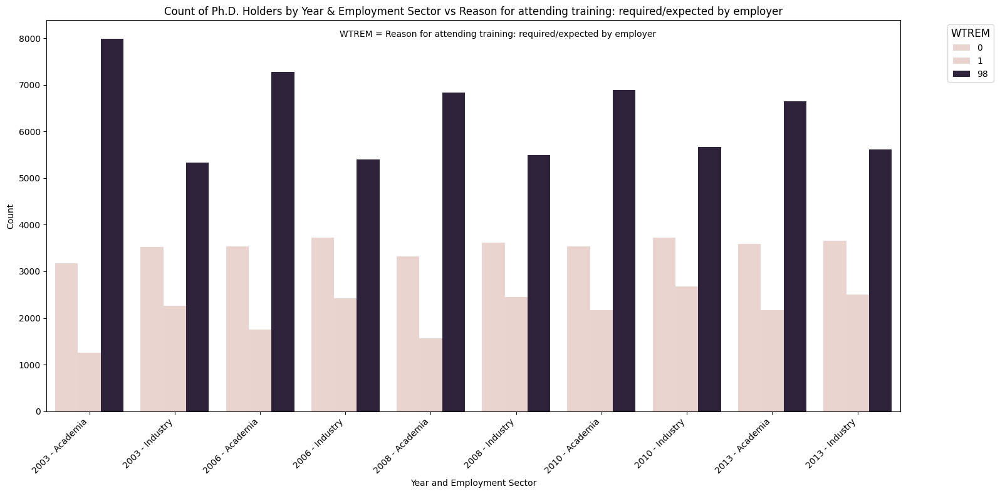

In [198]:
plot_years_and_variable(df2, 'WTREM')

The number of skipped reponses is higher than reponses. We will discard this variable and its related variables.

In [199]:
columns_to_drop.append('WTREM')

### WTRLIC

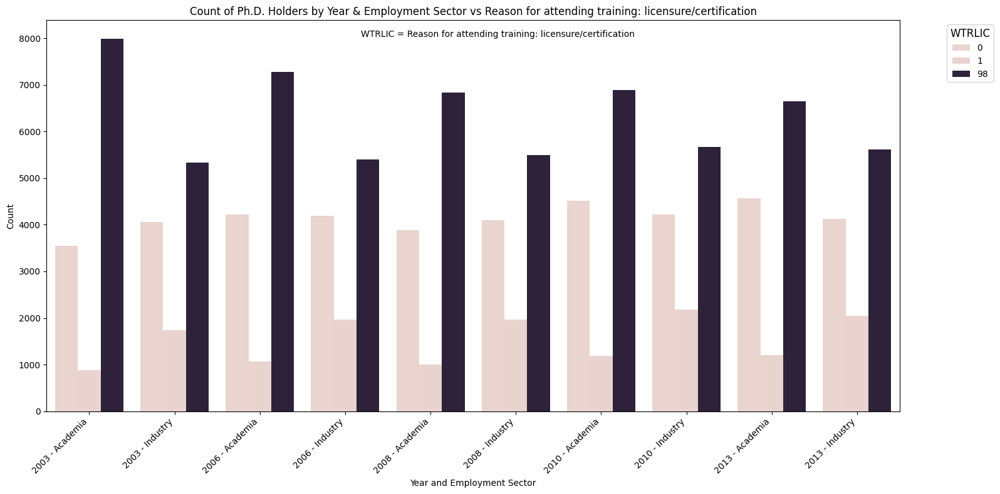

In [200]:
plot_years_and_variable(df2, 'WTRLIC')

The number of skipped reponses is higher than reponses. We will discard this variable and its related variables.

In [201]:
columns_to_drop.append('WTRLIC')

### WTRNEW

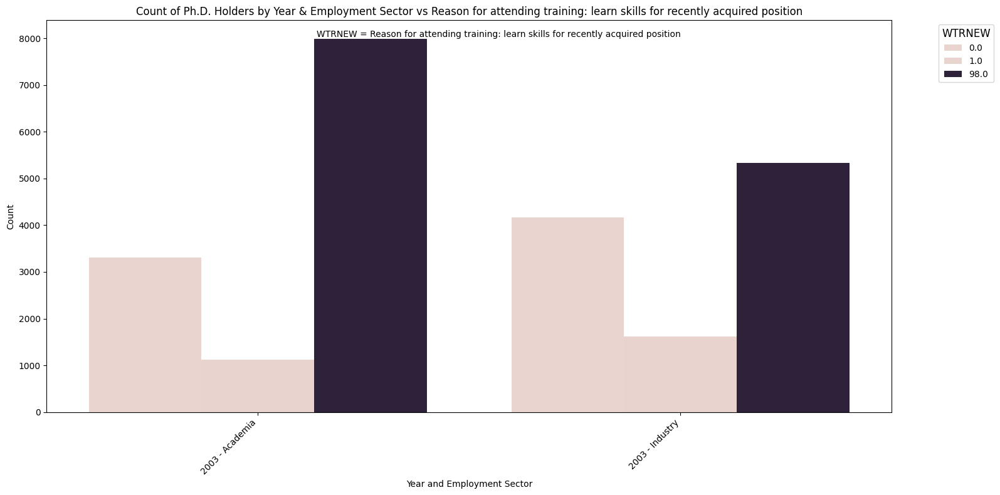

In [202]:
plot_years_and_variable(df2, 'WTRNEW')

The number of skipped reponses is higher than reponses. Also, there is only data from 2003. We will discard this variable and its related variables.

In [203]:
columns_to_drop.append('WTRNEW')

### WTROPPS

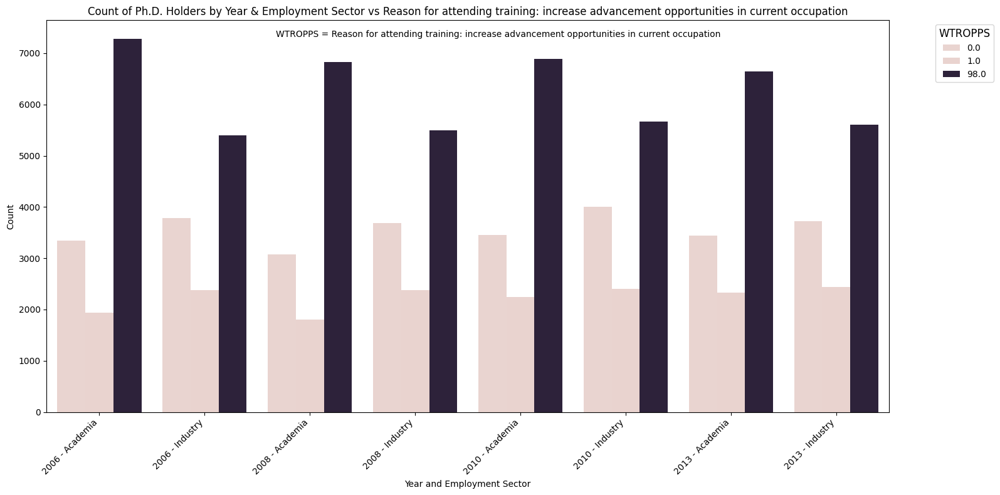

In [204]:
plot_years_and_variable(df2, 'WTROPPS')

The number of skipped reponses is higher than reponses. We will discard this variable and its related variables.

In [205]:
columns_to_drop.append('WTROPPS')

### WTROT

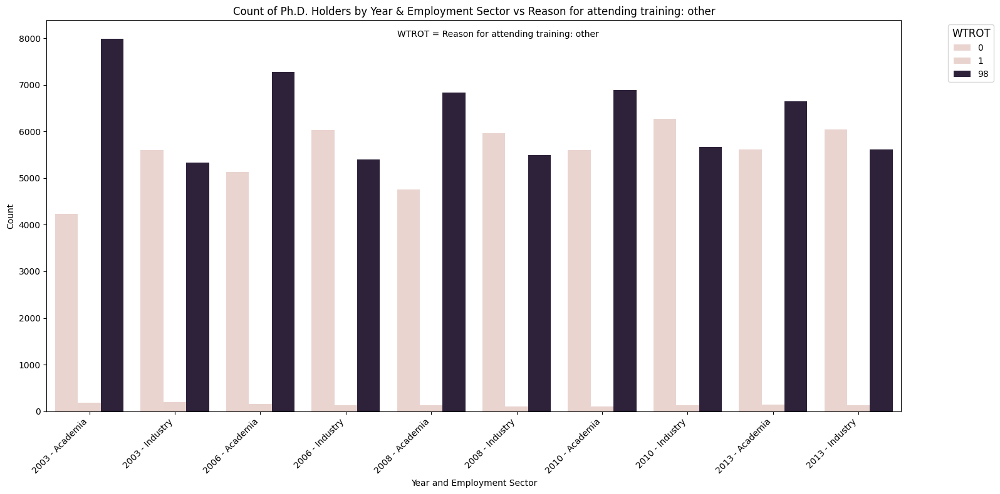

In [206]:
plot_years_and_variable(df2, 'WTROT')

The number of skipped reponses is higher than reponses. We will discard this variable and its related variables.

In [207]:
columns_to_drop.append('WTROT')

### WTRPERS

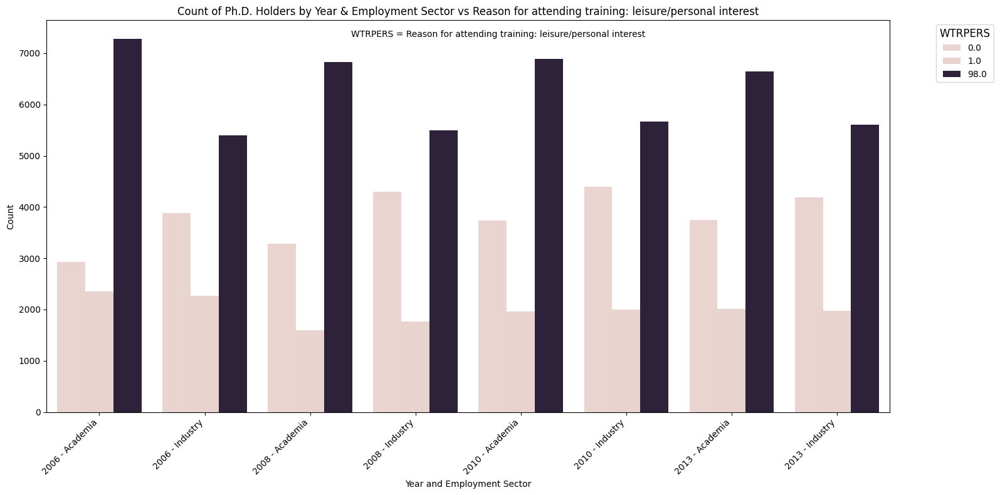

In [208]:
plot_years_and_variable(df2, 'WTRPERS')

The number of skipped reponses is higher than reponses. We will discard this variable and its related variables.

In [209]:
columns_to_drop.append('WTRPERS')

### WTRSKL

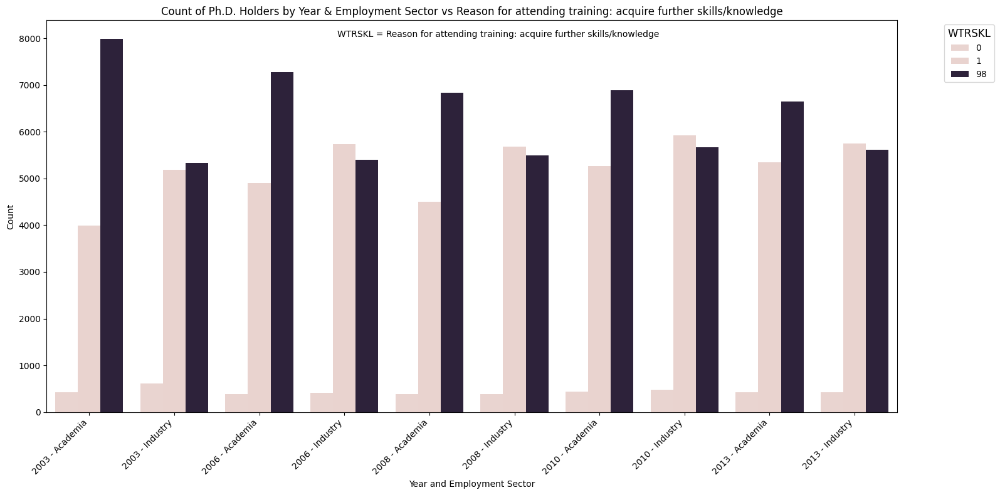

In [210]:
plot_years_and_variable(df2, 'WTRSKL')

The number of skipped reponses is higher than reponses. We will discard this variable and its related variables.

In [211]:
columns_to_drop.append('WTRSKL')

### WTAPRF

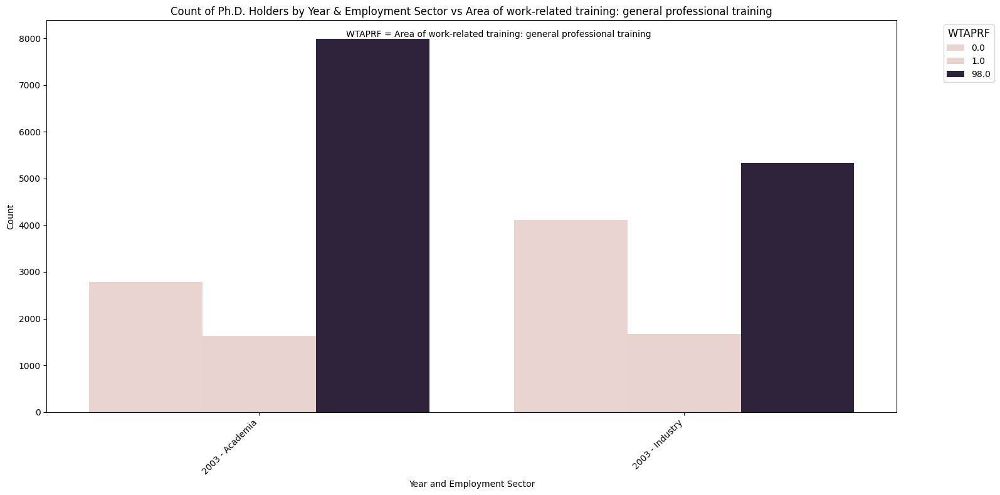

In [212]:
plot_years_and_variable(df2, 'WTAPRF')

The number of skipped reponses is higher than reponses. Also, there is only data from 2003. We will discard this variable and its related variables.

In [213]:
columns_to_drop.append('WTAPRF')

### WTMGT

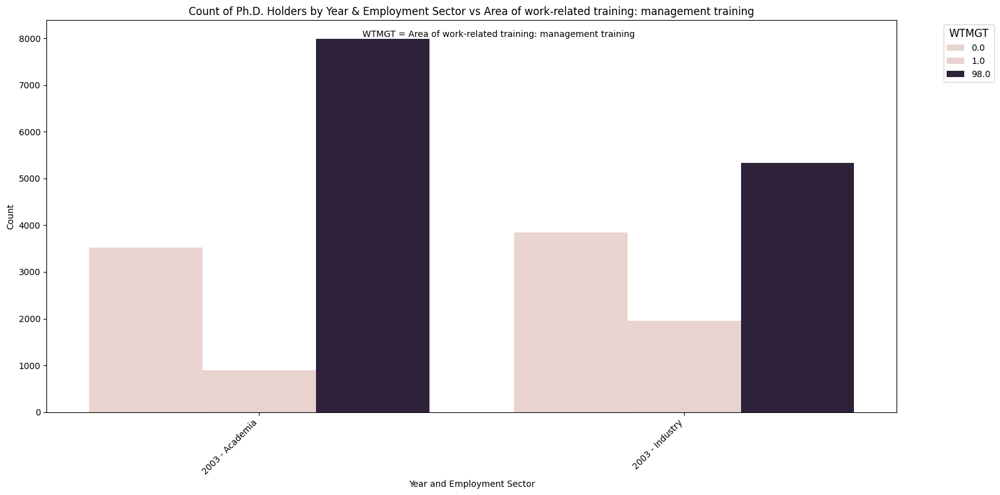

In [214]:
plot_years_and_variable(df2, 'WTMGT')

The number of skipped reponses is higher than reponses. Also, there is only data from 2003. We will discard this variable and its related variables.

In [215]:
columns_to_drop.append('WTMGT')

### WTOT

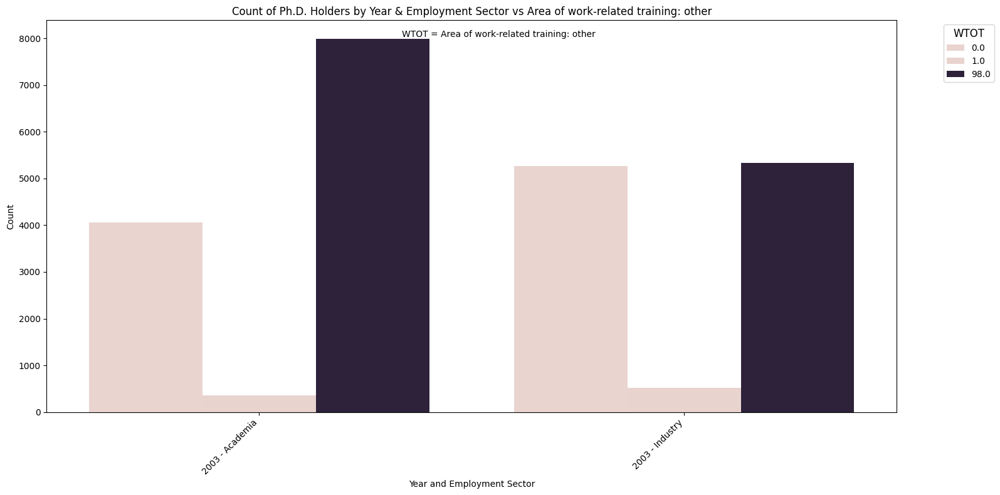

In [216]:
plot_years_and_variable(df2, 'WTOT')

The number of skipped reponses is higher than reponses. Also, there is only data from 2003. We will discard this variable and its related variables.

In [217]:
columns_to_drop.append('WTOT')

### WTTECH

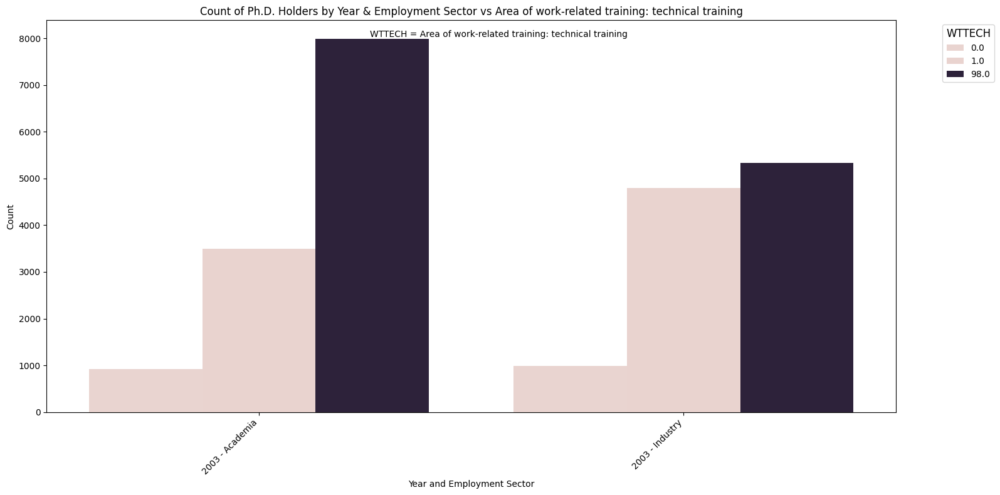

In [218]:
plot_years_and_variable(df2, 'WTTECH')

The number of skipped reponses is higher than reponses. Also, there is only data from 2003. We will discard this variable and its related variables.

In [219]:
columns_to_drop.append('WTTECH')

### MGRNAT

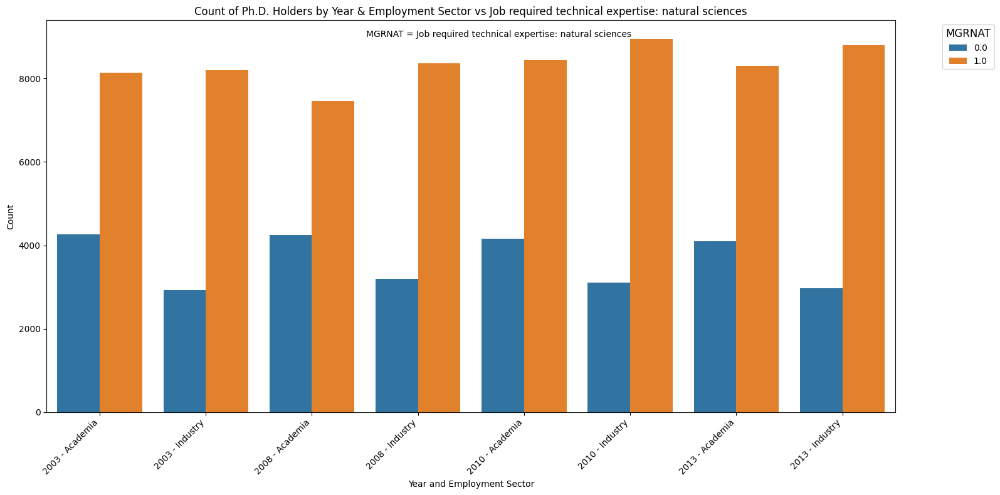

In [220]:
plot_years_and_variable(df2, 'MGRNAT')

We will discard this variable and its related variables.

In [221]:
columns_to_drop.append('MGRNAT')

### MGROTH

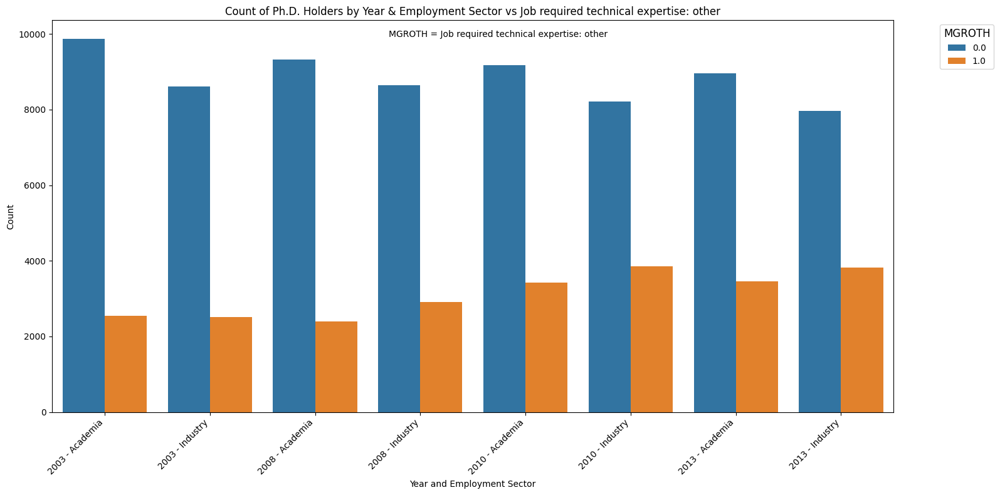

In [222]:
plot_years_and_variable(df2, 'MGROTH')

We will discard this variable and its related variables.

In [223]:
columns_to_drop.append('MGROTH')

### MGRSOC

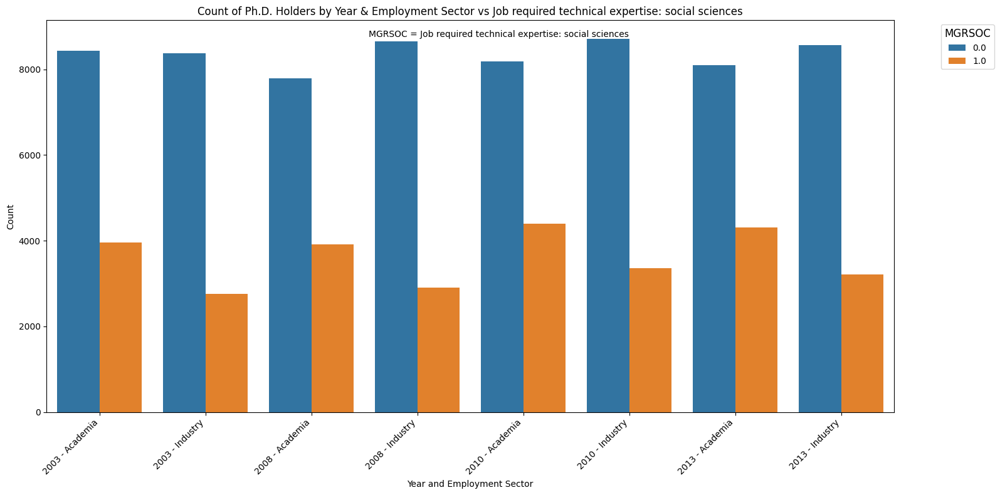

In [224]:
plot_years_and_variable(df2, 'MGRSOC')

We will discard this variable and its related variables.

In [225]:
columns_to_drop.append('MGRSOC')

### SPNAT

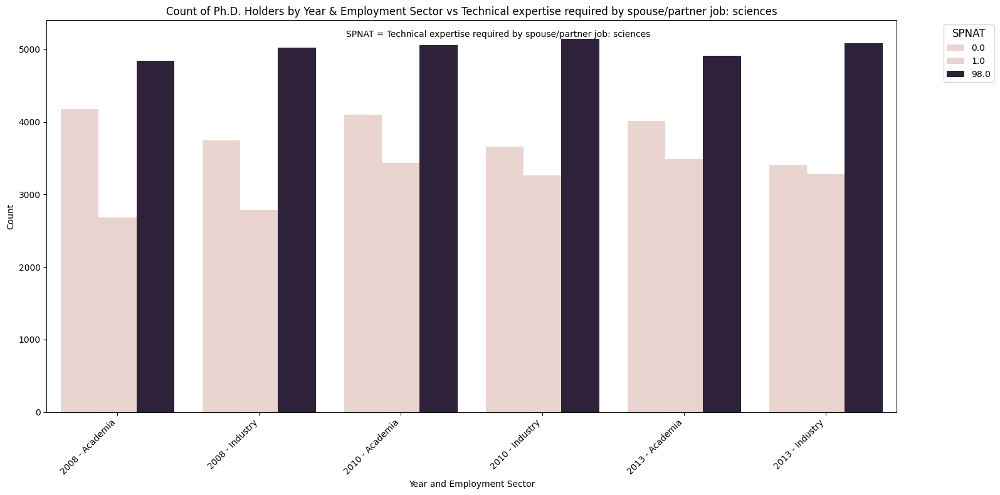

In [226]:
plot_years_and_variable(df2, 'SPNAT')

We will discard this variable and its related variables.

In [227]:
columns_to_drop.append('SPNAT')

### SPOT

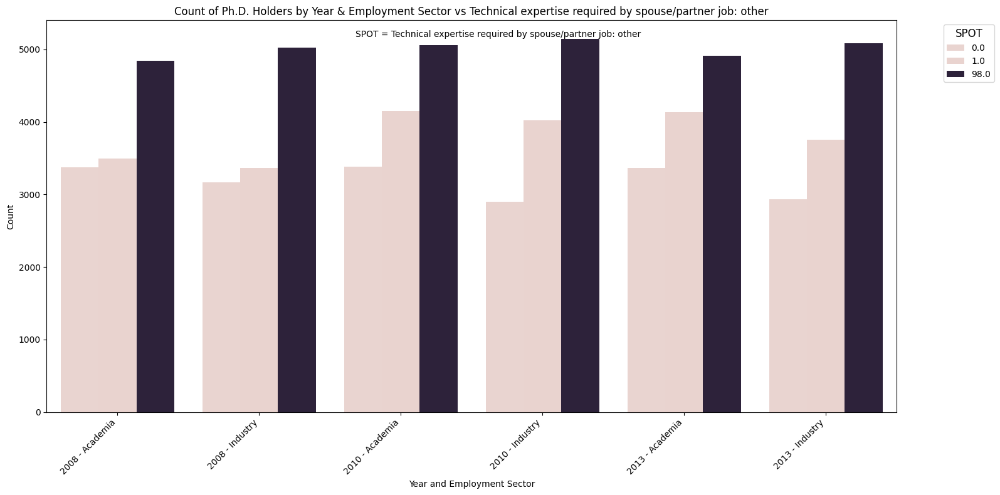

In [228]:
plot_years_and_variable(df2, 'SPOT')

We will discard this variable and its related variables.

In [229]:
columns_to_drop.append('SPOT')

### SPSOC

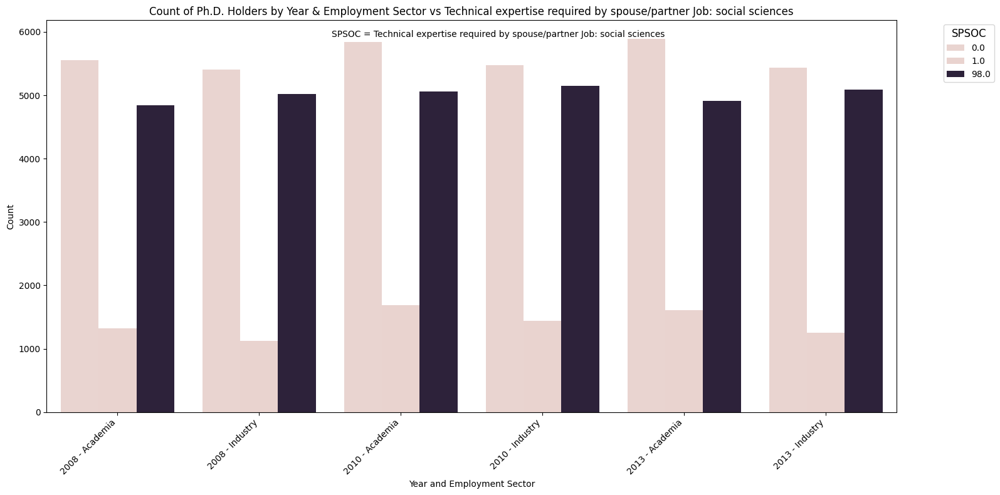

In [230]:
plot_years_and_variable(df2, 'SPSOC')

We will discard this variable and its related variables.

In [231]:
columns_to_drop.append('SPSOC')

### CHCHG

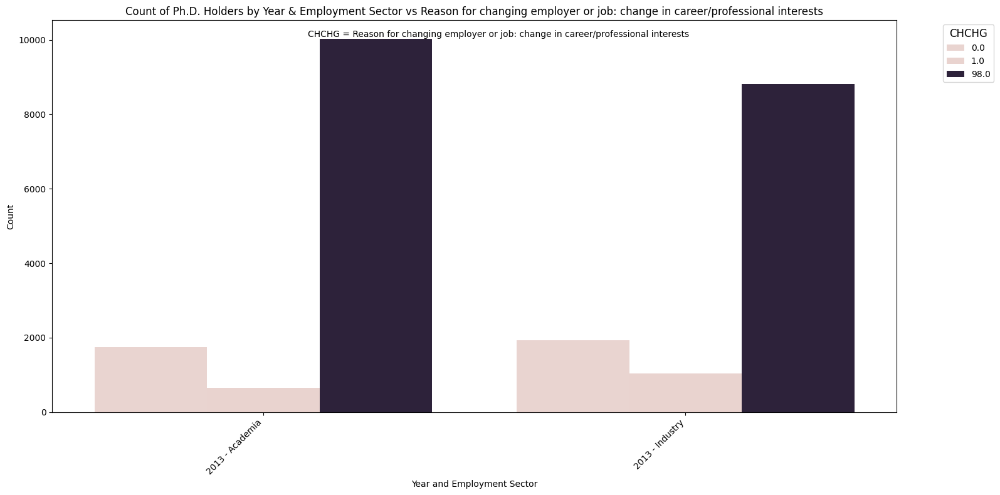

In [232]:
plot_years_and_variable(df2, 'CHCHG')

We will discard this variable and its related variables because there is only data from 2013.

In [233]:
columns_to_drop.append('CHCHG')

### CHCON

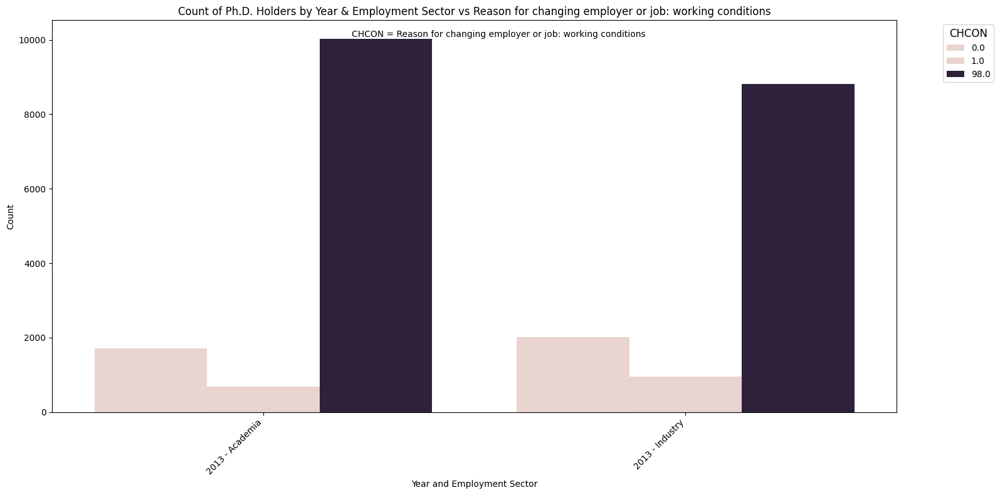

In [234]:
plot_years_and_variable(df2, 'CHCON')

We will discard this variable and its related variables because there is only data from 2013.

In [235]:
columns_to_drop.append('CHCON')

### CHFAM

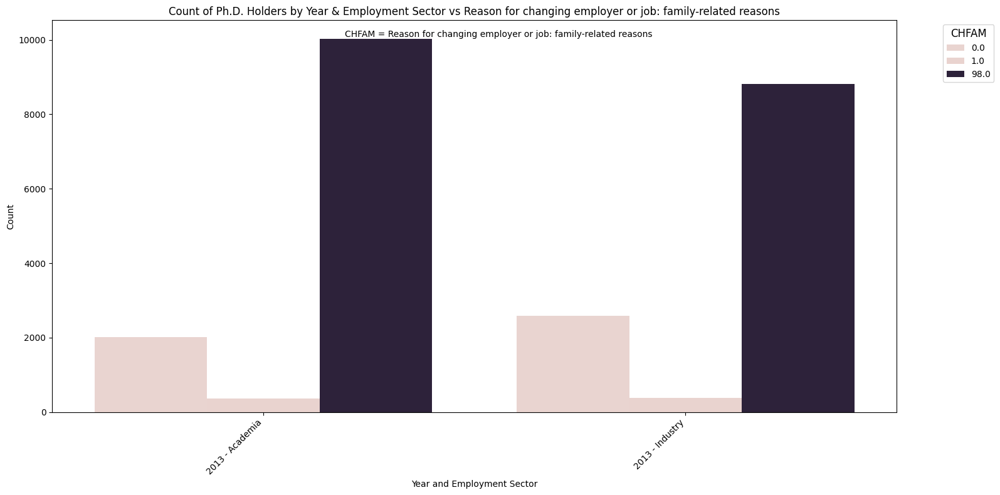

In [236]:
plot_years_and_variable(df2, 'CHFAM')

We will discard this variable and its related variables because there is only data from 2013.

In [237]:
columns_to_drop.append('CHFAM')

### CHLAY

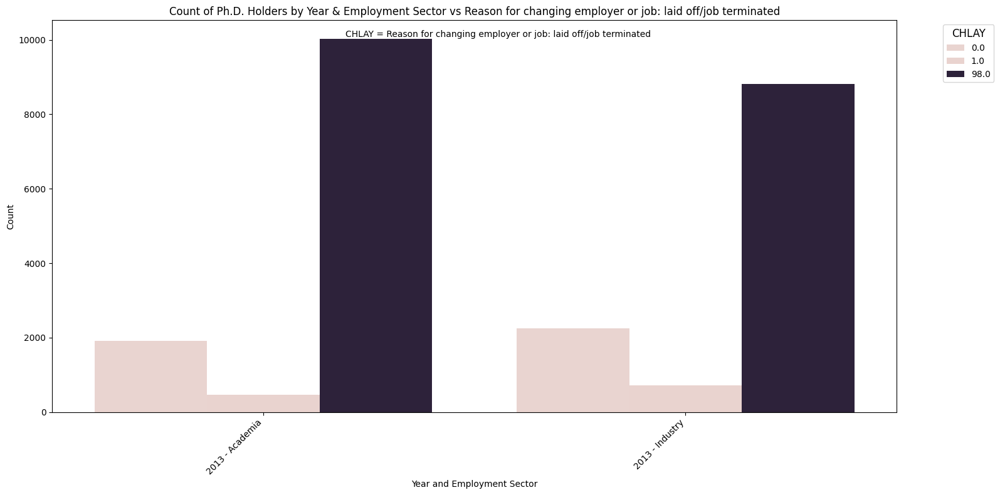

In [238]:
plot_years_and_variable(df2, 'CHLAY')

We will discard this variable and its related variables because there is only data from 2013.

In [239]:
columns_to_drop.append('CHLAY')

### CHLOC

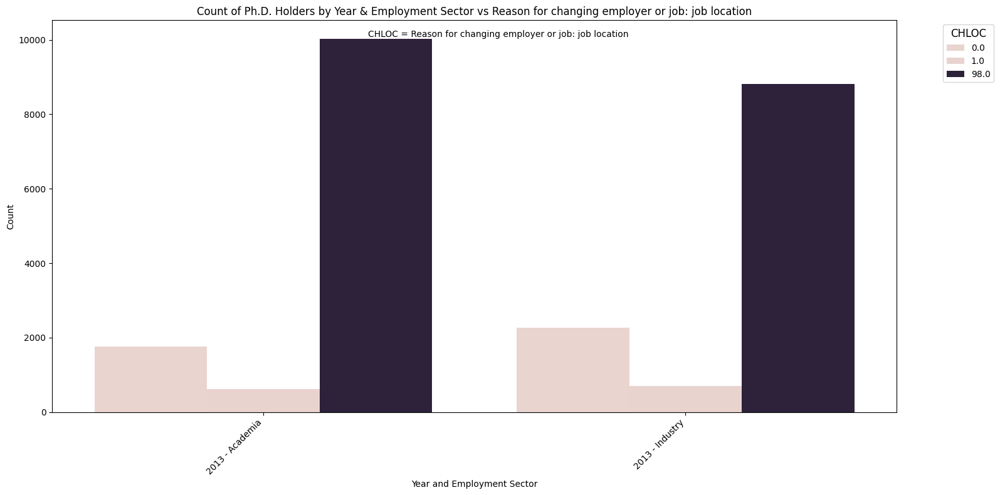

In [240]:
plot_years_and_variable(df2, 'CHLOC')

We will discard this variable and its related variables because there is only data from 2013.

In [241]:
columns_to_drop.append('CHLOC')

### CHOT

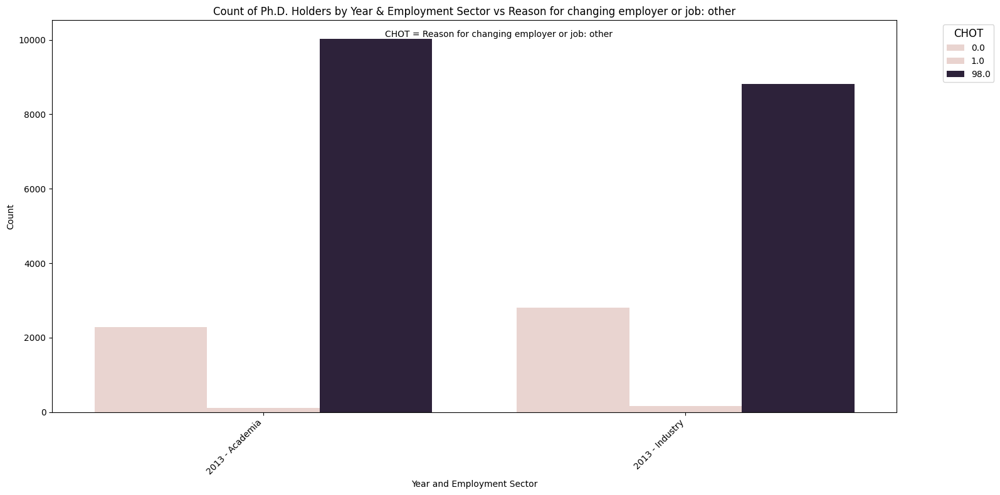

In [242]:
plot_years_and_variable(df2, 'CHOT')

We will discard this variable and its related variables because there is only data from 2013.

In [243]:
columns_to_drop.append('CHOT')

### CHPAY

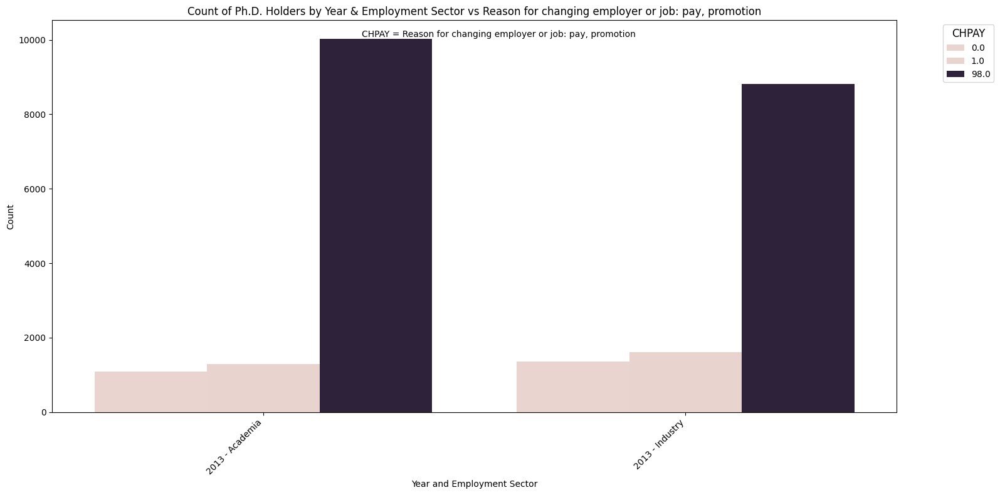

In [244]:
plot_years_and_variable(df2, 'CHPAY')

We will discard this variable and its related variables because there is only data from 2013.

In [245]:
columns_to_drop.append('CHPAY')

### CHRET

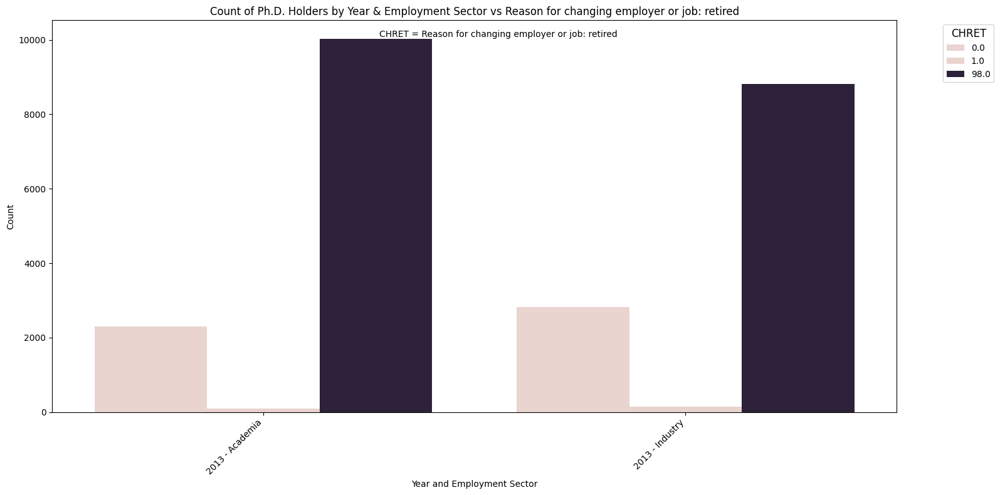

In [246]:
plot_years_and_variable(df2, 'CHRET')

We will discard this variable and its related variables because there is only data from 2013.

In [247]:
columns_to_drop.append('CHRET')

### CHSCH

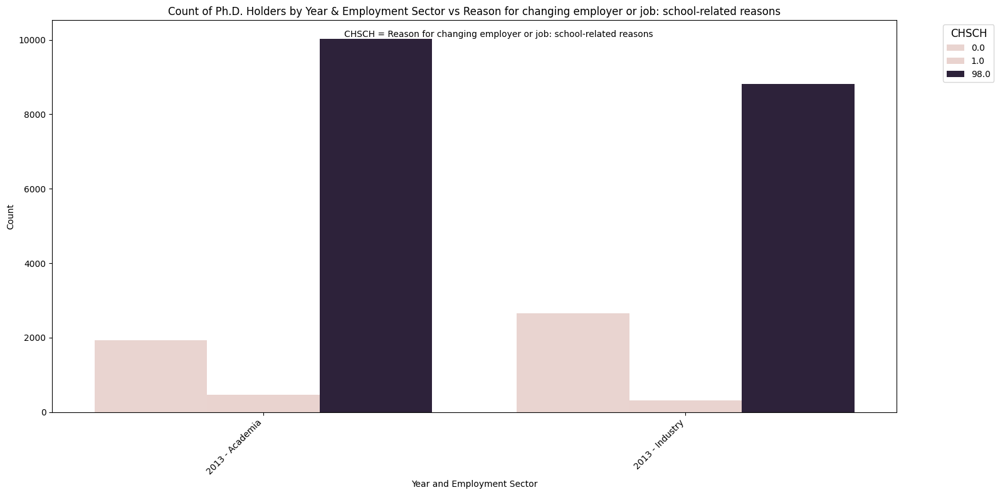

In [248]:
plot_years_and_variable(df2, 'CHSCH')

We will discard this variable and its related variables because there is only data from 2013.

In [249]:
columns_to_drop.append('CHSCH')

### ICOLLAB

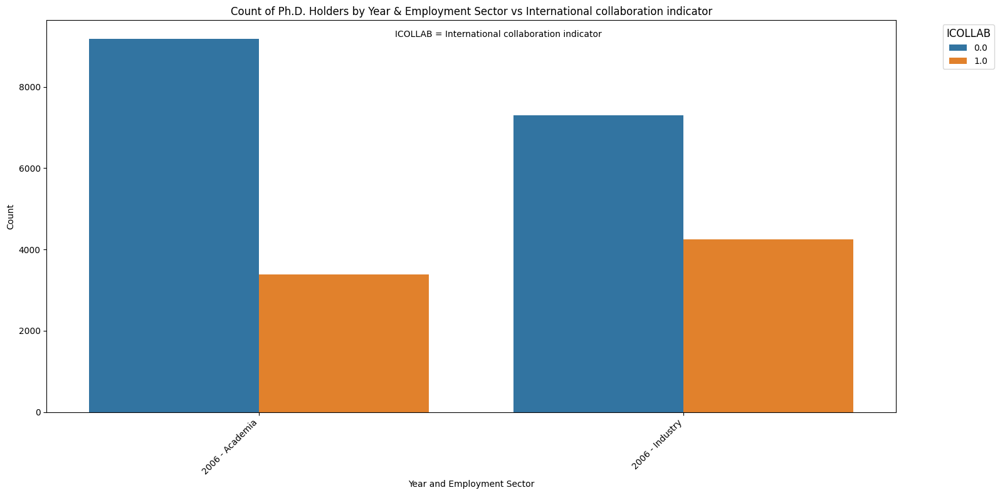

In [250]:
plot_years_and_variable(df2, 'ICOLLAB')

We will discard this variable and its related variables because there is only data from 2006.

In [251]:
columns_to_drop.append('ICOLLAB')

### ICCOMM

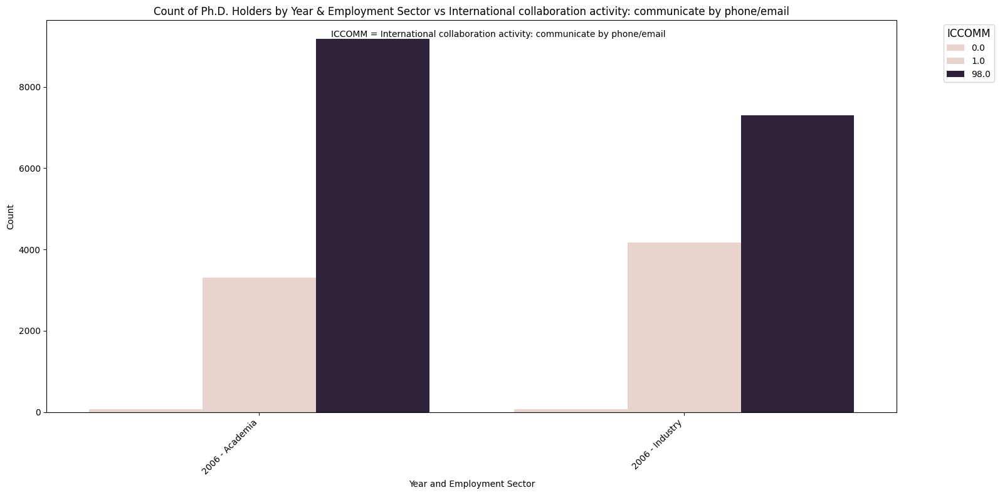

In [252]:
plot_years_and_variable(df2, 'ICCOMM')

We will discard this variable and its related variables because there is only data from 2006.

In [253]:
columns_to_drop.append('ICCOMM')

### ICTRLA

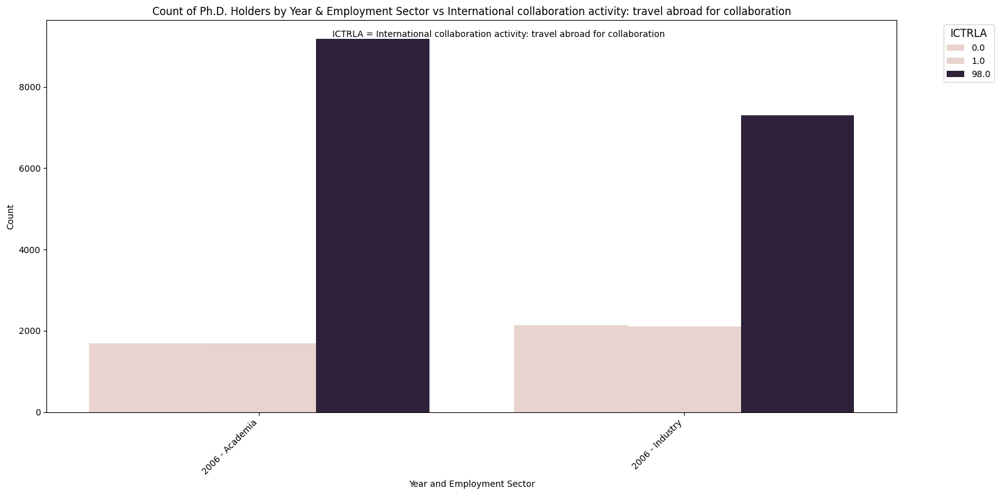

In [254]:
plot_years_and_variable(df2, 'ICTRLA')

We will discard this variable and its related variables because there is only data from 2006.

In [255]:
columns_to_drop.append('ICTRLA')

### ICTRLH

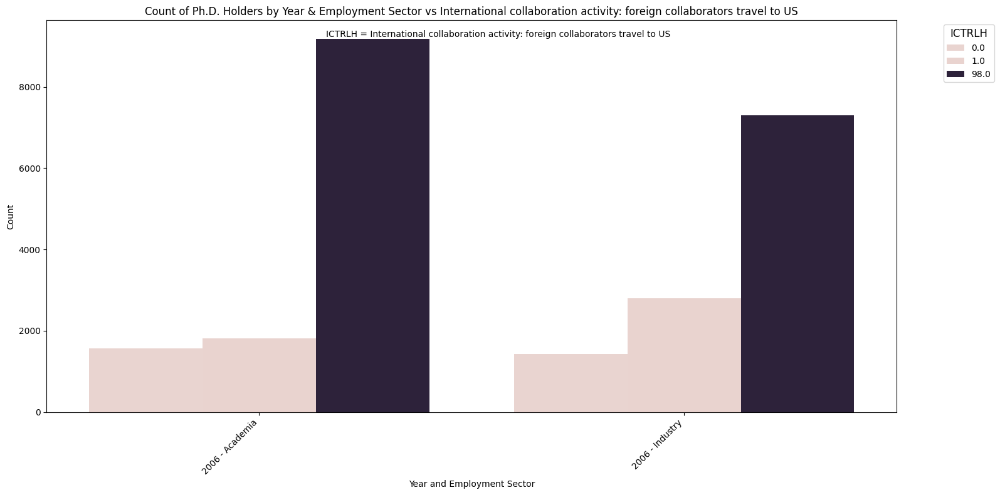

In [256]:
plot_years_and_variable(df2, 'ICTRLH')

We will discard this variable and its related variables because there is only data from 2006.

In [257]:
columns_to_drop.append('ICTRLH')

### ICWBVT

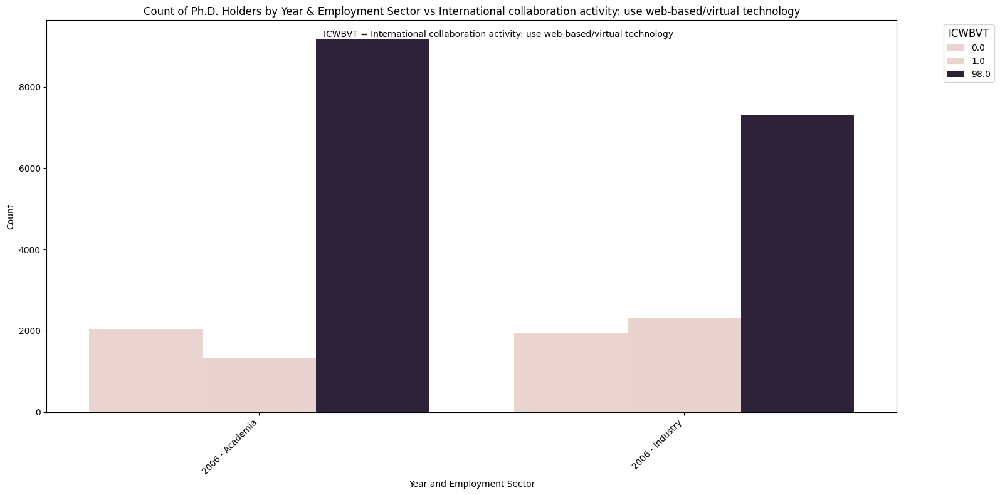

In [258]:
plot_years_and_variable(df2, 'ICWBVT')

We will discard this variable and its related variables because there is only data from 2006.

In [259]:
columns_to_drop.append('ICWBVT')

### NWFAM

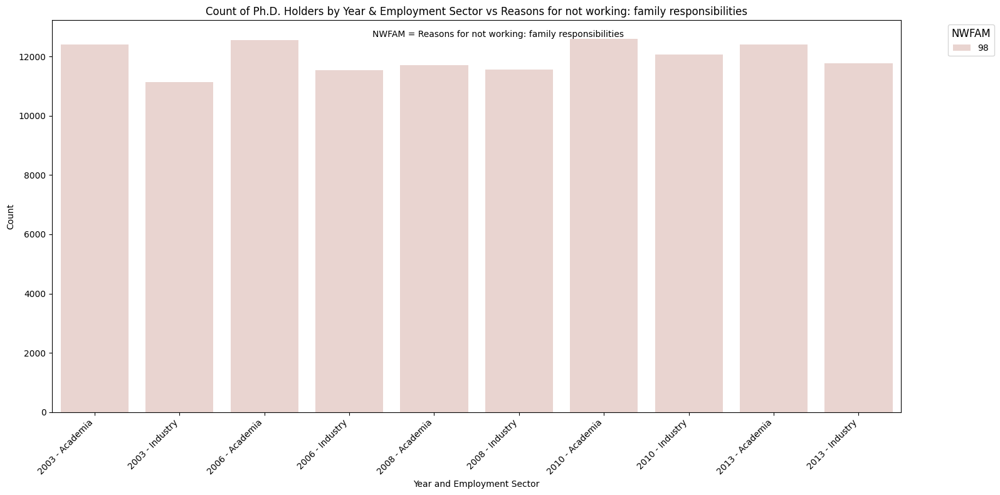

In [260]:
plot_years_and_variable(df2, 'NWFAM')

We will discard this variable and its related variables because there is only skipped answers.

In [261]:
columns_to_drop.append('NWFAM')

### NWLAY

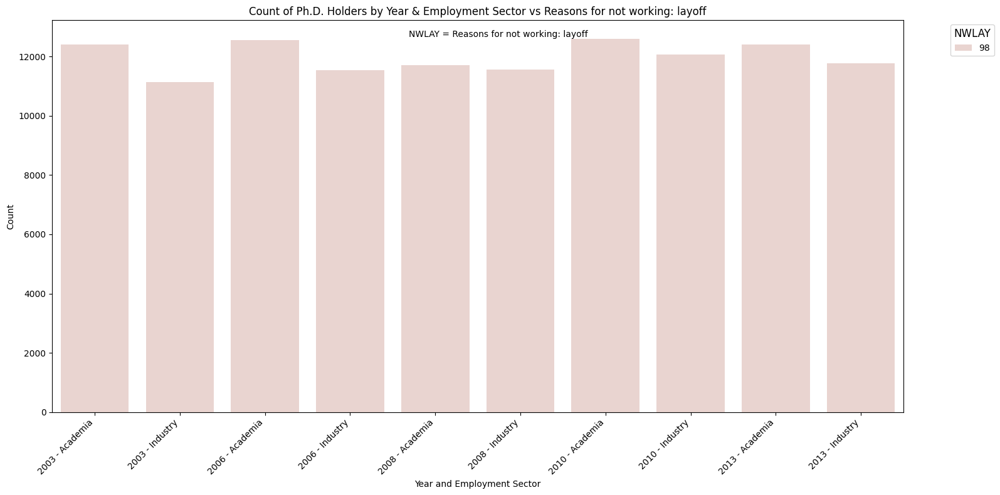

In [262]:
plot_years_and_variable(df2, 'NWLAY')

We will discard this variable and its related variables because there is only skipped answers.

In [263]:
columns_to_drop.append('NWLAY')

### NWNOND

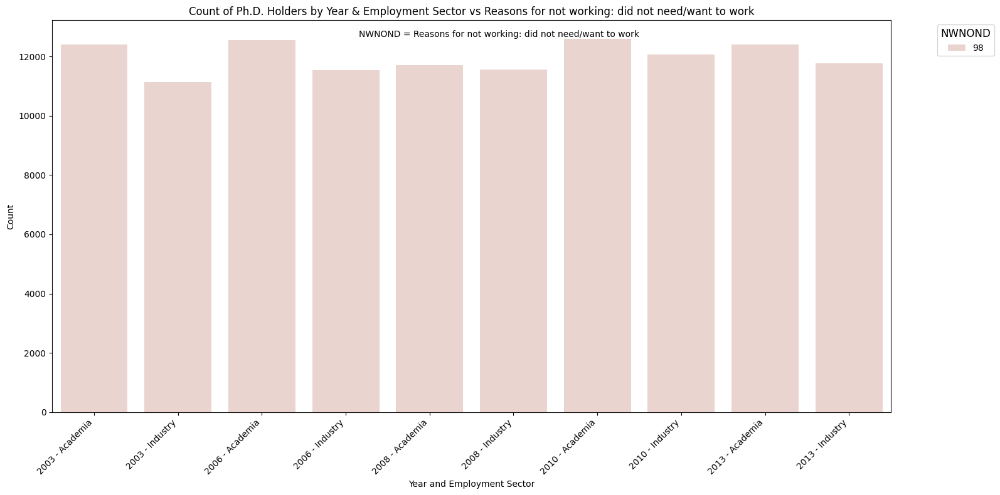

In [264]:
plot_years_and_variable(df2, 'NWNOND')

We will discard this variable and its related variables because there is only skipped answers.

In [265]:
columns_to_drop.append('NWNOND')

### NWOCNA

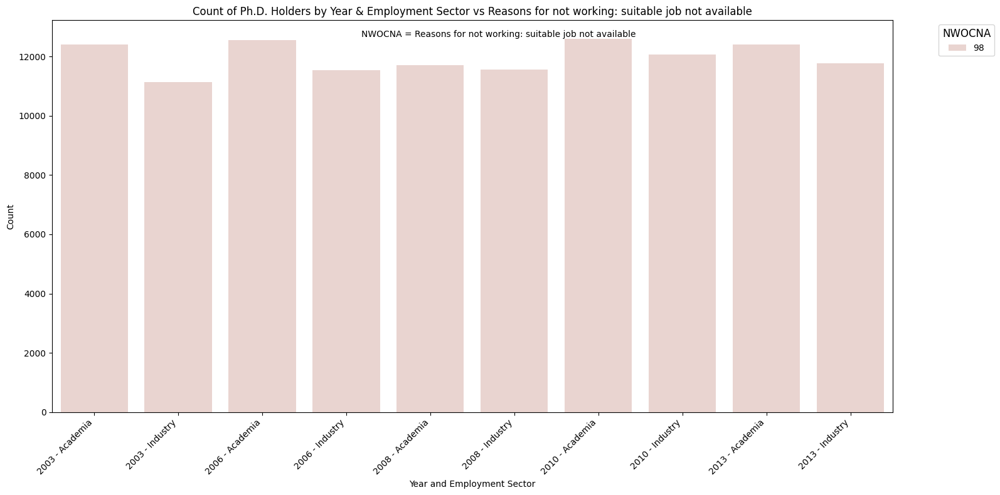

In [266]:
plot_years_and_variable(df2, 'NWOCNA')

We will discard this variable and its related variables because there is only skipped answers.

In [267]:
columns_to_drop.append('NWOCNA')

### NWOCNA

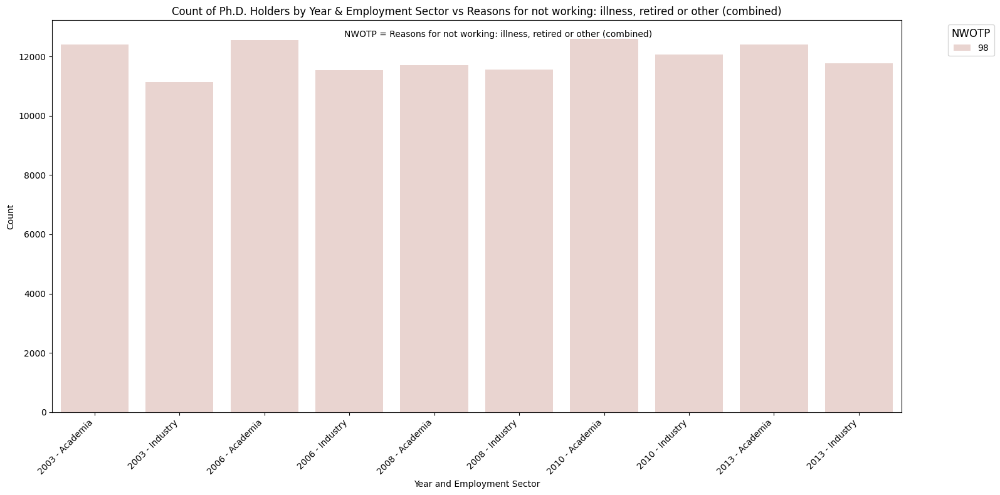

In [268]:
plot_years_and_variable(df2, 'NWOTP')

We will discard this variable and its related variables because there is only skipped answers.

In [269]:
columns_to_drop.append('NWOTP')

### NWSTU

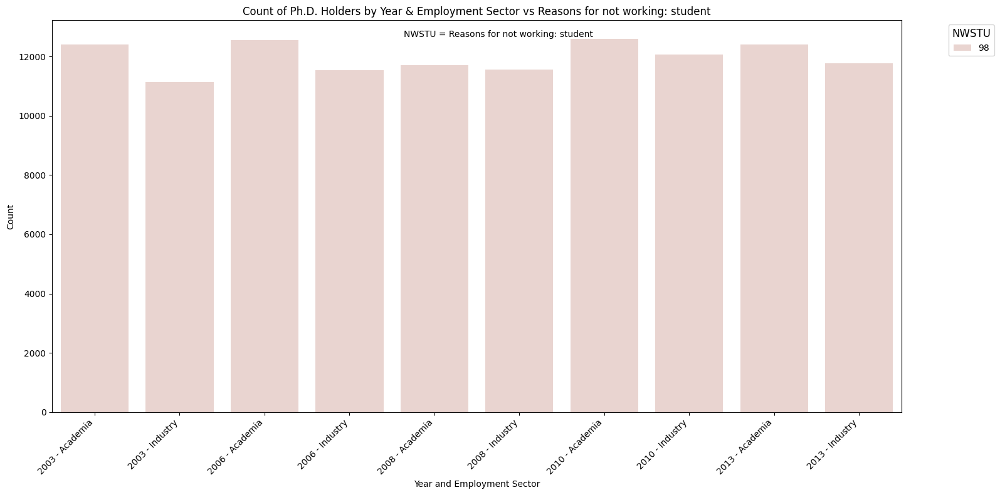

In [270]:
plot_years_and_variable(df2, 'NWSTU')

We will discard this variable and its related variables because there is only skipped answers.

In [271]:
columns_to_drop.append('NWSTU')